### Vibrometer Measurements of Car
##### Measurement Summary:
- car off
- **car on**
- **car on, music playing**
- revving car engine

This notebook creates plots for when the car is on/not playing music and when it is on/playing music

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal
import scipy.stats as ss
from sklearn.preprocessing import MinMaxScaler
import scipy.fft
import pywt
from scipy.signal.windows import hann
from scipy import interpolate
from scipy.ndimage import uniform_filter

***
### Car on, no music
##### Load data:

In [4]:
# Load data:
# (make sure the .ipynb file is in the same folder as the data)
column_names1 = ['Time1 (s)', 'Signal1 (m)']
df1 = pd.read_table("oncar1.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names1)
#print(df1.head())

column_names2 = ['Time2 (s)', 'Signal2 (m)']
df2 = pd.read_table("caron2.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names2)
#print(df2.head())

column_names3 = ['Time3 (s)', 'Signal3 (m)']
df3 = pd.read_table("caron3.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names3)
#print(df3.head())

column_names4 = ['Time4 (s)', 'Signal4 (m)']
df4 = pd.read_table("caron4.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names4)
#print(df4.head())

column_names5 = ['Time5 (s)', 'Signal5 (m)']
df5 = pd.read_table("caron5.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names5)
#print(df5.head())
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# Then file naming convention changes... Clarify with Mika
column_names6 = ['Time6 (s)', 'Signal6 (m)']
df6 = pd.read_table("caronr1.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names6)

column_names7 = ['Time7 (s)', 'Signal7 (m)']
df7 = pd.read_table("caronr2.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names7)

column_names8 = ['Time8 (s)', 'Signal8 (m)']
df8 = pd.read_table("caronr3.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names8)

column_names9 = ['Time9 (s)', 'Signal9 (m)']
df9 = pd.read_table("caronw1.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names9)

column_names10 = ['Time10 (s)', 'Signal10 (m)']
df10 = pd.read_table("caronw2.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names10)

column_names11 = ['Time11 (s)', 'Signal11 (m)']
df11 = pd.read_table("caronw3.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=column_names11)

##### Plot Time Series:

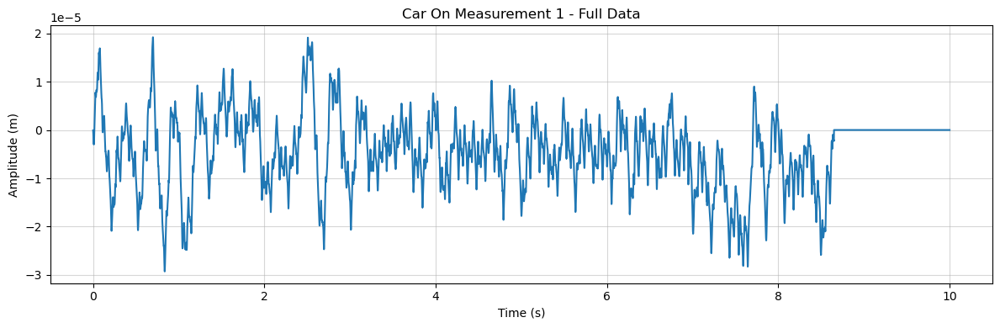

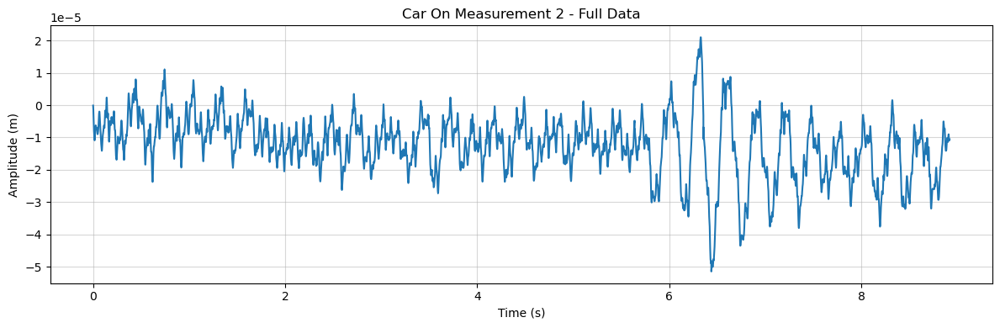

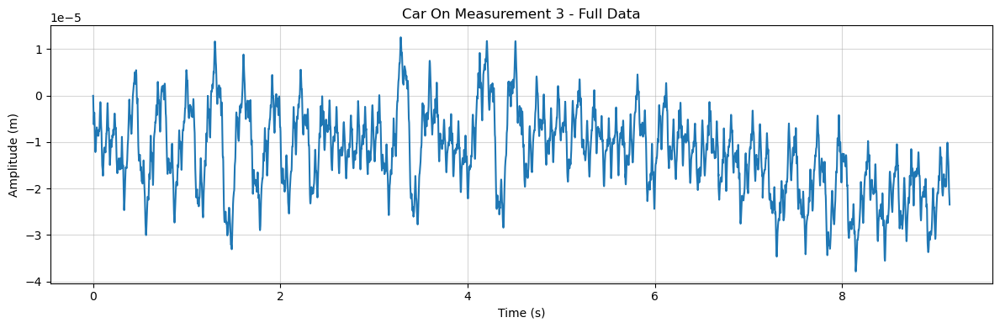

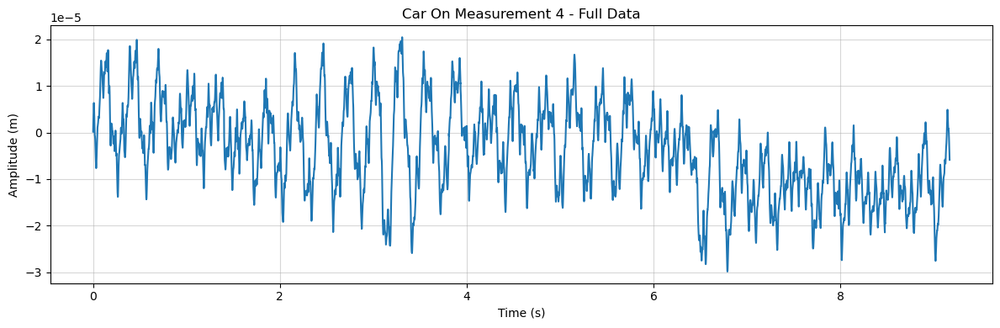

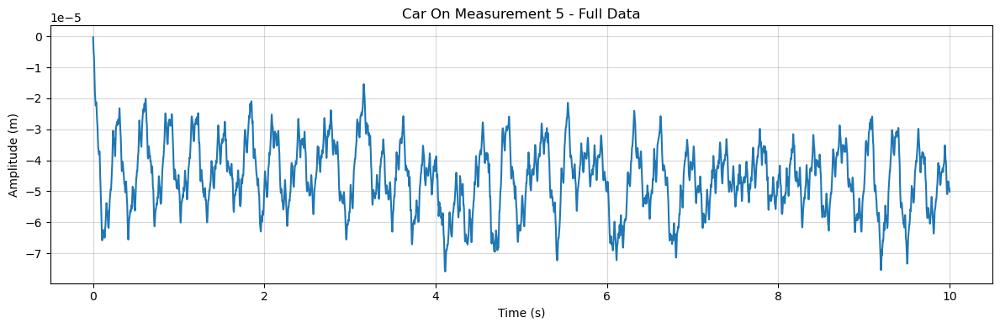

...

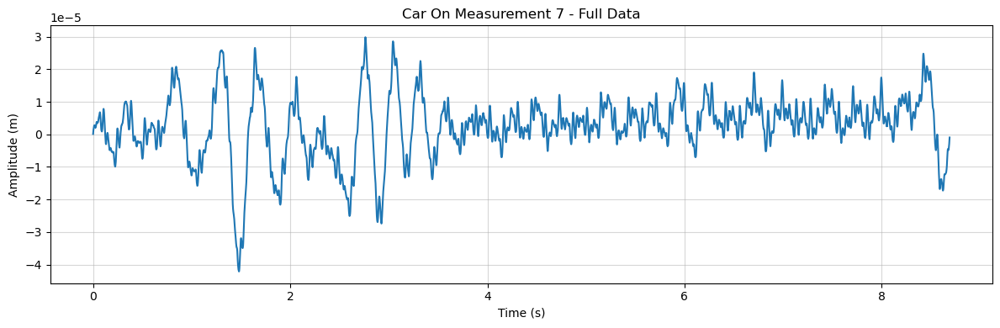

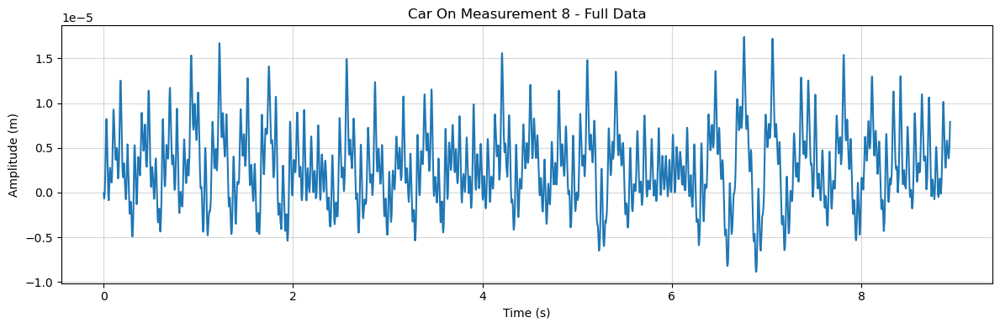

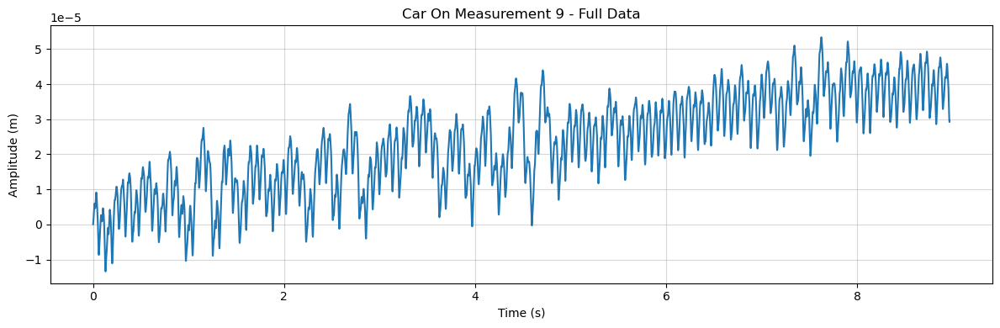

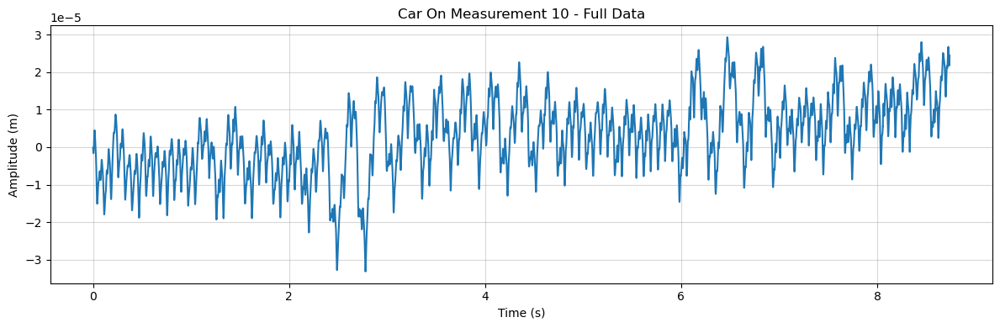

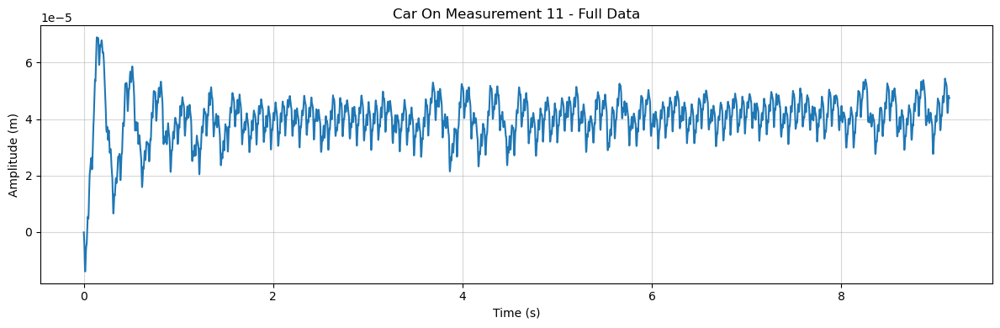

In [6]:
car_on_dataframes = [df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11] # add more after loading more dataframes
for i, dframe in enumerate(car_on_dataframes):
    time_column = f"Time{i+1} (s)"
    signal_column = f"Signal{i+1} (m)"
    # Plot:
    plt.figure(figsize=(12,4))
    plt.plot(dframe[time_column], dframe[signal_column], label=f"Car On Measurement {i+1} - Full Data")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (m)")
    plt.grid(True,alpha=0.5)
    plt.title(f"Car On Measurement {i+1} - Full Data")
    plt.tight_layout()
    plt.show()

##### Detrending and Shifting Data to Zero Mean:

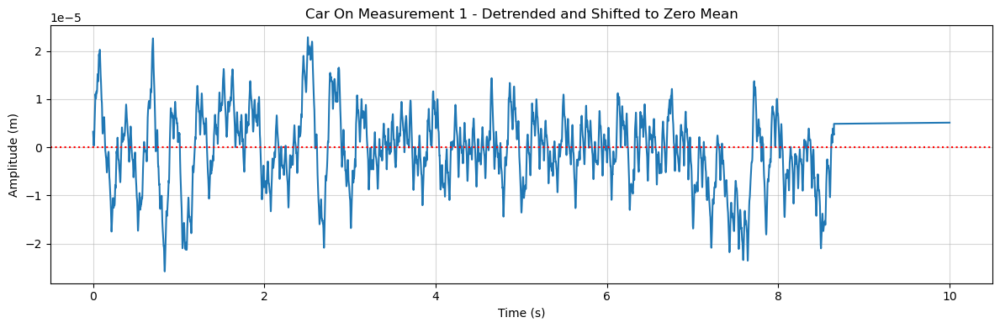

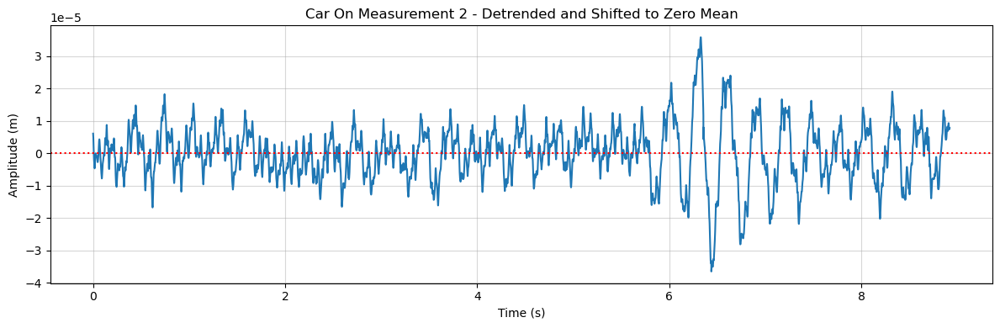

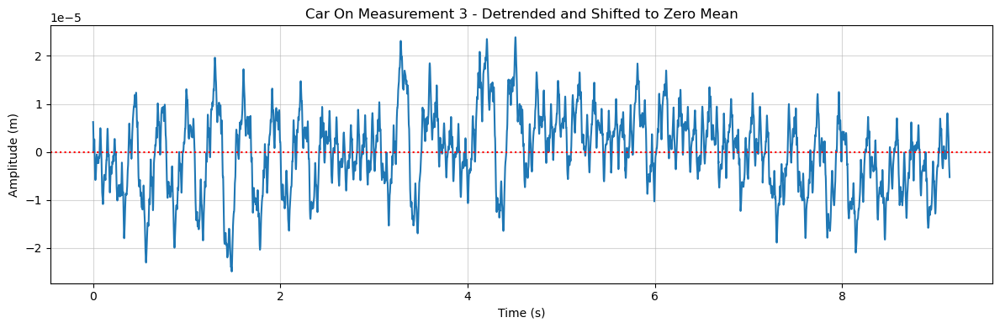

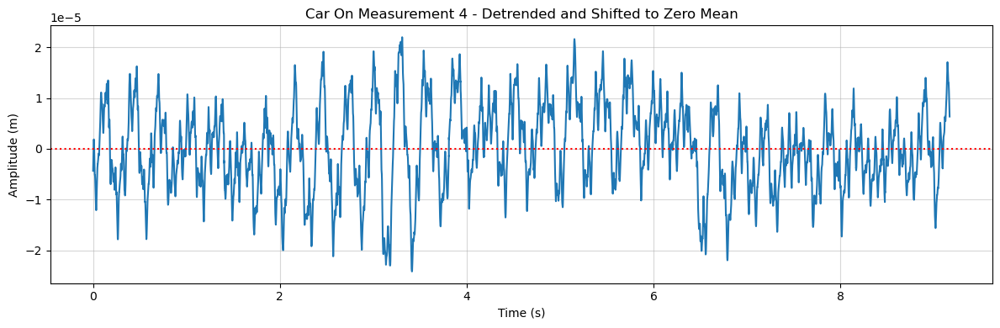

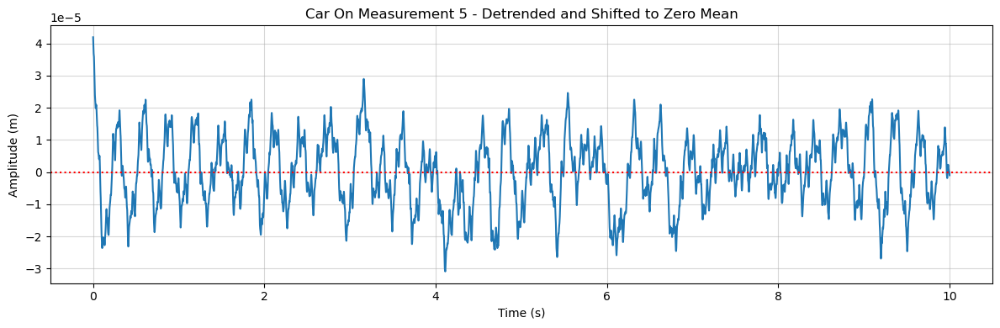

...

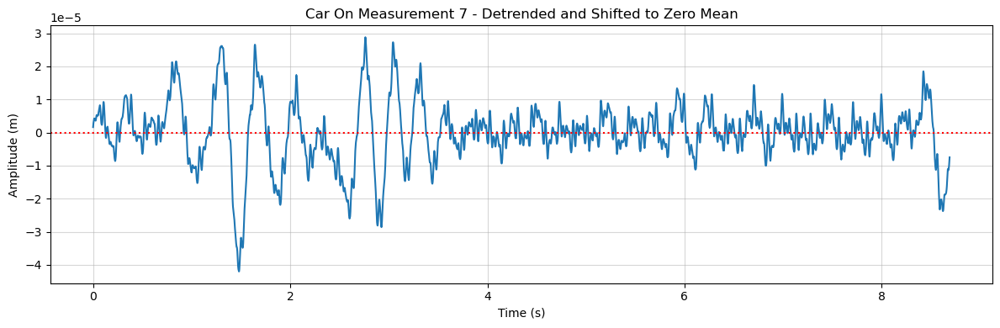

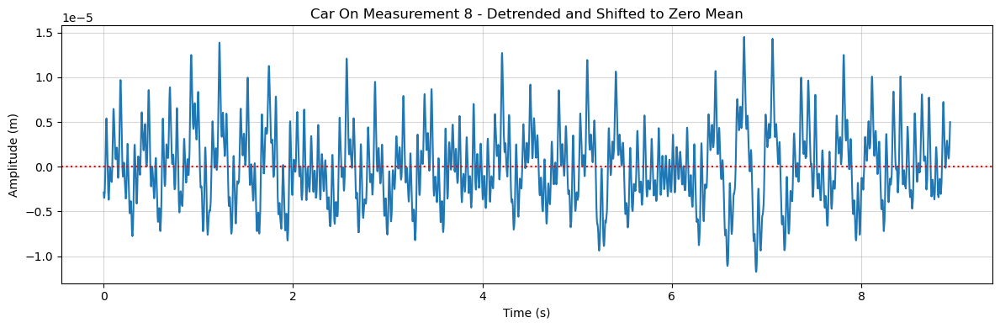

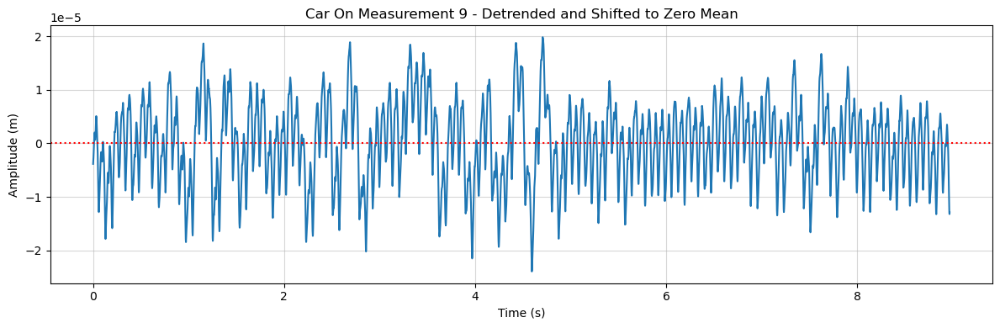

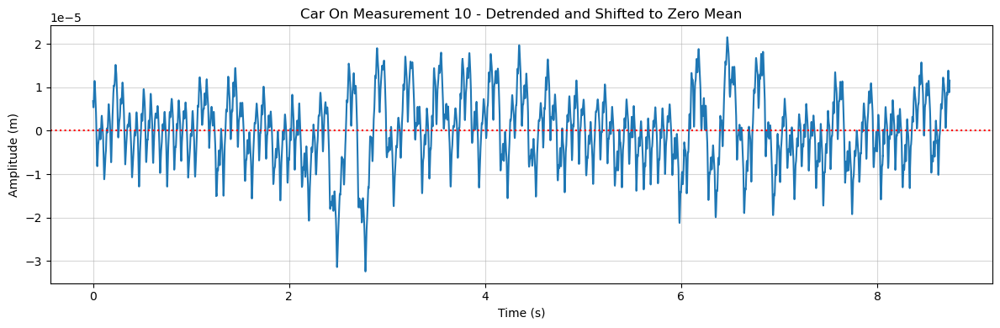

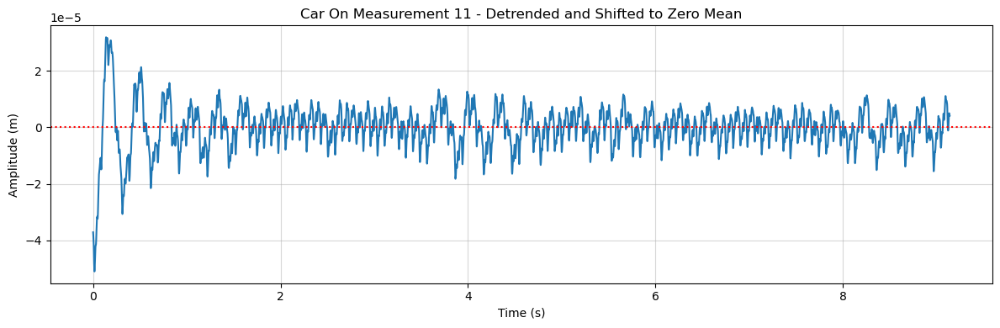

In [8]:
for i, dframe in enumerate(car_on_dataframes):
    time_column = f"Time{i+1} (s)"
    signal_column = f"Signal{i+1} (m)"
    detrended_signal_column = f"Signal{i+1} Detrended (m)"
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    
    # Detrend
    dframe[detrended_signal_column] = signal.detrend(dframe[signal_column], type='linear') 
    # Shift Mean to ~Zero (without normalizing)
    dframe[mean_shifted_column] = dframe[detrended_signal_column] - dframe[detrended_signal_column].mean()

    # Plot:
    plt.figure(figsize=(12,4))
    plt.plot(dframe[time_column], dframe[mean_shifted_column], label=f"Car On Measurement {i+1} - Full Data")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (m)")
    plt.grid(True,alpha=0.5)
    plt.axhline(y=0.0, label="0.0", color='red', linestyle=":")
    plt.title(f"Car On Measurement {i+1} - Detrended and Shifted to Zero Mean")
    plt.tight_layout()
    plt.show()

##### Tapering Detrended and Shifted (DS) Time Series
- A Hann window is used for tapering

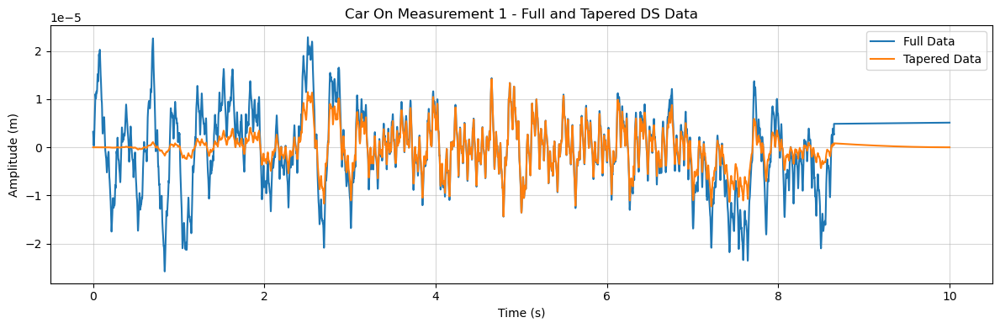

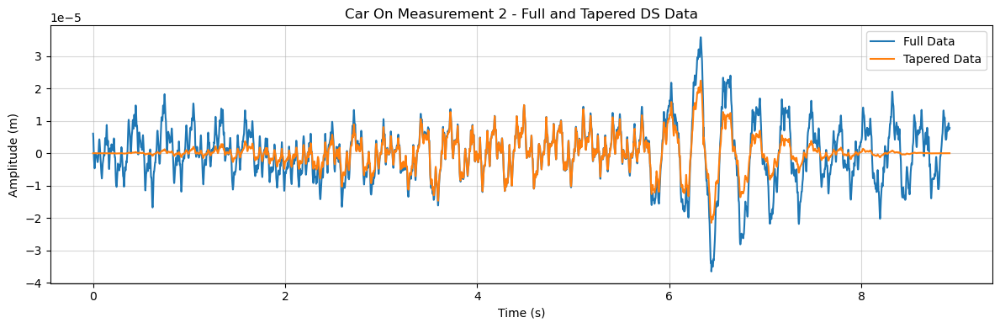

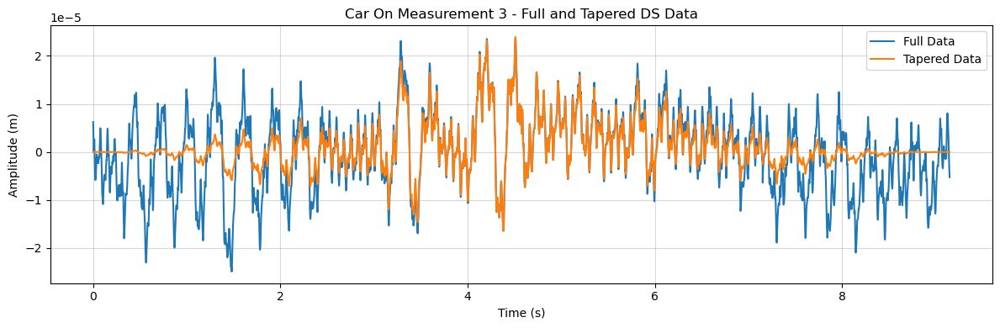

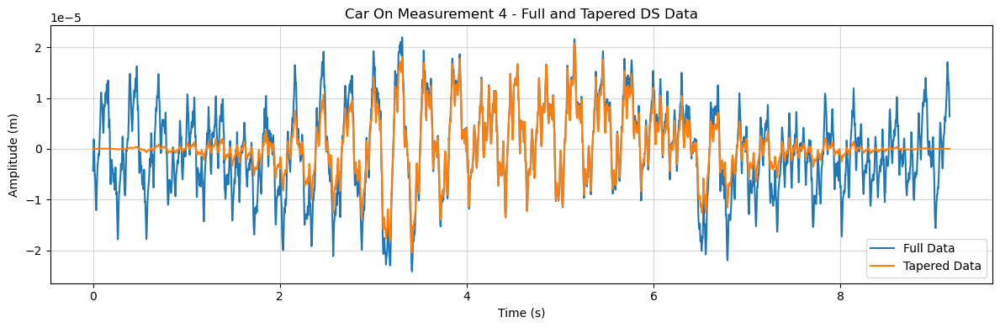

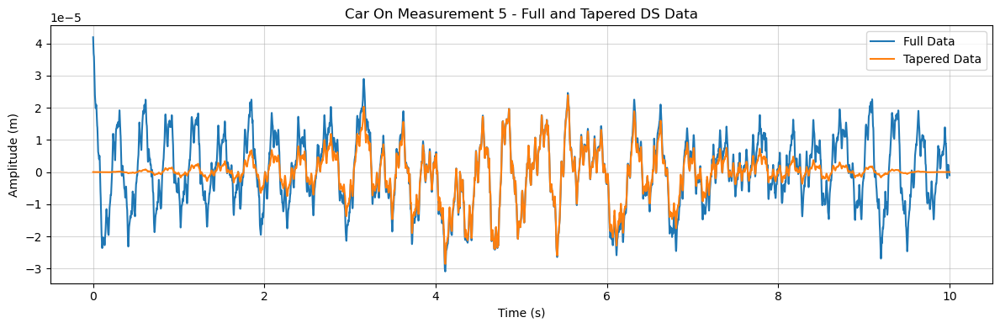

...

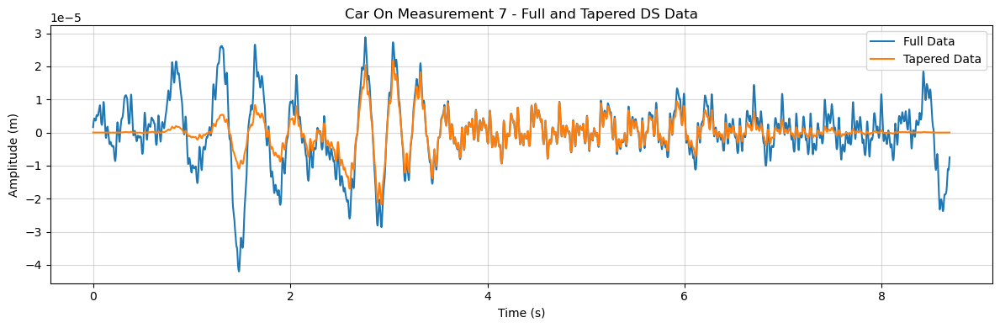

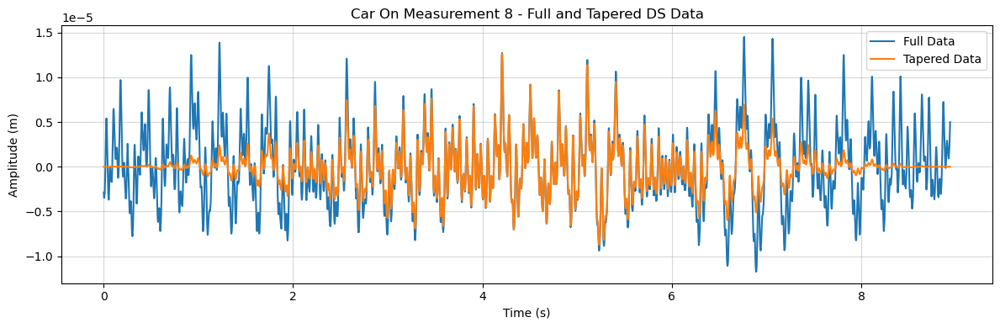

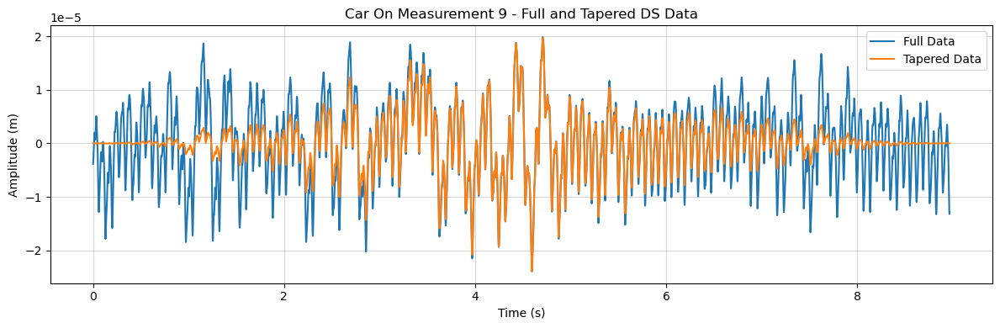

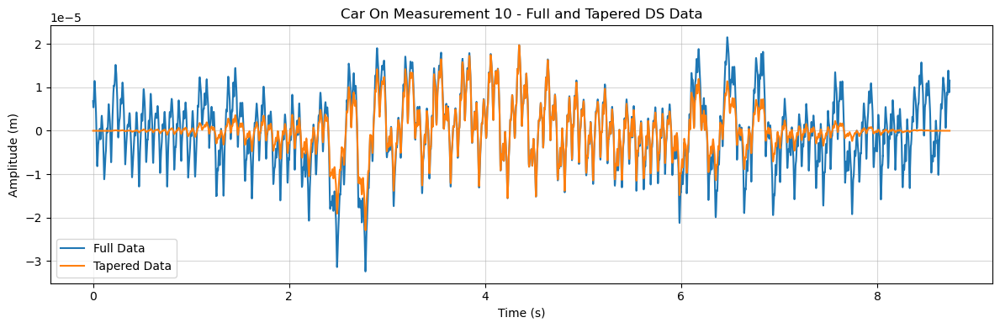

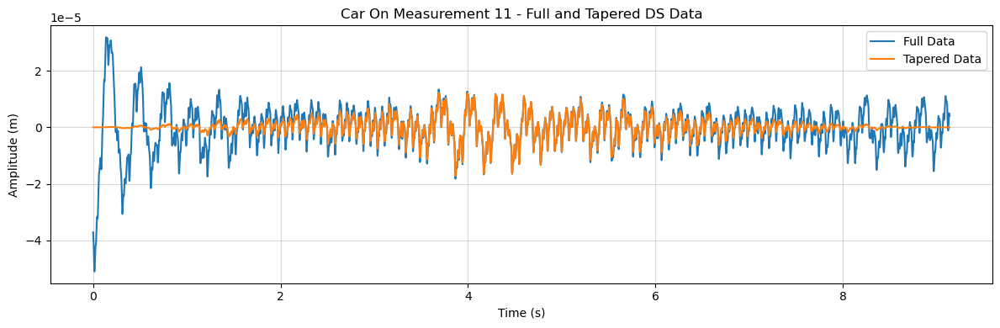

In [10]:
def apply_hann_window(data, column):
    window = np.hanning(len(data))
    windowed_data = data[column] * window
    return windowed_data
    
for i, dframe in enumerate(car_on_dataframes):
    tapered_data = []
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    hann_result = apply_hann_window(dframe, mean_shifted_column) # taper all dataframes
    tapered_data.append(hann_result)
    time_column = f"Time{i+1} (s)" # need time column for plotting
    # Plot:
    plt.figure(figsize=(12,4))
    plt.plot(dframe[time_column], dframe[mean_shifted_column], label=f"Full Data")
    plt.plot(dframe[time_column], tapered_data[-1], label=f"Tapered Data")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (m)")
    plt.grid(True,alpha=0.5)
    plt.title(f"Car On Measurement {i+1} - Full and Tapered DS Data")
    plt.legend()
    plt.tight_layout()
    plt.show()

##### 'percent_check' function for tapering

In [12]:
def percent_check_tapered(original_data, tapered_data_full, padding, tolerance=0.05):
    """original_data : Original unpadded time series (array)
    tapered_data_full : Tapered time series, includes padding (array)
    padding : Amount of padding added to each end (int)
    tolerance : Acceptable error as fraction of data range (float)"""
    # Extract original from tapered data (remove padding)
    if padding > 0:
        tapered_original_region = tapered_data_full[padding:-padding]
    else:
        tapered_original_region = tapered_data_full
    
    # Direct comparison: tapered vs original
    abs_errors = np.abs(original_data - tapered_original_region)
    # normalization
    data_range = np.max(original_data) - np.min(original_data)
    normalized_errors = abs_errors / data_range
    
    # Calculate metrics
    within_tolerance = normalized_errors <= tolerance
    pct_within = (np.sum(within_tolerance) / len(within_tolerance))*100
    
    # Mean Absolute Error (MAE) metrics
    mae = np.mean(abs_errors)
    std_original = np.std(original_data)
    mae_pct_std = (mae / std_original)*100
    
    passes = pct_within >= 95
    
    results = {'padding': padding,
        'tolerance': f'{tolerance*100}%',
        'passes': passes,
        'points_within_tolerance': f'{pct_within: .4f}%',
        'max_normalized_error': f'{(np.max(normalized_errors)*100): .4f}%',
        'mean_abs_error': f'{mae: .4f}',
        'mae_as_%_of_std': f'{mae_pct_std: .4f}%',
        'num_points': len(original_data),
        'data_range': f'{data_range: .4f}'}
    
    return results
    
for i, dframe in enumerate(car_on_dataframes):
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    tapered_data = []
    hann_result = apply_hann_window(dframe, mean_shifted_column) # taper all dataframes
    tapered_data.append(hann_result)
    percent_check_tapered_results = percent_check_tapered(dframe[mean_shifted_column], tapered_data[-1], padding=0, tolerance=0.05)
    print(f"dataframe: df{i+1}")
    print(percent_check_tapered_results)
    print("")

dataframe: df1
{'padding': 0, 'tolerance': '5.0%', 'passes': False, 'points_within_tolerance': ' 52.6148%', 'max_normalized_error': ' 49.4396%', 'mean_abs_error': ' 0.0000', 'mae_as_%_of_std': ' 44.0330%', 'num_points': 250000, 'data_range': ' 0.0000'}

dataframe: df2
{'padding': 0, 'tolerance': '5.0%', 'passes': False, 'points_within_tolerance': ' 64.8927%', 'max_normalized_error': ' 26.2016%', 'mean_abs_error': ' 0.0000', 'mae_as_%_of_std': ' 38.4707%', 'num_points': 222979, 'data_range': ' 0.0001'}

dataframe: df3
{'padding': 0, 'tolerance': '5.0%', 'passes': False, 'points_within_tolerance': ' 58.2493%', 'max_normalized_error': ' 45.4861%', 'mean_abs_error': ' 0.0000', 'mae_as_%_of_std': ' 40.3502%', 'num_points': 228729, 'data_range': ' 0.0000'}

dataframe: df4
{'padding': 0, 'tolerance': '5.0%', 'passes': False, 'points_within_tolerance': ' 53.9984%', 'max_normalized_error': ' 38.3385%', 'mean_abs_error': ' 0.0000', 'mae_as_%_of_std': ' 36.1005%', 'num_points': 229229, 'data_rang

##### Subsampling DS Time Series

Original sampling rate for Signal1 Zero Mean (m): 25000 Hz
New sampling rate for Signal1 Zero Mean (m): 500 Hz


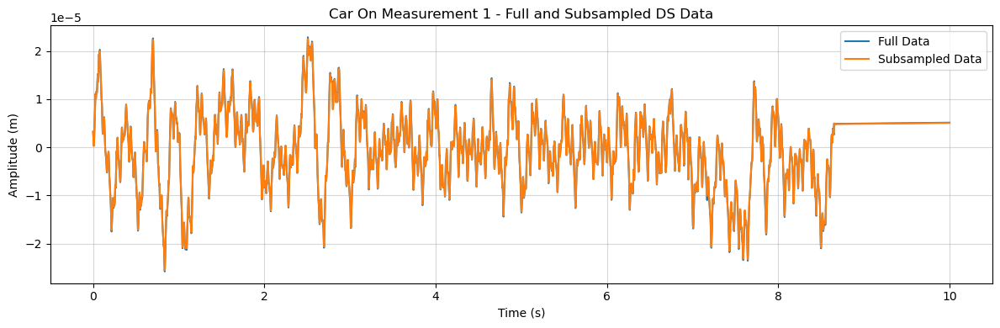

Original sampling rate for Signal2 Zero Mean (m): 25000 Hz
New sampling rate for Signal2 Zero Mean (m): 500 Hz


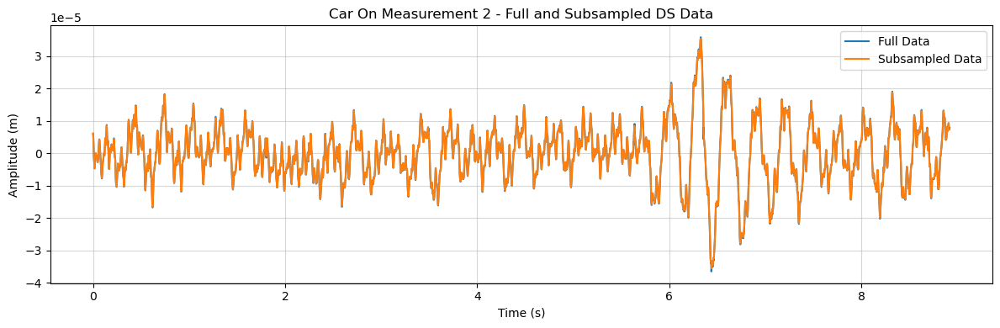

Original sampling rate for Signal3 Zero Mean (m): 25000 Hz
New sampling rate for Signal3 Zero Mean (m): 500 Hz


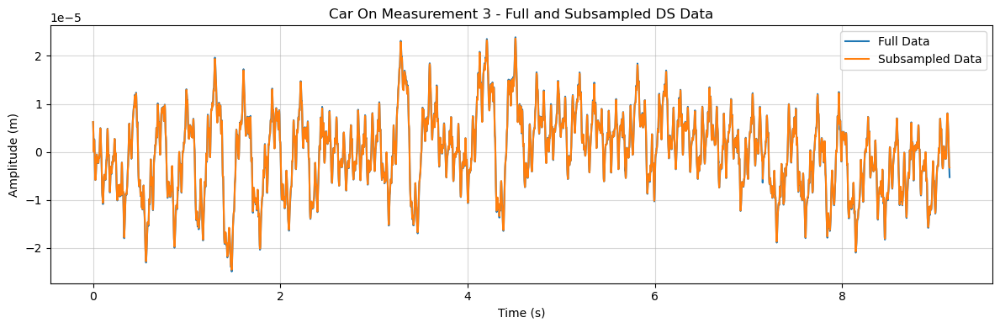

Original sampling rate for Signal4 Zero Mean (m): 25000 Hz
New sampling rate for Signal4 Zero Mean (m): 500 Hz


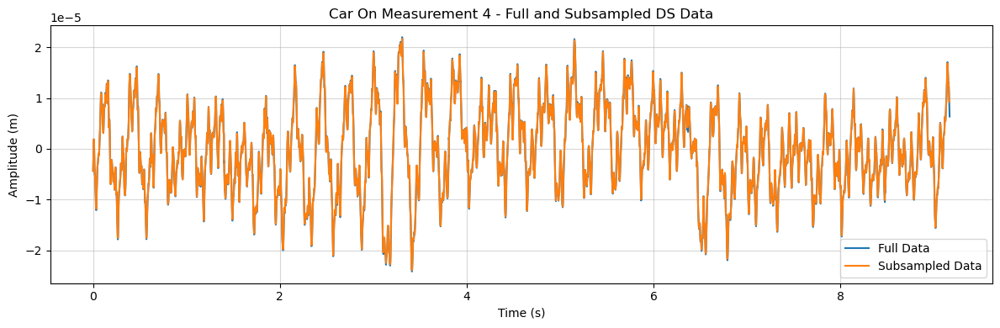

Original sampling rate for Signal5 Zero Mean (m): 25000 Hz
New sampling rate for Signal5 Zero Mean (m): 500 Hz


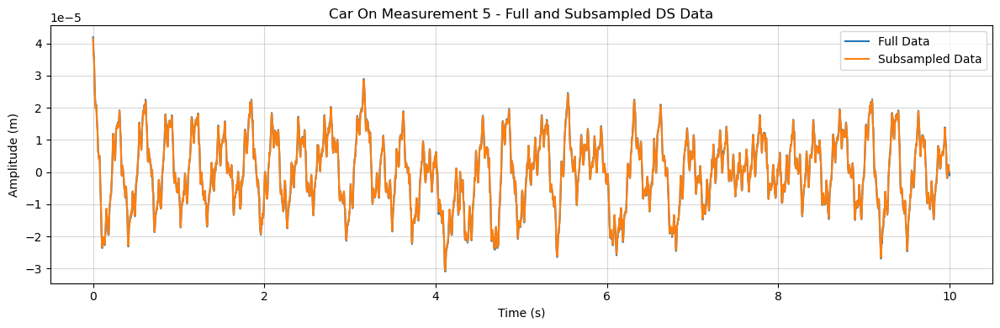

Original sampling rate for Signal6 Zero Mean (m): 25000 Hz
New sampling rate for Signal6 Zero Mean (m): 500 Hz


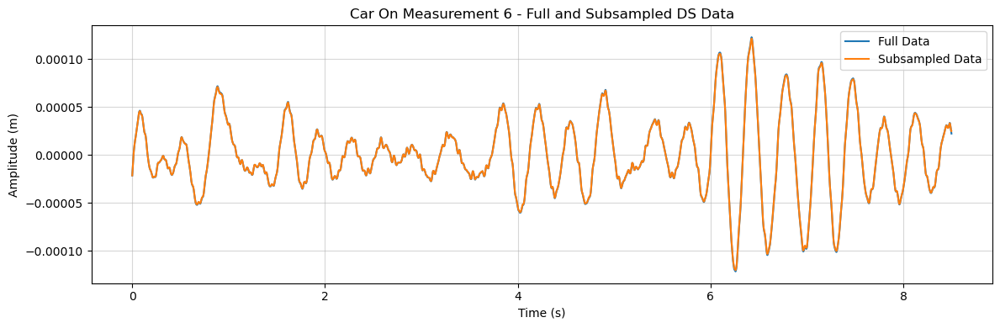

Original sampling rate for Signal7 Zero Mean (m): 25000 Hz
New sampling rate for Signal7 Zero Mean (m): 500 Hz


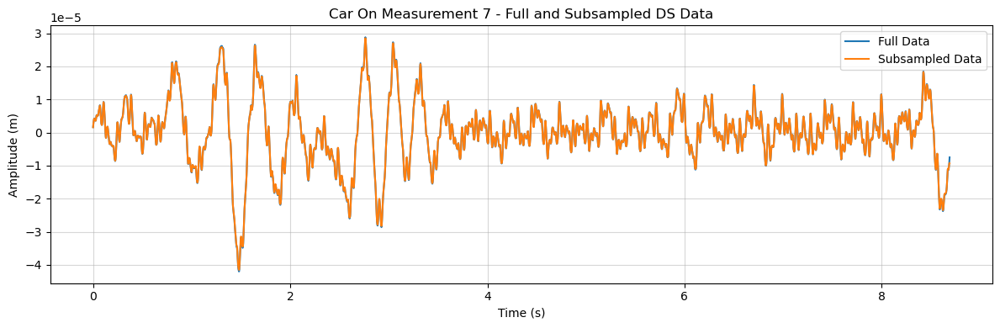

Original sampling rate for Signal8 Zero Mean (m): 25000 Hz
New sampling rate for Signal8 Zero Mean (m): 500 Hz


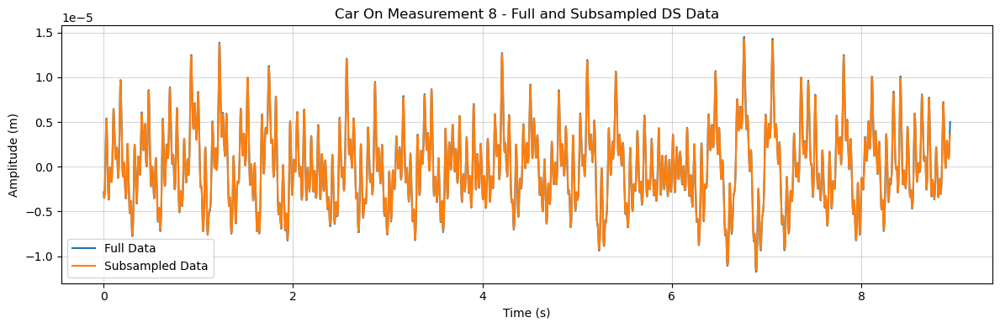

Original sampling rate for Signal9 Zero Mean (m): 25000 Hz
New sampling rate for Signal9 Zero Mean (m): 500 Hz


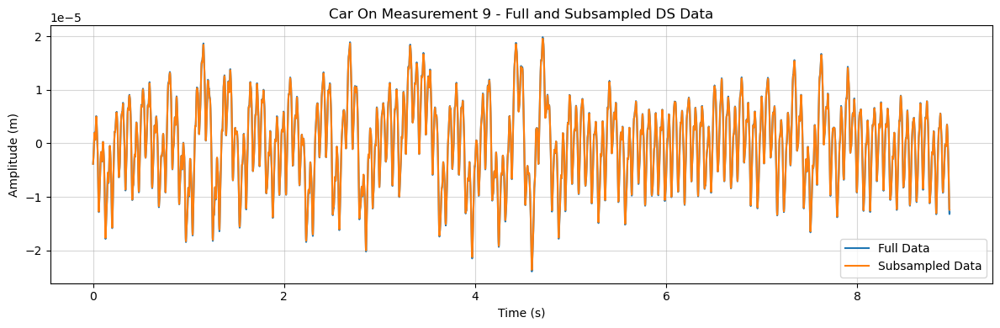

Original sampling rate for Signal10 Zero Mean (m): 25000 Hz
New sampling rate for Signal10 Zero Mean (m): 500 Hz


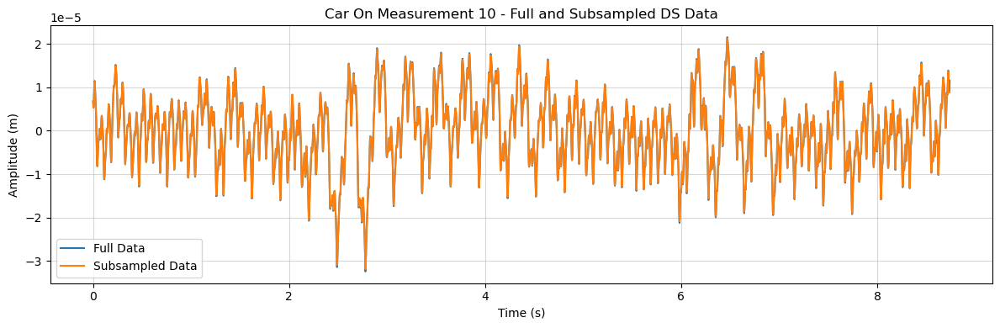

Original sampling rate for Signal11 Zero Mean (m): 25000 Hz
New sampling rate for Signal11 Zero Mean (m): 500 Hz


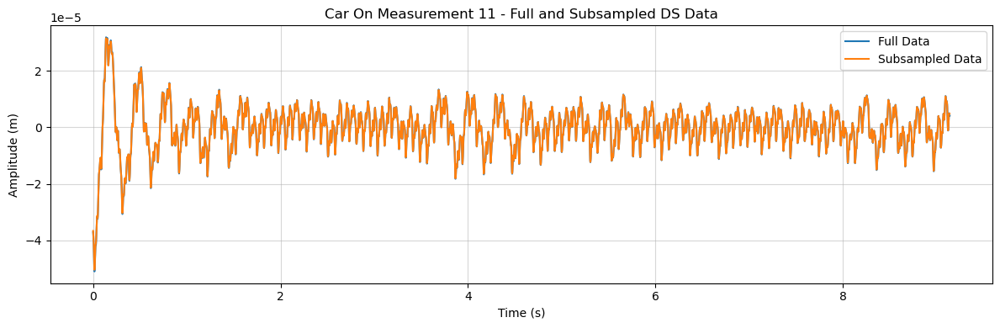

In [14]:
# Subsampling the tapered time series
#Sampling Rate = Total Number of Samples / Total Time (in seconds)
def subsample(data, column, decimation_factor):
    """Subsample data using scipy.signal.decimate with anti-aliasing filter.
    data: input data e.g. df1
    column: column to subsample (e.g. "Signal1 Zero Mean (m)"), string
    decimation_factor: factor by which to reduce sampling rate"""
    num_samples=len(data[column])
    sampling_time=data.iloc[-1, 0] #get last value in first column (time (s))
    original_sampling_rate = int(num_samples/sampling_time)
    print(f"Original sampling rate for {column}: {original_sampling_rate} Hz")
    # scipy.signal.decimate applies an anti-aliasing filter automatically
    # Use a higher order filter for better anti-aliasing (default is 8)
    decimated_data = scipy.signal.decimate(data[column], decimation_factor, ftype='iir', zero_phase=True) # 
    # get new sampling rate:
    new_sr = int(original_sampling_rate / decimation_factor)
    print(f"New sampling rate for {column}: {new_sr} Hz")
    return decimated_data, new_sr, original_sampling_rate

for i, dframe in enumerate(car_on_dataframes):
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    time_column = f"Time{i+1} (s)"
    subsample_result = subsample(dframe, mean_shifted_column, decimation_factor=50)
    subsampled_data = subsample_result[0]
    # sub_list = []
    # sub_list.append(subsampled_data)
    
    # Plot:
    plt.figure(figsize=(12,4))
    plt.plot(dframe[time_column], dframe[mean_shifted_column], label=f"Full Data")
    plt.plot(dframe[time_column][::50], subsampled_data, label=f"Subsampled Data") # Make sure time step is same as decimation_factor
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (m)")
    plt.grid(True, alpha=0.5)
    plt.title(f"Car On Measurement {i+1} - Full and Subsampled DS Data")
    plt.legend()
    #plt.xlim(4,5)
    plt.tight_layout()
    plt.show()

##### 'percent_check' function for subsampling

In [16]:
def percent_check_scipy_decimate(data, column, step, tolerance=0.05):
    x_original = np.arange(len(data))
    y_original = data[column].values
    
    # Get subsampled series
    x_subsampled = np.arange(0, len(data), step)
    y_subsampled=scipy.signal.decimate(data[column].values, step, ftype='iir', zero_phase=True)
    
    # Interpolate subsampled data back to original timestamps
    f_interp = interpolate.interp1d(x_subsampled, y_subsampled, kind='linear', fill_value='extrapolate')
    y_reconstructed = f_interp(x_original)
    
    # Calculate absolute errors
    abs_errors = np.abs(y_original - y_reconstructed)
    
    # Calculate data range (the scale of the data)
    data_range = np.max(y_original) - np.min(y_original)
    #print("data_range:", data_range)
    # Normalize errors by data range instead of individual values
    normalized_errors = abs_errors / data_range
    
    # Test if within tolerance
    within_tolerance = normalized_errors <= tolerance
    pct_within = (np.sum(within_tolerance) / len(within_tolerance)) * 100
    
    # Overall pass/fail
    passes = pct_within >= 95  # At least 95% of points within tolerance
    
    results = {'step': step,
        'tolerance': f'{tolerance*100}%',
        'passes': passes,
        'points_within_tolerance': f'{pct_within: .4f}%',
        'num_original_points': len(y_original),
        'num_subsampled_points': len(y_subsampled),
        'data_range': f'{data_range: .4f}',  
        'max_normalized_error': f'{(np.max(normalized_errors)*100): .4f}%' }
    return results

for i, dframe in enumerate(car_on_dataframes):
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    print(f"dataframe: df{i+1}")
    scipy_decimate_pct_check_results = percent_check_scipy_decimate(dframe, mean_shifted_column, step=50, tolerance=0.05)
    print(scipy_decimate_pct_check_results)
    print("")

dataframe: df1
{'step': 50, 'tolerance': '5.0%', 'passes': True, 'points_within_tolerance': ' 99.9952%', 'num_original_points': 250000, 'num_subsampled_points': 5000, 'data_range': ' 0.0000', 'max_normalized_error': ' 6.3634%'}

dataframe: df2
{'step': 50, 'tolerance': '5.0%', 'passes': True, 'points_within_tolerance': ' 99.9987%', 'num_original_points': 222979, 'num_subsampled_points': 4460, 'data_range': ' 0.0001', 'max_normalized_error': ' 7.3254%'}

dataframe: df3
{'step': 50, 'tolerance': '5.0%', 'passes': True, 'points_within_tolerance': ' 100.0000%', 'num_original_points': 228729, 'num_subsampled_points': 4575, 'data_range': ' 0.0000', 'max_normalized_error': ' 4.6457%'}

dataframe: df4
{'step': 50, 'tolerance': '5.0%', 'passes': True, 'points_within_tolerance': ' 99.9878%', 'num_original_points': 229229, 'num_subsampled_points': 4585, 'data_range': ' 0.0000', 'max_normalized_error': ' 6.2109%'}

dataframe: df5
{'step': 50, 'tolerance': '5.0%', 'passes': True, 'points_within_tol

##### Subsampling the Tapered DS Time Series

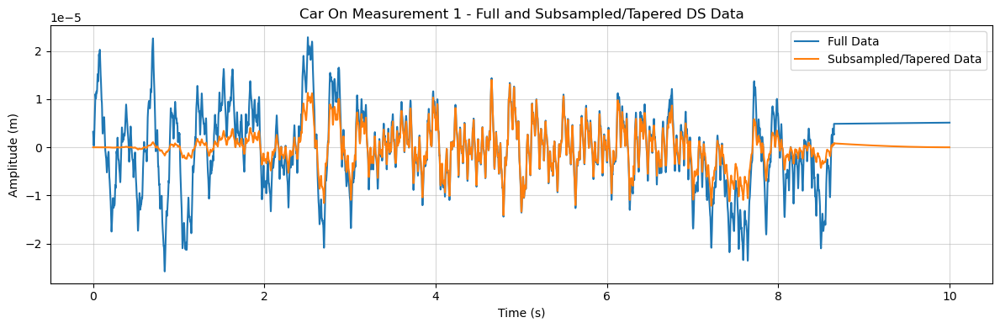

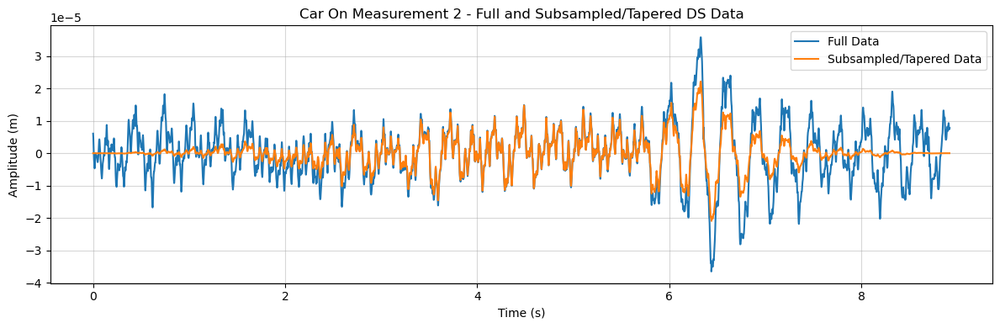

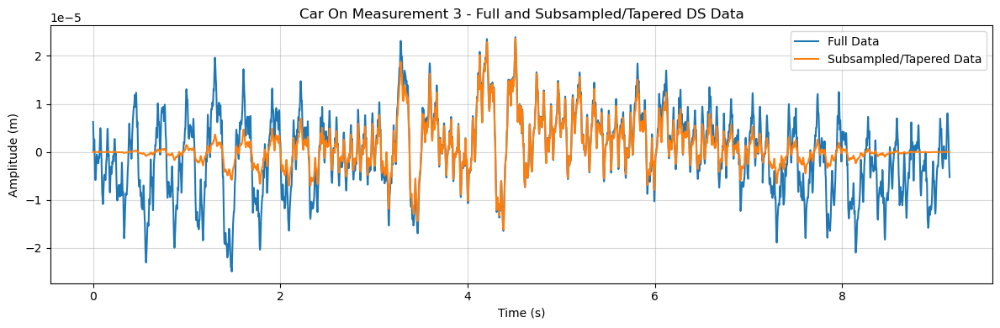

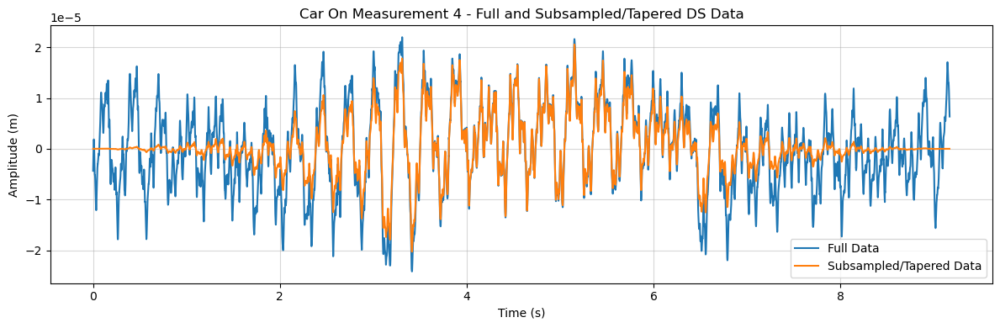

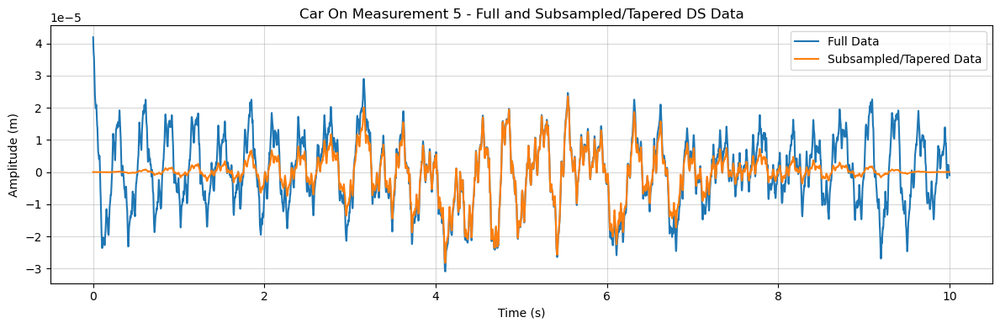

...

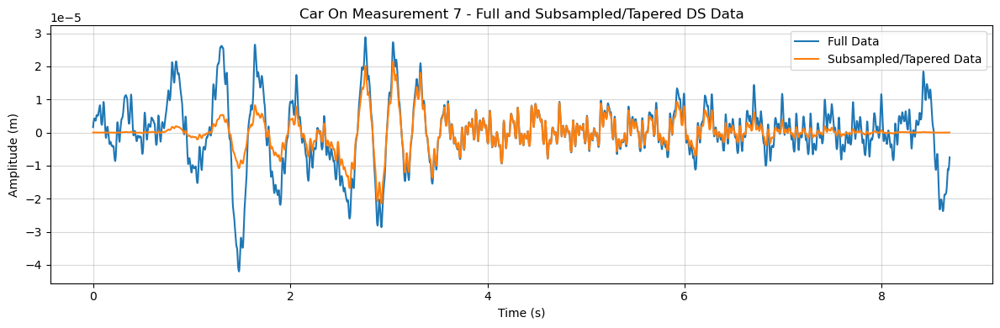

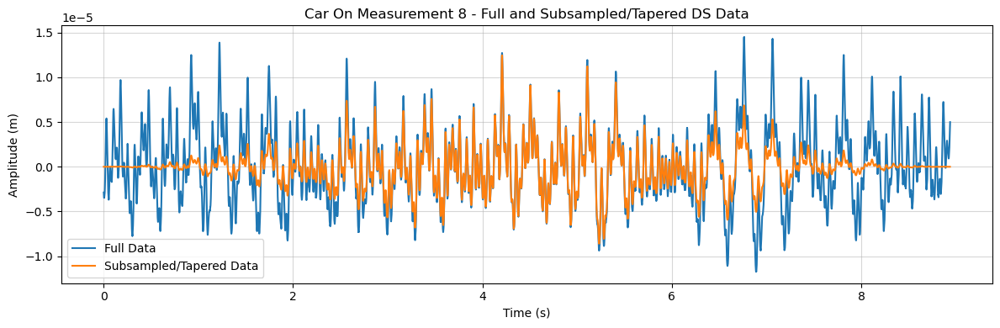

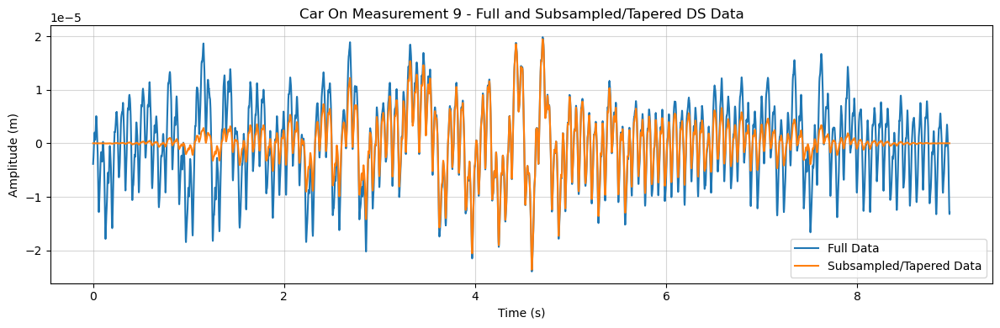

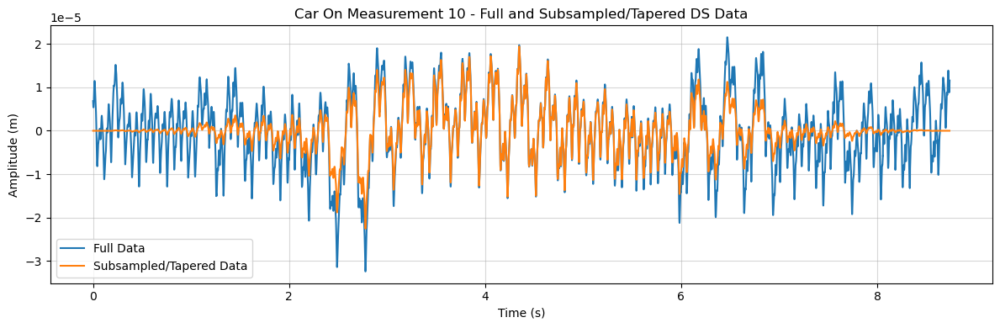

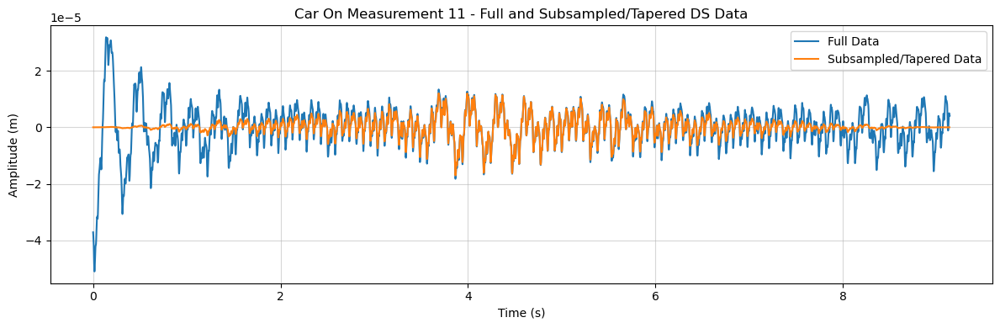

In [18]:
def sub_tapered(tapered_data, decimation_factor):
    sub_tap_data = scipy.signal.decimate(tapered_data, decimation_factor, ftype='iir', zero_phase=True)
    return sub_tap_data

for i, dframe in enumerate(car_on_dataframes):
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    time_column = f"Time{i+1} (s)"
    sub_tap_result = sub_tapered(apply_hann_window(dframe, mean_shifted_column), decimation_factor=50)
    # PLot:
    plt.figure(figsize=(12,4))
    plt.plot(dframe[time_column], dframe[mean_shifted_column], label=f"Full Data")
    plt.plot(dframe[time_column][::50], sub_tap_result, label=f"Subsampled/Tapered Data") # Make sure time step is same as decimation_factor
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (m)")
    plt.grid(True, alpha=0.5)
    plt.title(f"Car On Measurement {i+1} - Full and Subsampled/Tapered DS Data")
    plt.legend()
    plt.tight_layout()
    plt.show()

##### Fast Fourier Transform
- Plotting FFT spectra showing tapered/subsampled data overlayed onto full DS data for a given dataframe

dataframe: df1


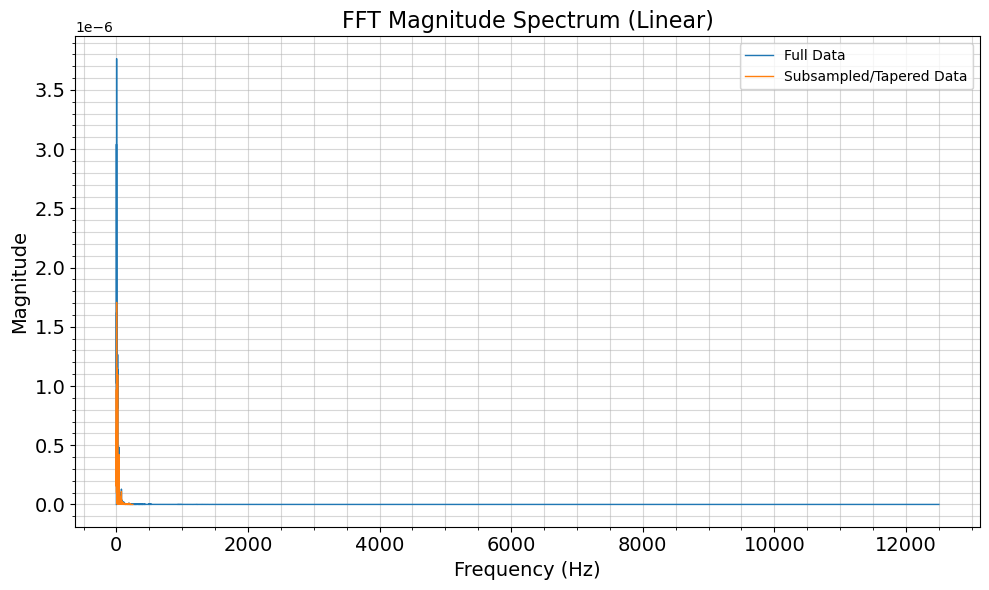

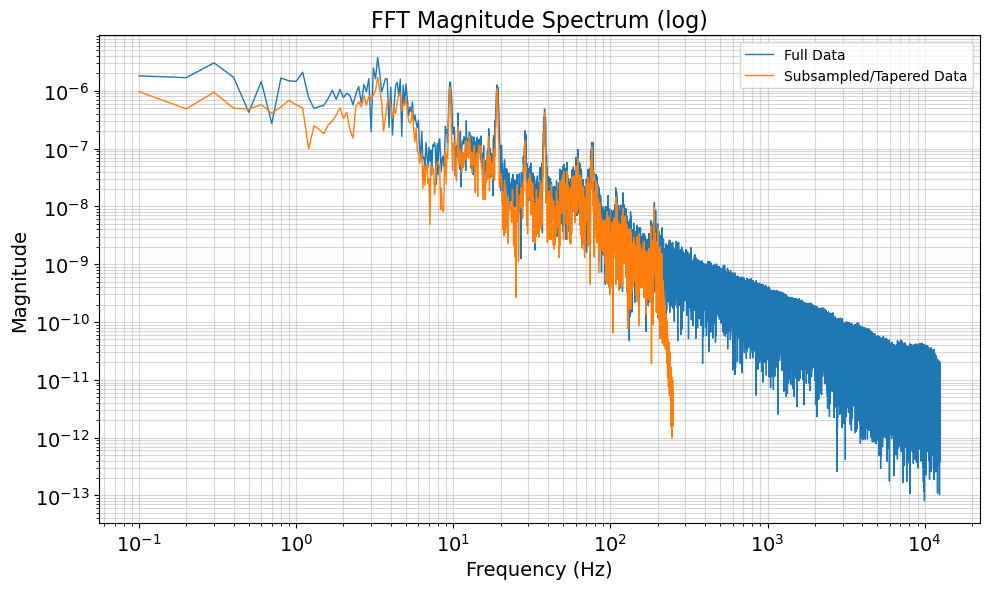

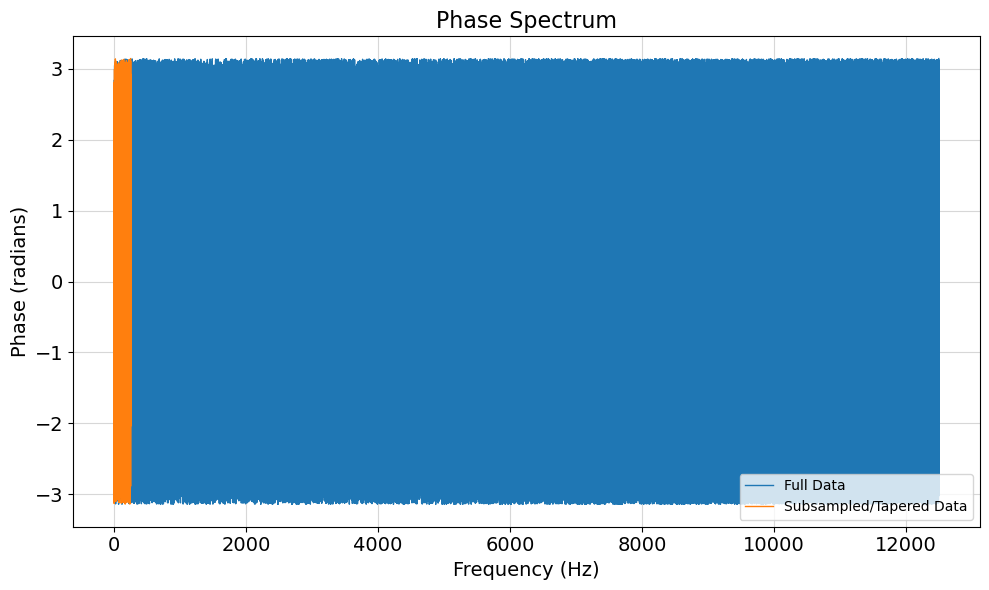

dataframe: df2


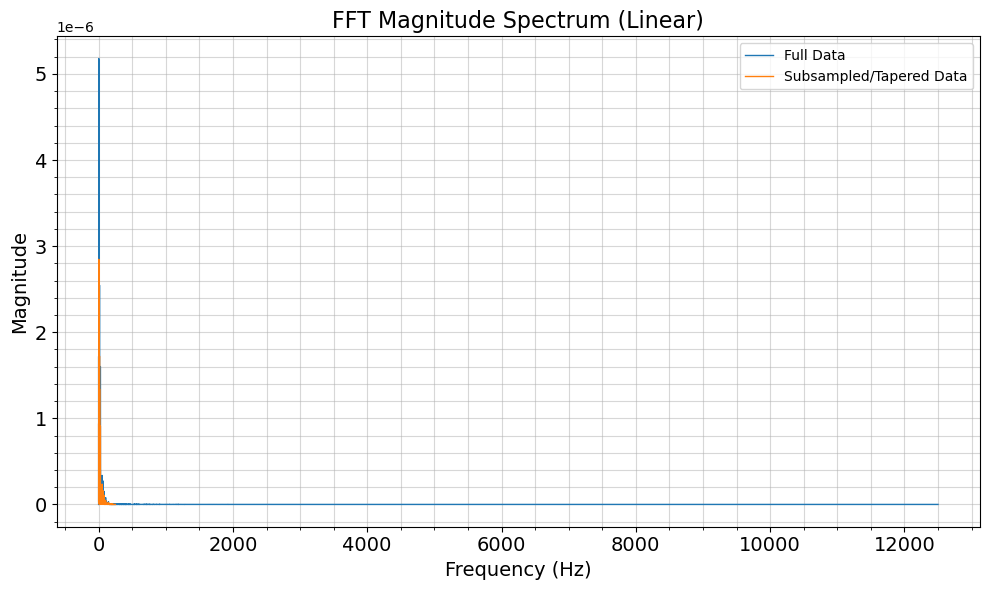

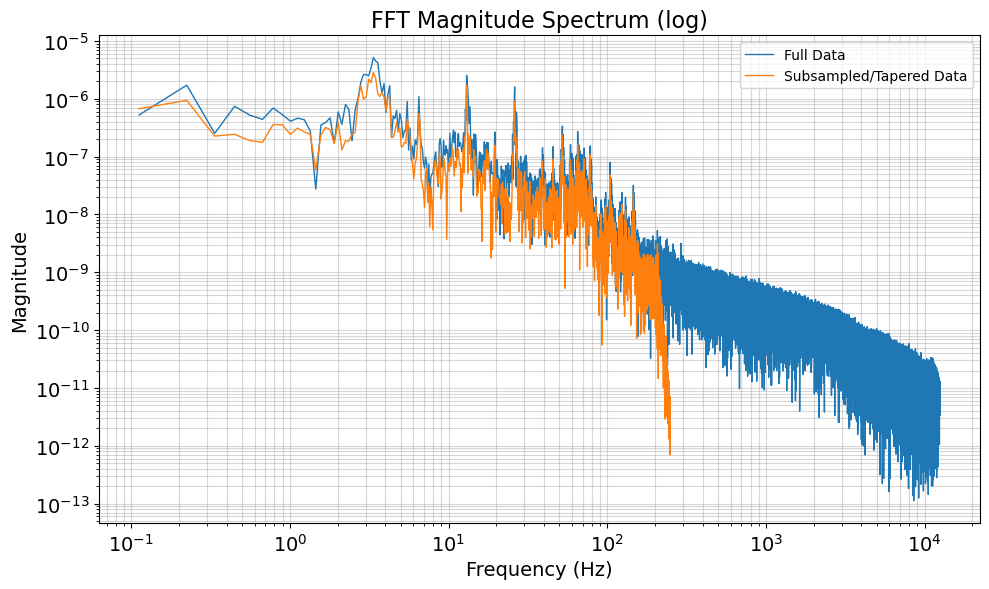

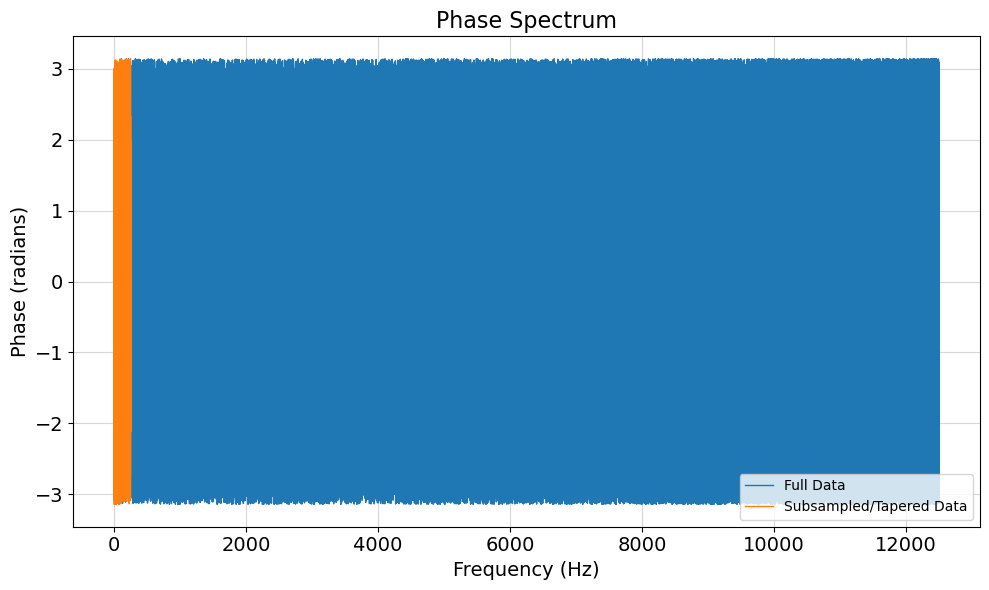

dataframe: df3


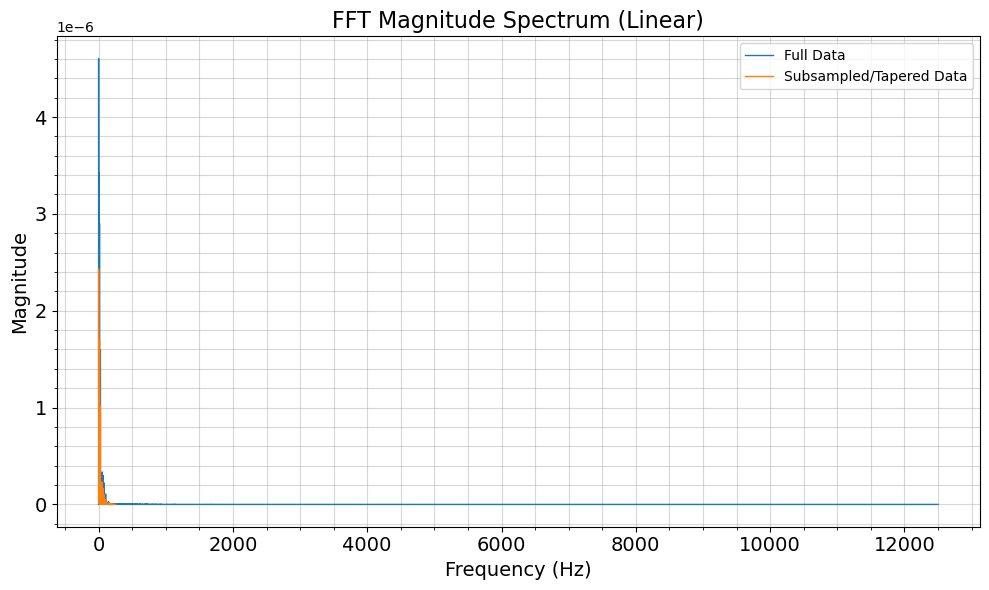

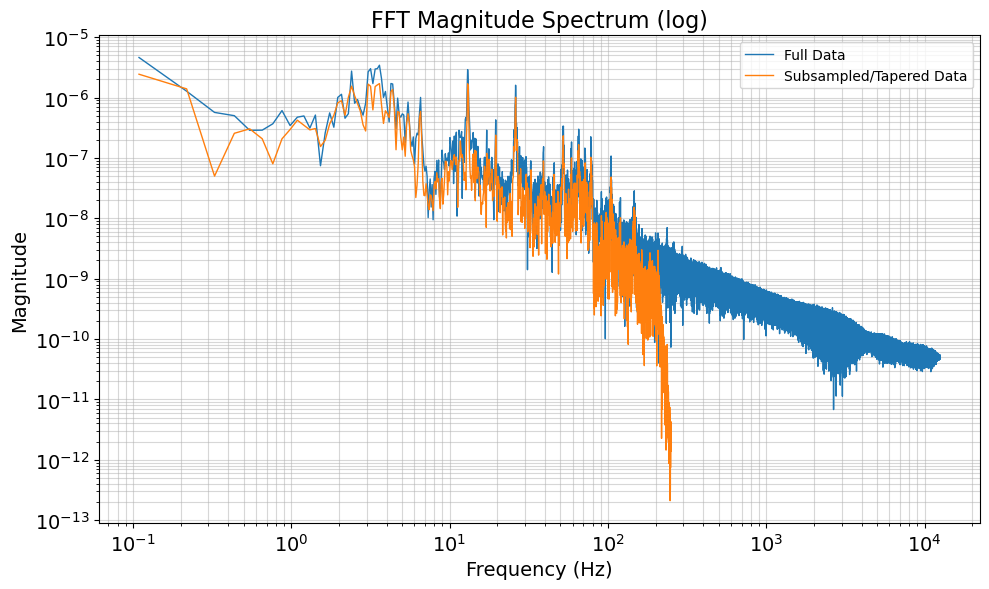

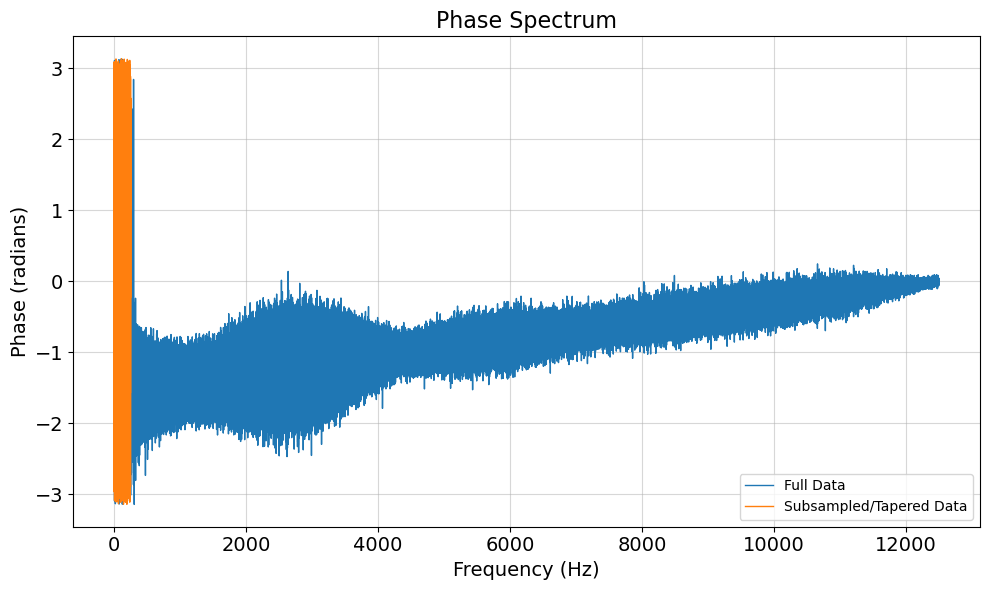

dataframe: df4


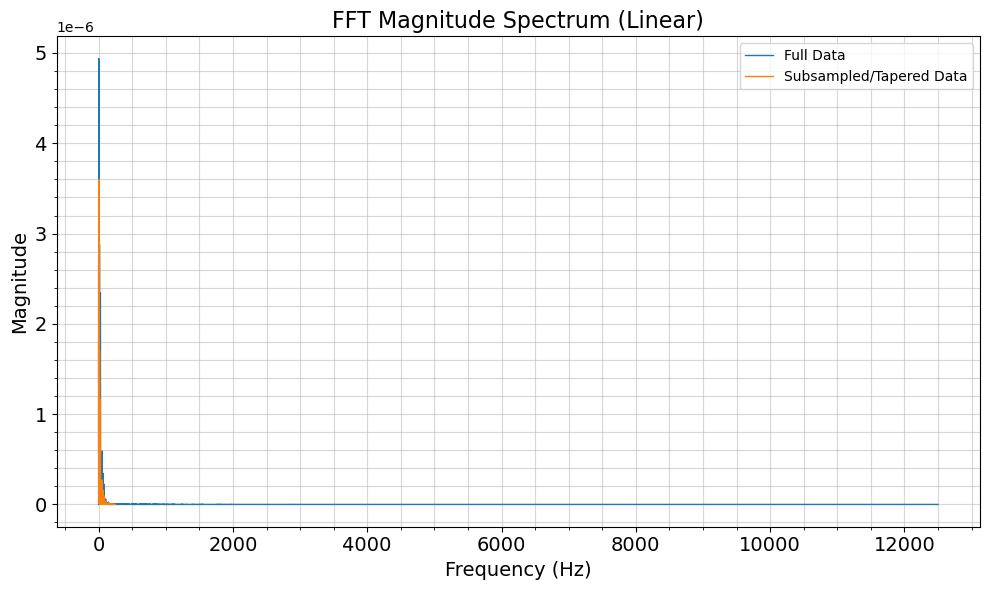

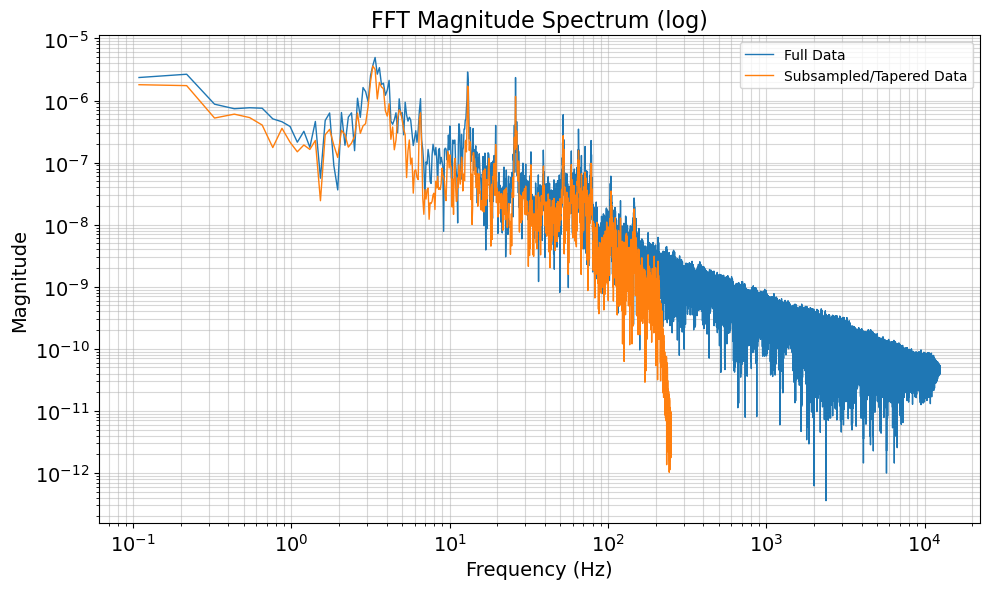

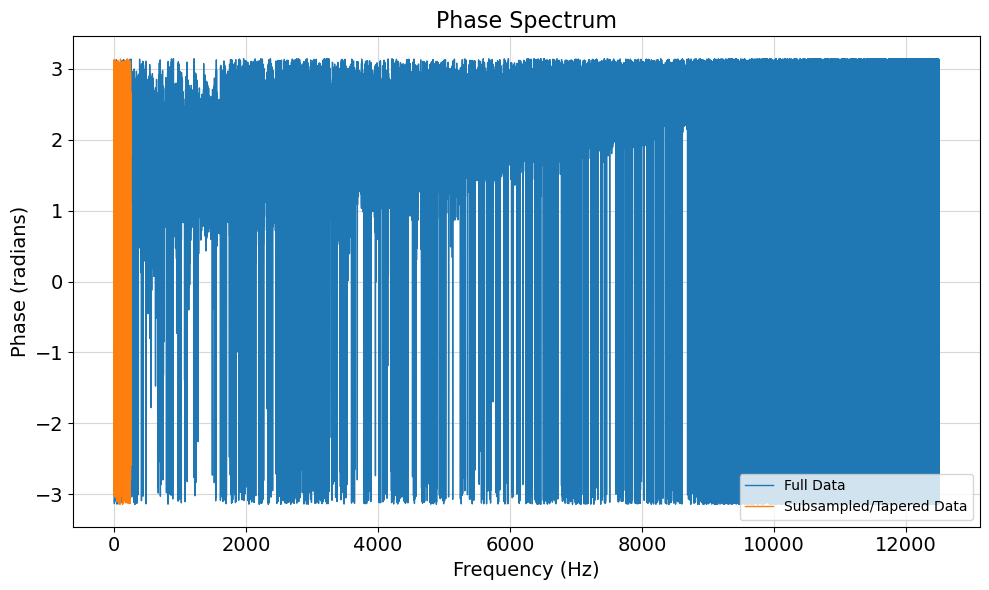

dataframe: df5


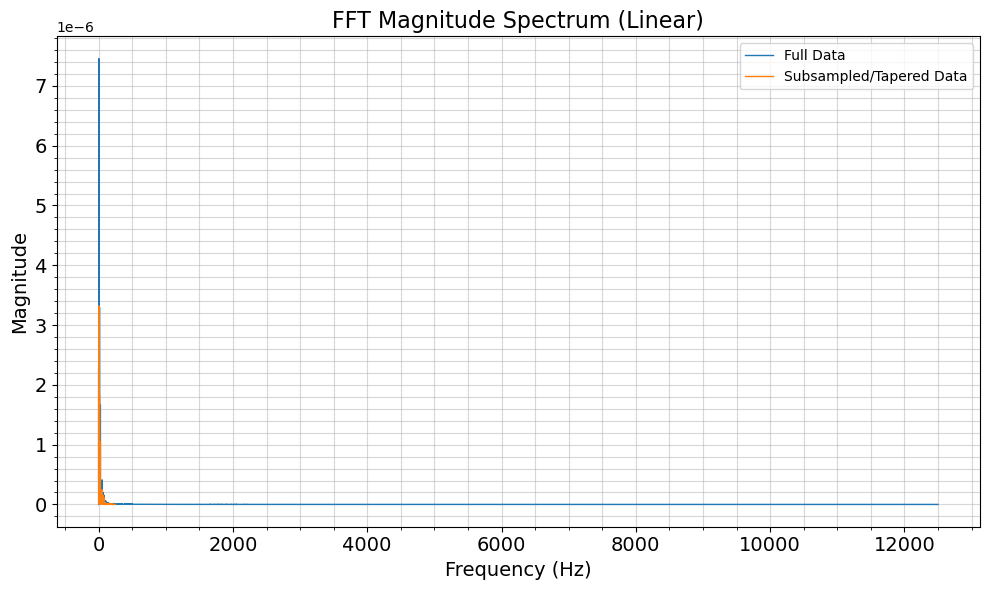

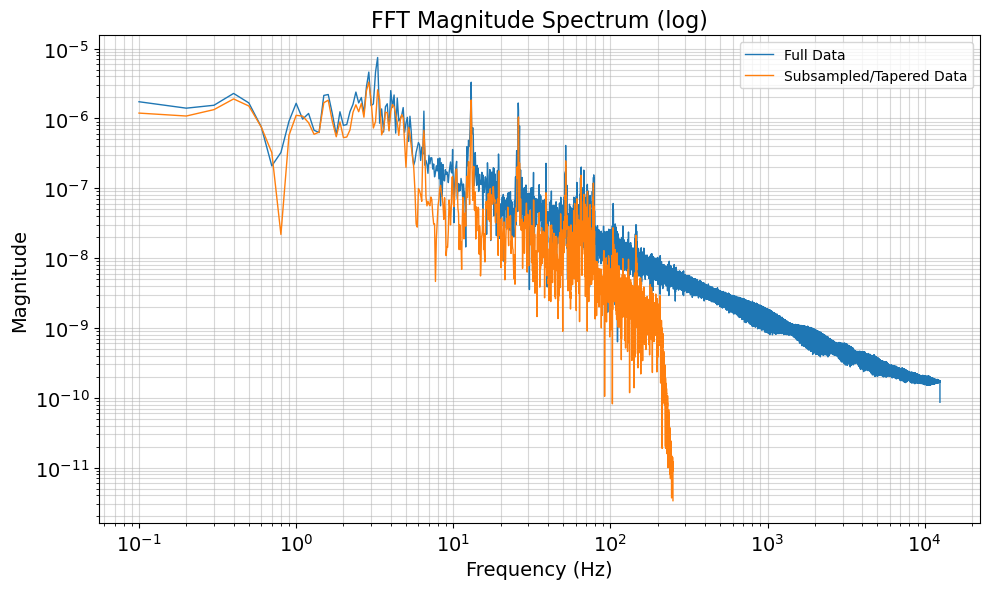

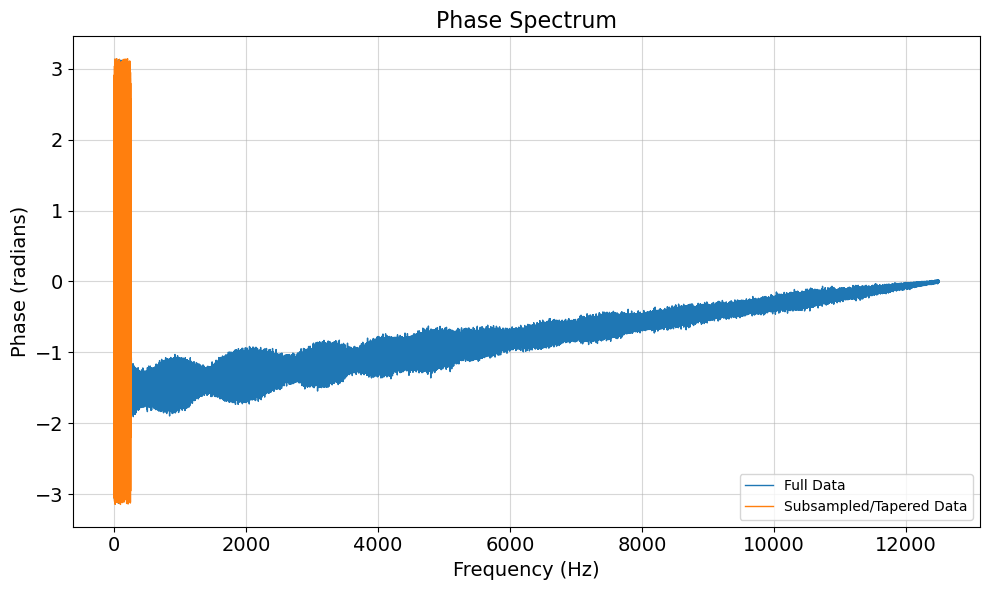

dataframe: df6


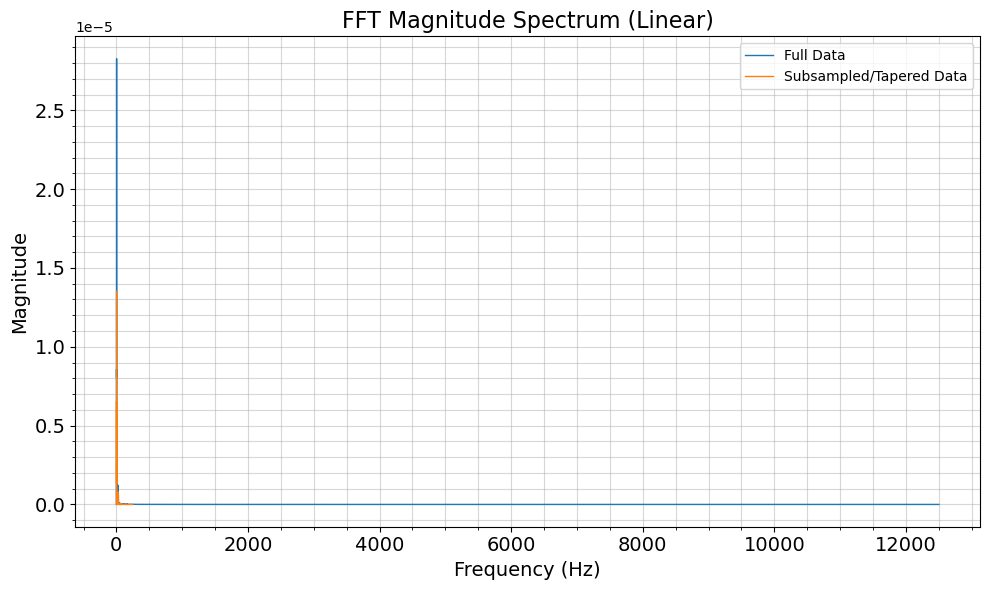

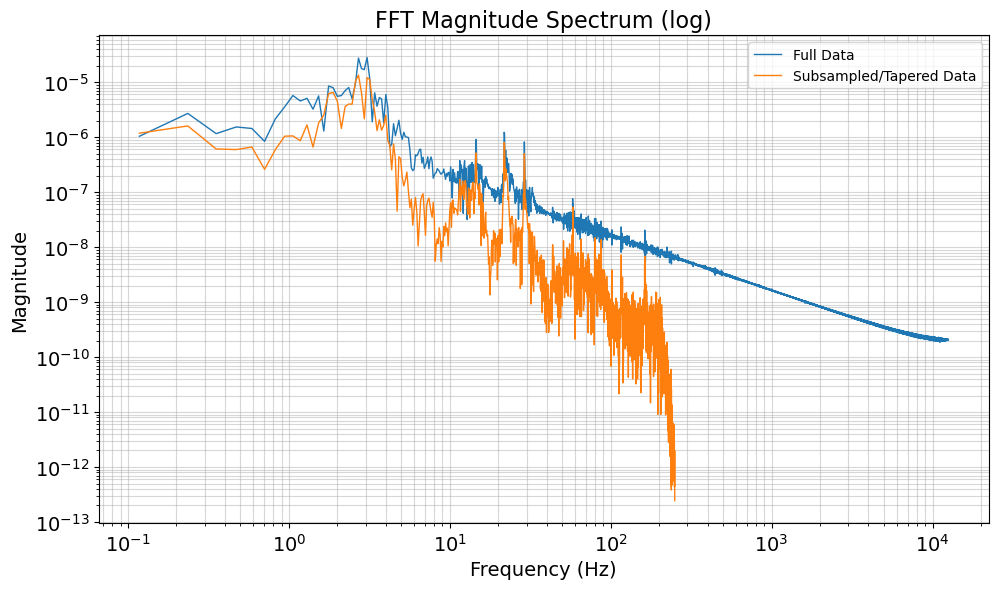

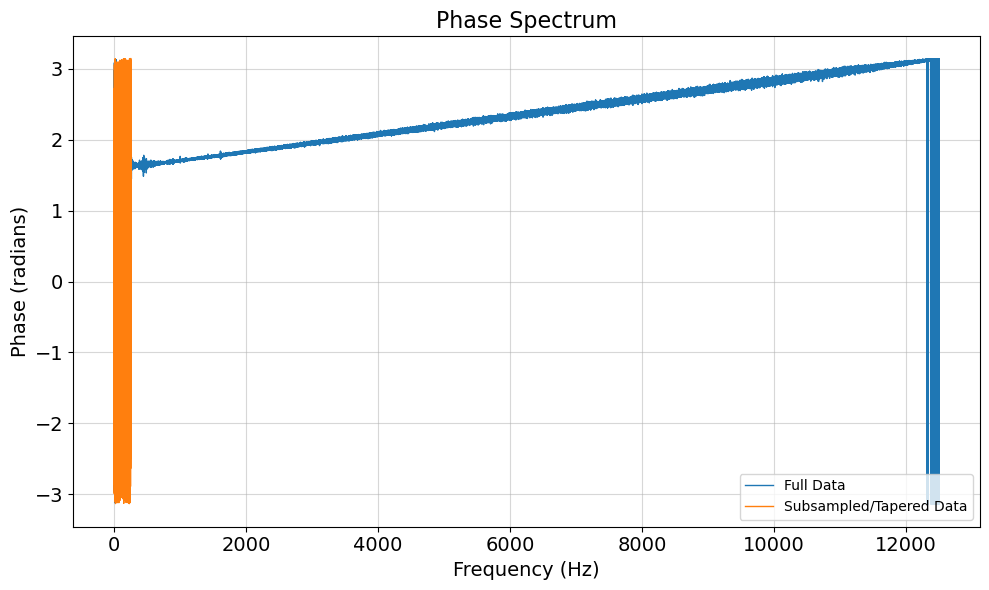

dataframe: df7


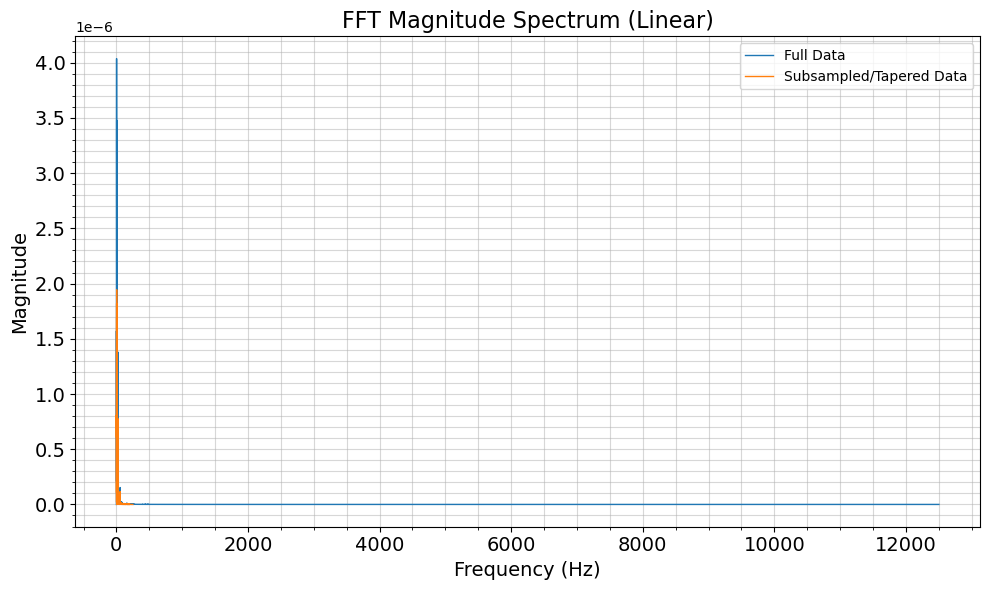

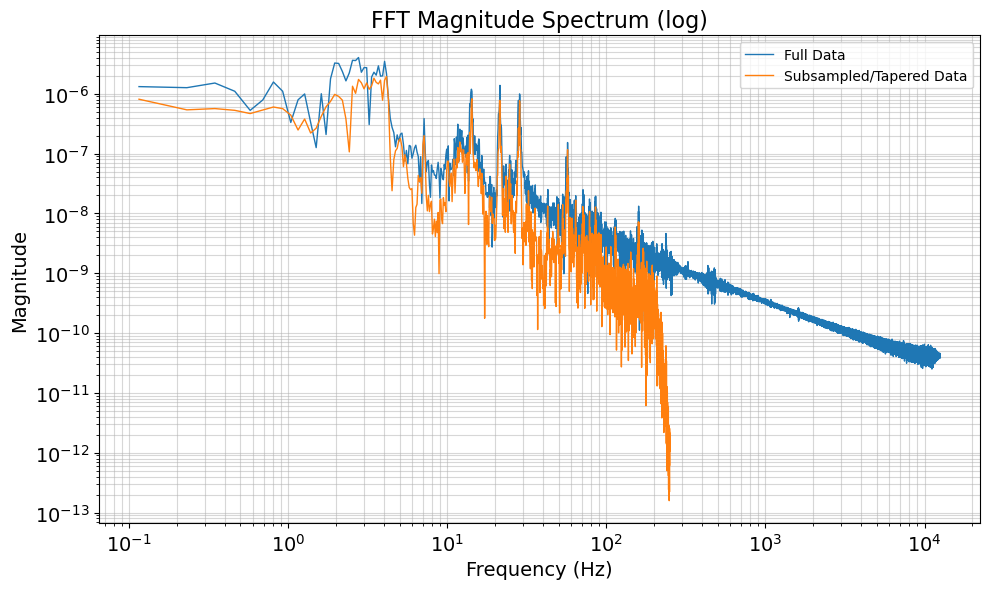

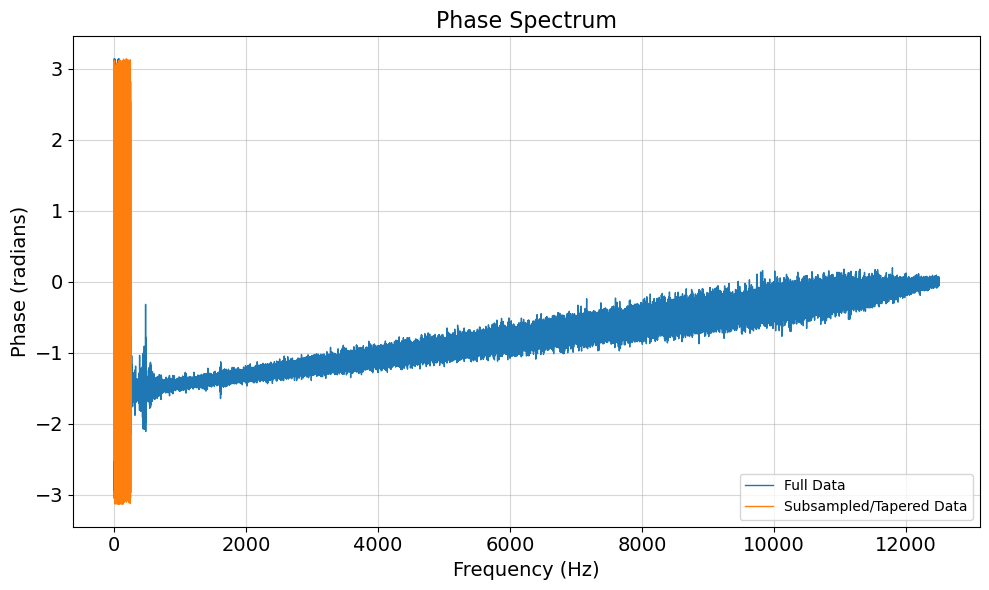

dataframe: df8


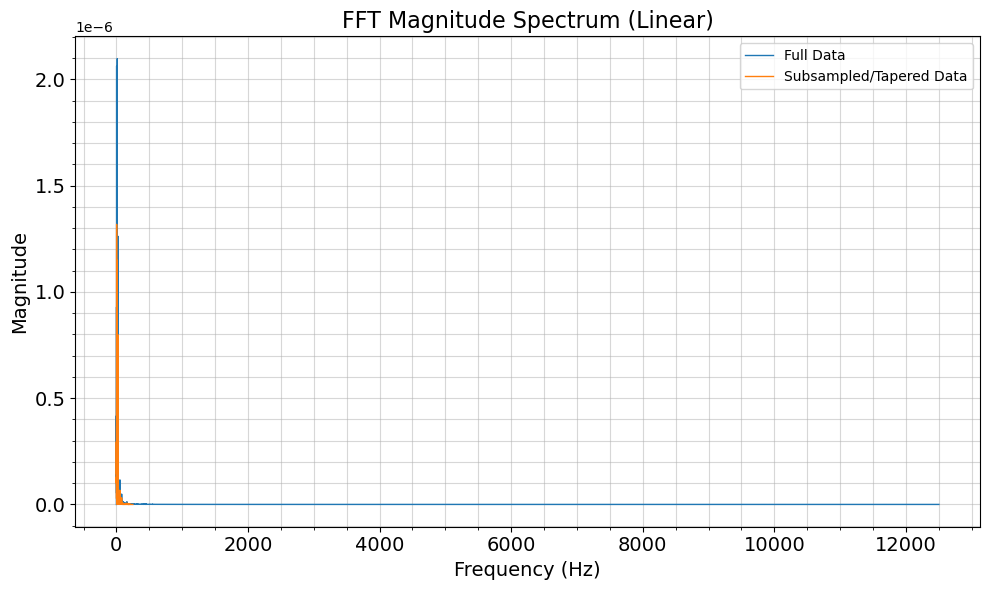

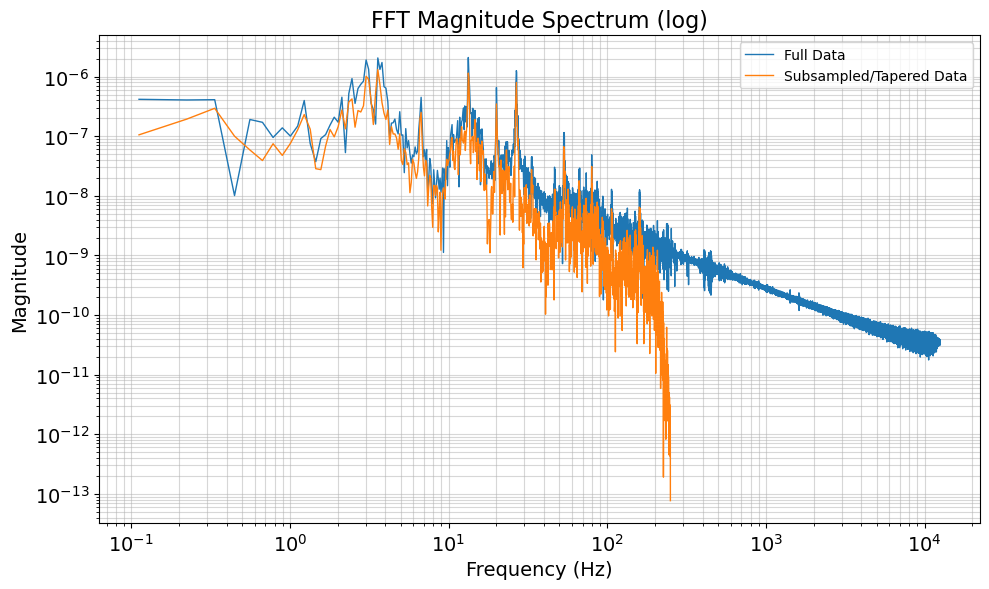

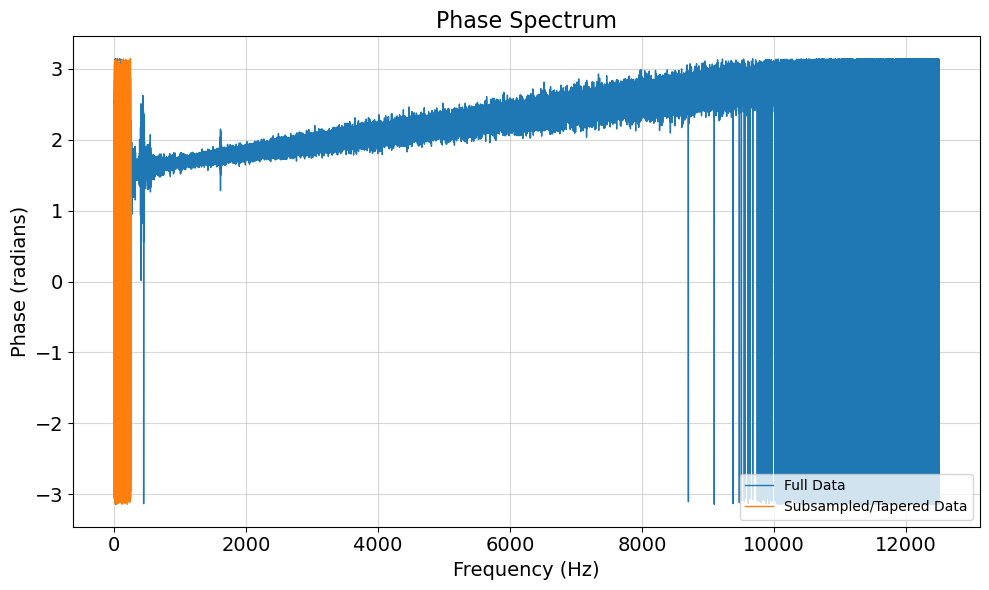

dataframe: df9


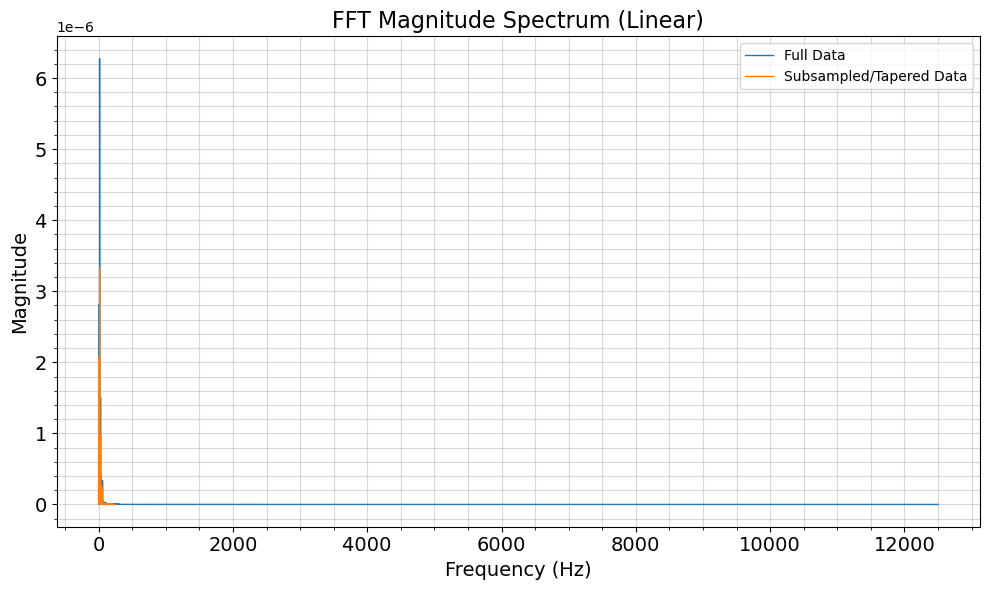

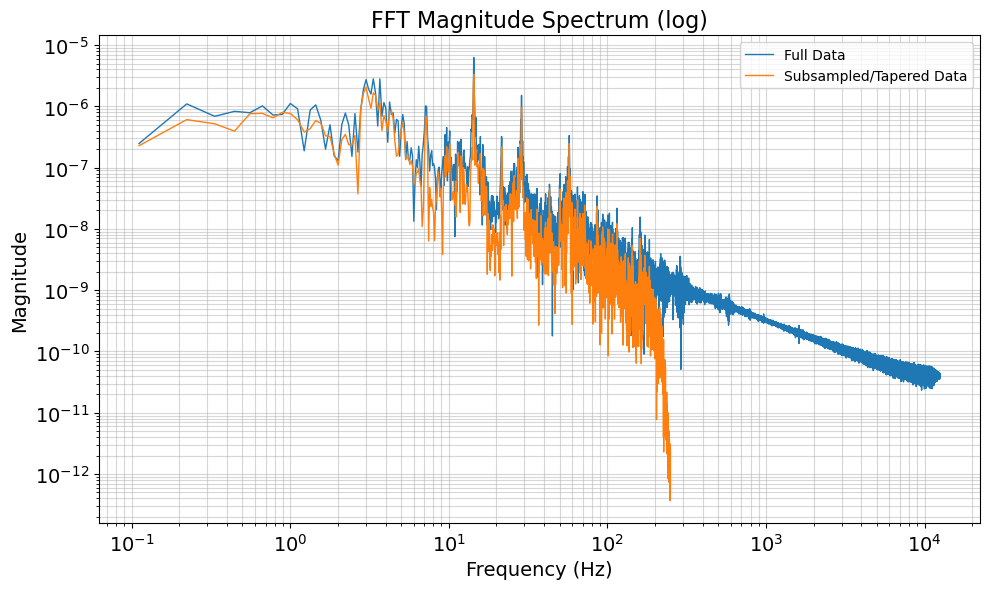

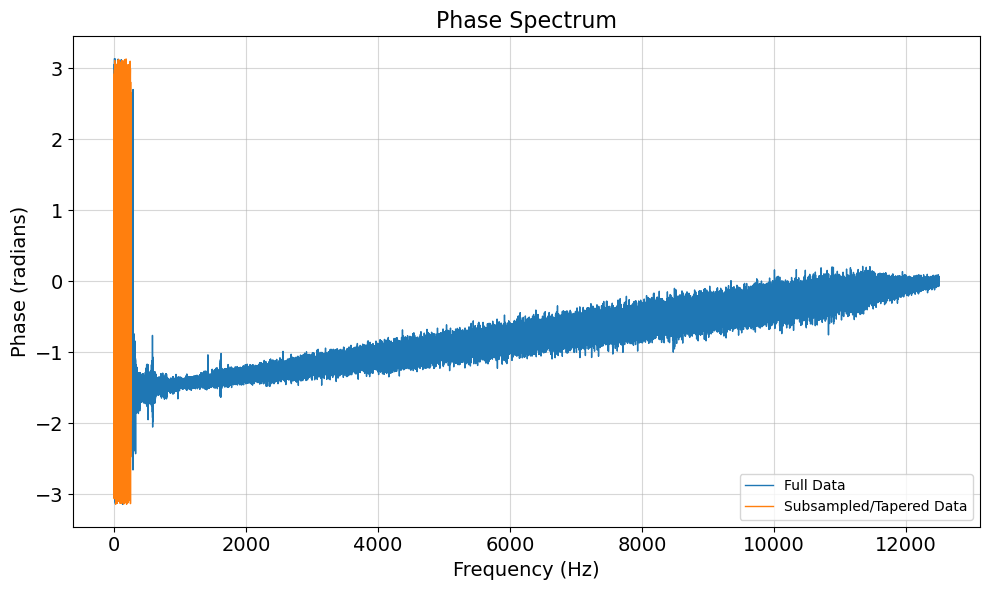

dataframe: df10


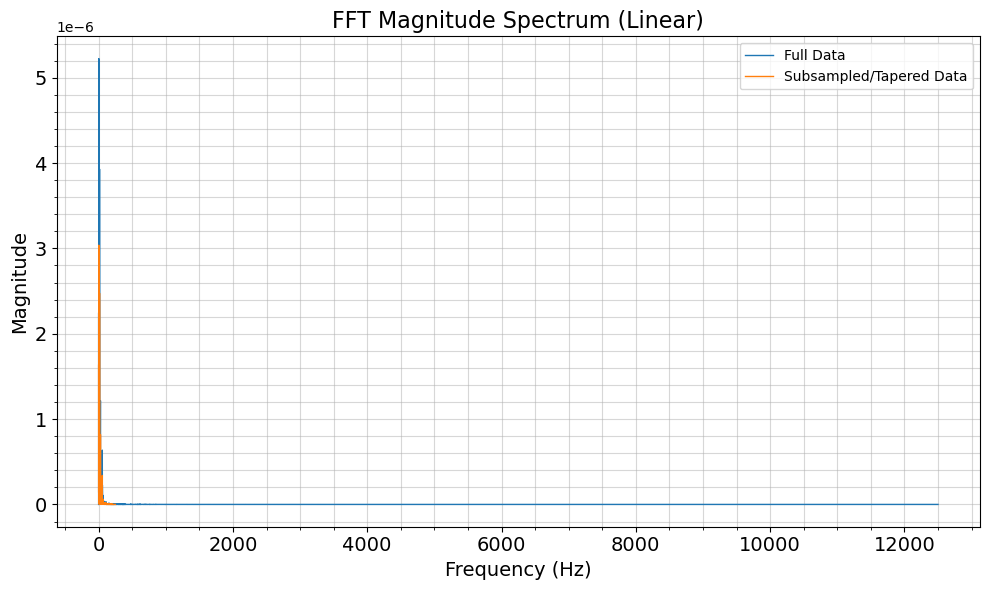

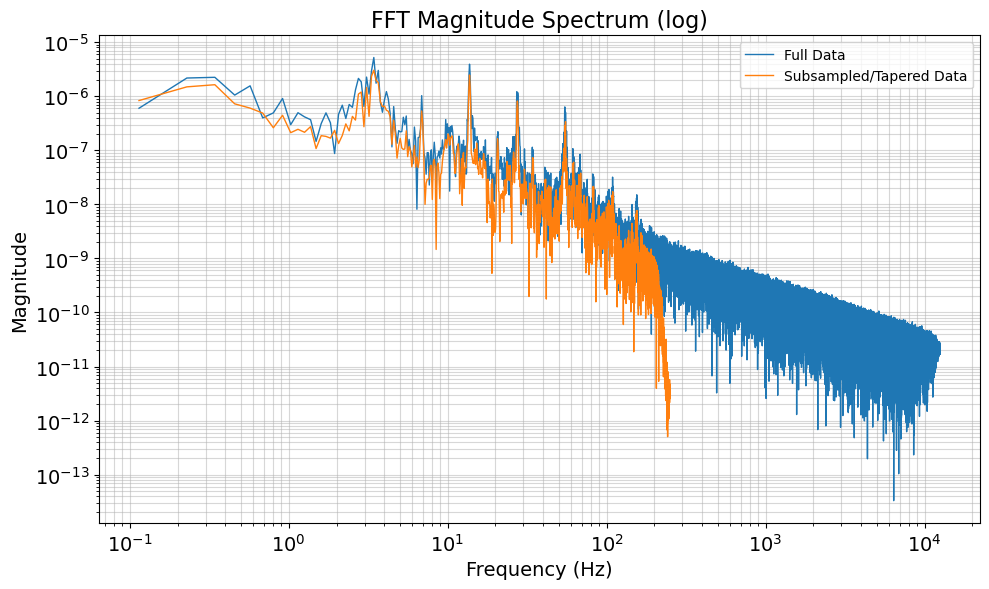

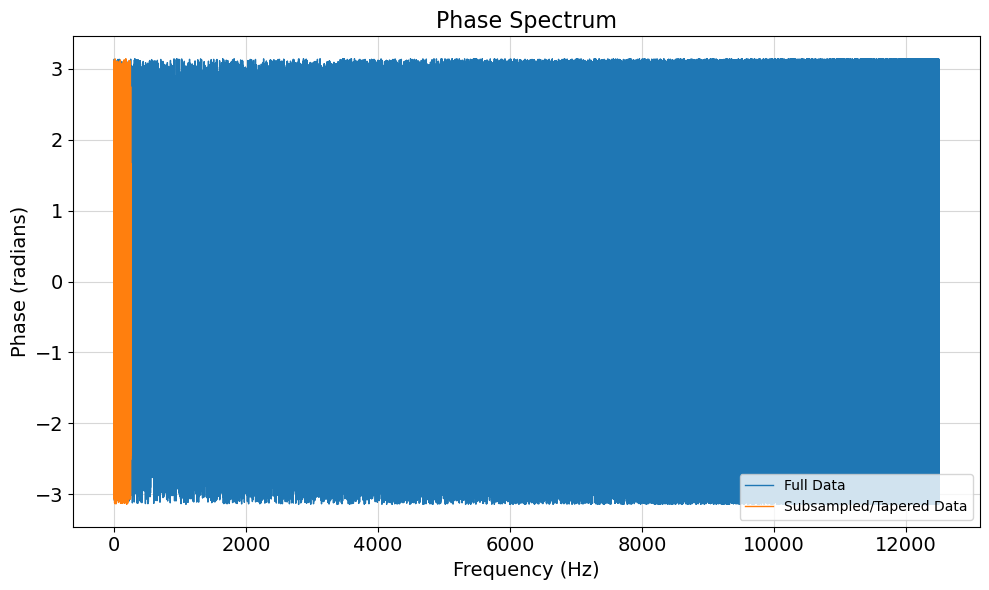

dataframe: df11


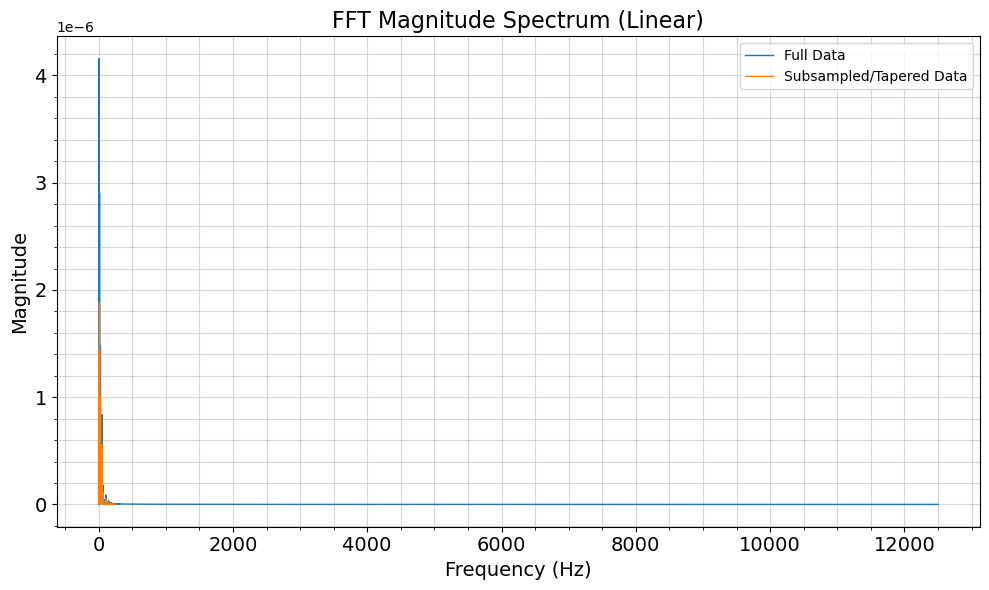

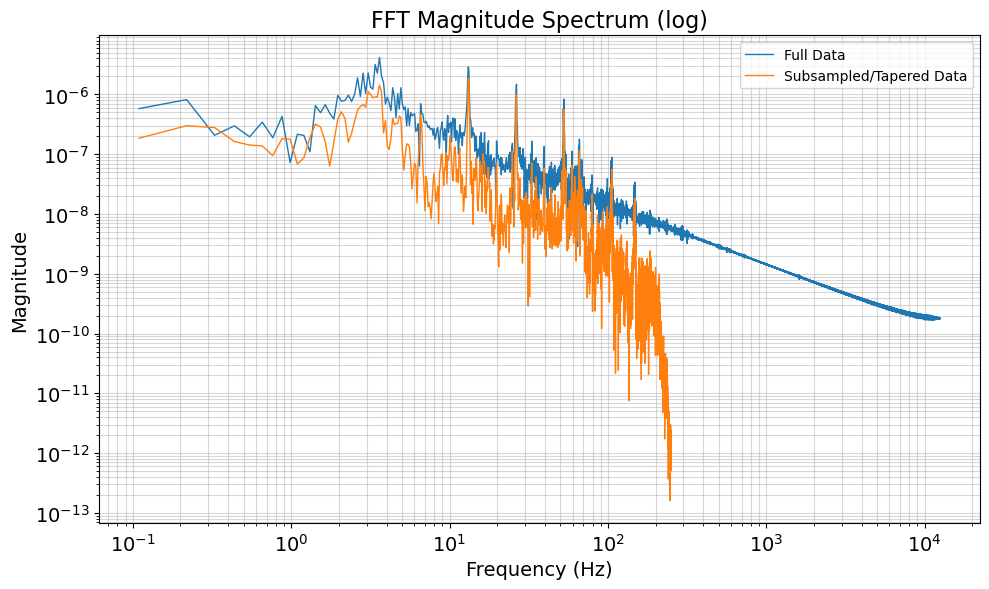

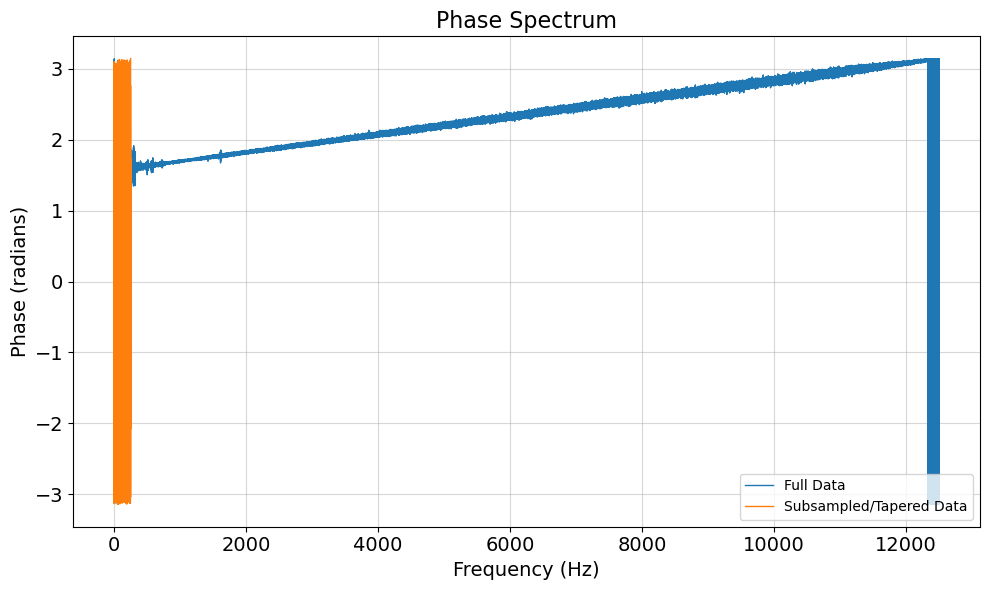

In [72]:
# Plotting FFT spectra showing tapered/subsampled data overlayed onto full DNS data for a given dataframe
def plot_fft(data, sr, fig1=None, fig2=None, fig3=None, name='', apply_window=True):
    """Plot FFT with windowing correction.
    data: array
    sr: Sampling rate
    apply_window : bool, says whether to apply Hann window (default True)"""
    n = len(data)
    
    # Apply window if requested
    if apply_window:
        window = np.hanning(n)
        windowed_data = data * window
    else:
        windowed_data = data
        coherent_gain=1.0
    
    # Compute FFT
    fft_values = scipy.fft.rfft(windowed_data)
    freqs = scipy.fft.rfftfreq(n, d=1/sr)
    
    # magnitudes WITHOUT coherent gain correction
    magnitudes = np.abs(fft_values) / n

    # Double the AC components (not DC and Nyquist)
    magnitudes[1:] *= 2.0

    # Undo doubling for Nyquist if even length
    if n % 2 == 0:
        magnitudes[-1] /= 2.0
    
    phases = np.angle(fft_values)
    
    # Create figures:
    if fig1 is None:
        fig1 = plt.figure(figsize=(10,6))
        plt.plot(freqs, magnitudes, linewidth=1, label=name)
        plt.title('FFT Magnitude Spectrum (Linear)', fontsize=16)
        plt.xlabel('Frequency (Hz)', fontsize=14)
        plt.ylabel('Magnitude', fontsize=14)
        plt.grid(True, which='major', alpha=0.5)
        plt.grid(True, which='minor', alpha=0.5)
        plt.minorticks_on()
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.tight_layout()
        if name:
            plt.legend(loc='upper right')
    else:
        plt.figure(fig1.number)
        plt.plot(freqs, magnitudes, linewidth=1, label=name)
        if name:
            plt.legend(loc='upper right')
    
    if fig2 is None:
        fig2 = plt.figure(figsize=(10, 6))
        plt.loglog(freqs[1:], magnitudes[1:], linewidth=1, label=name)
        plt.title('FFT Magnitude Spectrum (log)', fontsize=16)
        plt.xlabel('Frequency (Hz)', fontsize=14)
        plt.ylabel('Magnitude', fontsize=14)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.grid(True, which='major', alpha=0.5)
        plt.grid(True, which='minor', alpha=0.5)
        plt.tight_layout()
        if name:
            plt.legend(loc='upper right')
    else:
        plt.figure(fig2.number)
        plt.loglog(freqs[1:], magnitudes[1:], linewidth=1, label=name)
        plt.legend()
        if name:
            plt.legend(loc='upper right')
    
    if fig3 is None:
        fig3 = plt.figure(figsize=(10, 6))
        plt.plot(freqs[1:], phases[1:], linewidth=1, label=name)
        plt.title('Phase Spectrum', fontsize=16)
        plt.xlabel('Frequency (Hz)', fontsize=14)
        plt.ylabel('Phase (radians)', fontsize=14)
        plt.grid(True, alpha=0.5)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        #plt.xlim(-1, 50)
        plt.tight_layout()
        if name:
            plt.legend(loc='lower right', framealpha=0.5)
    else:
        plt.figure(fig3.number)
        plt.plot(freqs[1:], phases[1:], linewidth=1, label=name)
        if name:
            plt.legend(loc='lower right', framealpha=0.8)
    
    return fig1, fig2, fig3
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
for i, dframe in enumerate(car_on_dataframes):
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    time_column = f"Time{i+1} (s)"
    decimation_factor=50 # step used for subsampling
    print(f"dataframe: df{i+1}")
    # For full data
    fig1, fig2, fig3 = plot_fft(dframe[mean_shifted_column].values, sr=25000, name='Full Data', apply_window=False)
    # For tapered/subsampled data
    sub_tap_results=[]
    sub_tap_result = sub_tapered(apply_hann_window(dframe, mean_shifted_column), decimation_factor=50)
    sub_tap_results.append(sub_tap_result)
    plot_fft(sub_tap_results[-1], sr=25000//decimation_factor, fig1=fig1, fig2=fig2, fig3=fig3, name='Subsampled/Tapered Data', apply_window=False)
    plt.show()

##### Continuous Wavelet Transform
- The Morlet wavelet, given by $\psi(t)=\exp(\frac{-t^2}{2})\cos(5t)$, is used for the wavelet transform
##### Full DS Data:

Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 250000)
Frequencies shape: (60,)
Time_sec shape: (250000,)


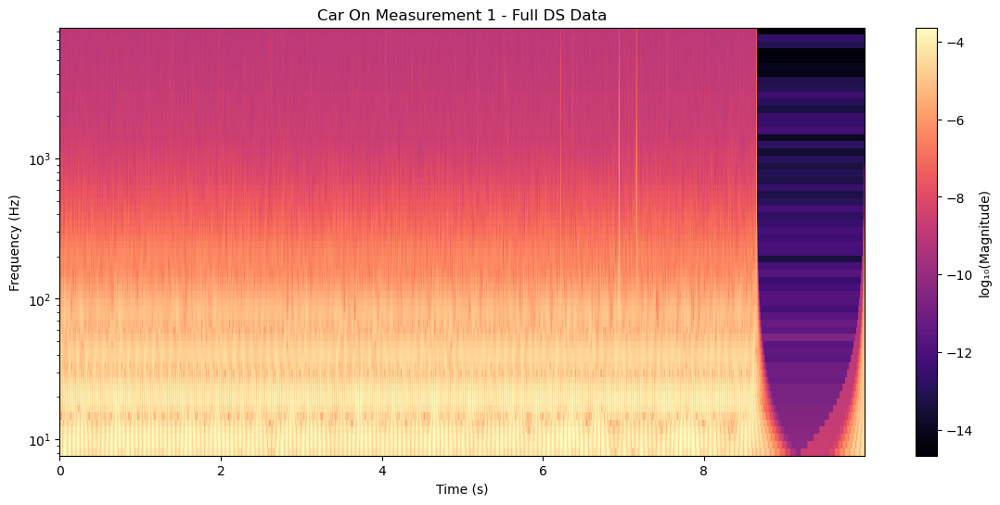

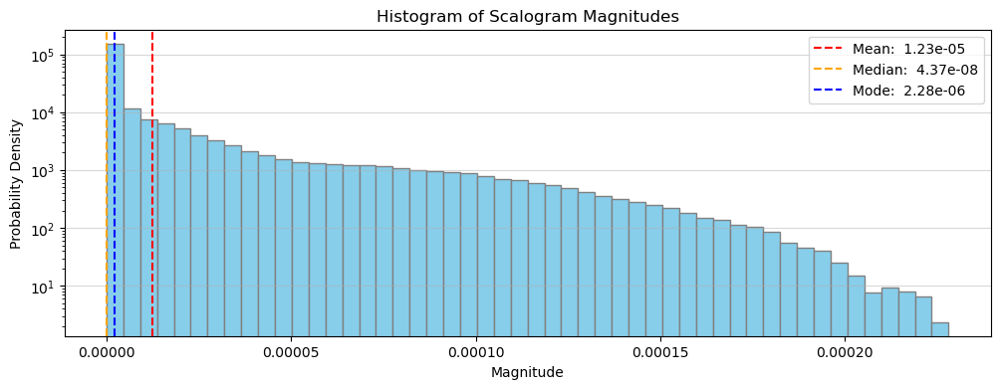

DescribeResult(nobs=15000000, minmax=(2.1937517951164405e-15, 0.00022806403861721746), mean=1.2338021224065456e-05, variance=7.952830654672067e-10, skewness=3.08917624950776, kurtosis=10.175355250508966)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 222979)
Frequencies shape: (60,)
Time_sec shape: (222979,)


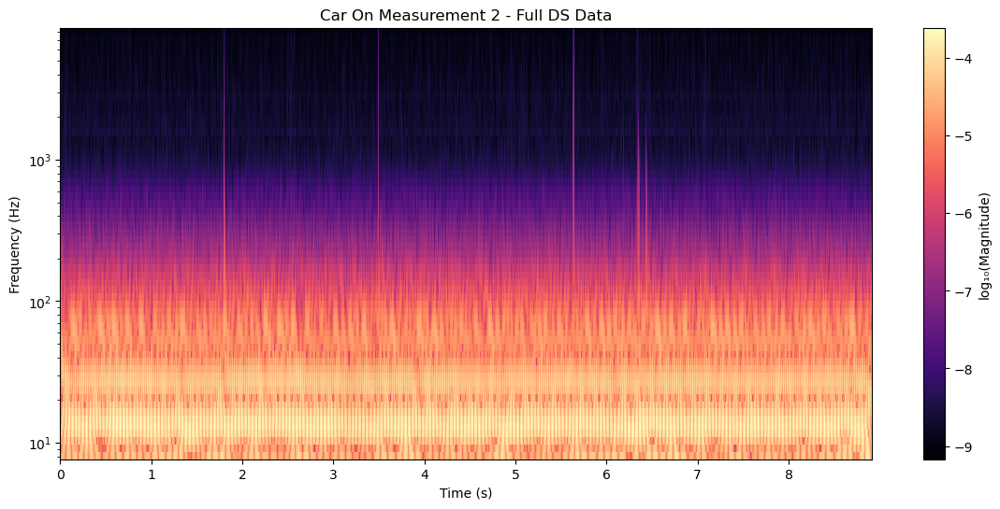

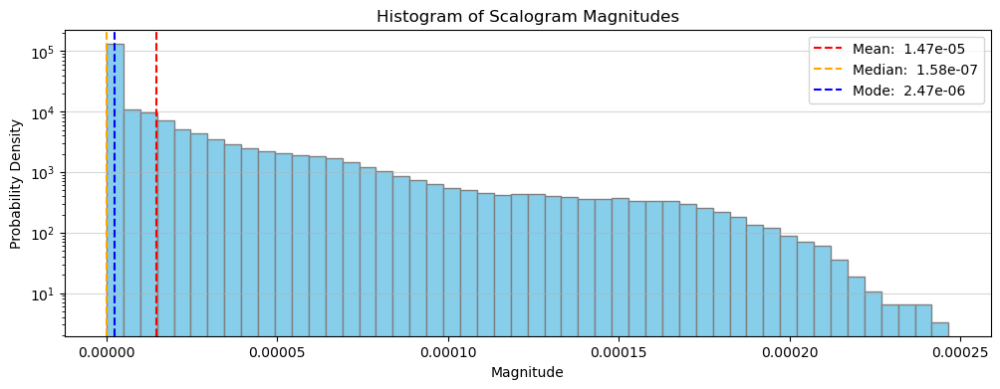

DescribeResult(nobs=13378740, minmax=(6.742087023326027e-10, 0.00024658862005908535), mean=1.4656639543582211e-05, variance=9.88259683678089e-10, skewness=3.124049913224638, kurtosis=10.834216425527762)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 228729)
Frequencies shape: (60,)
Time_sec shape: (228729,)


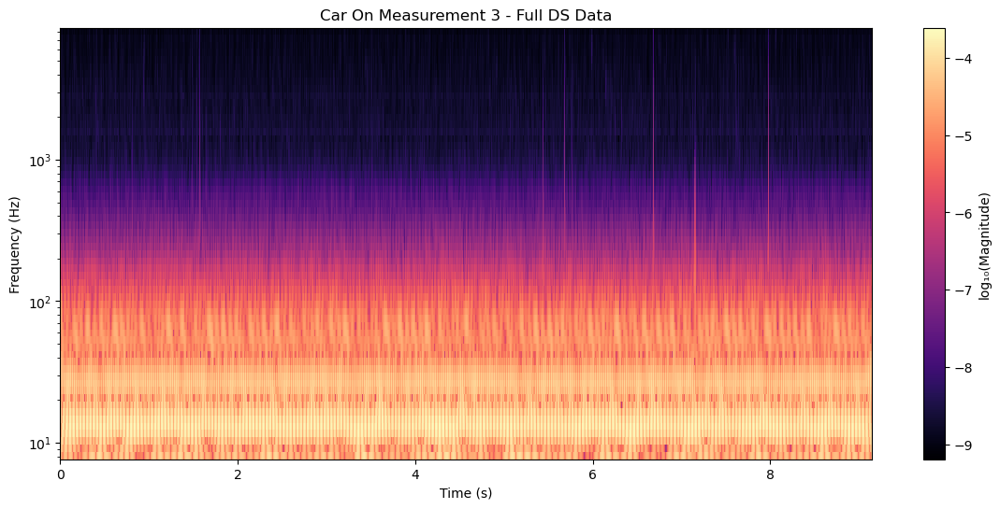

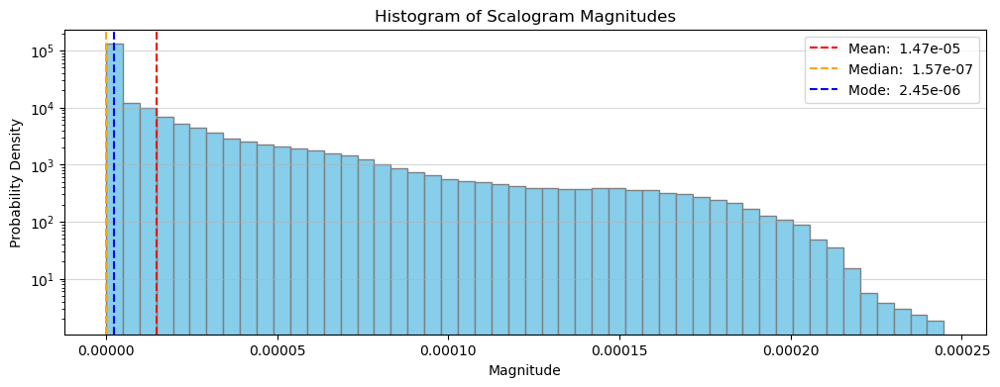

DescribeResult(nobs=13723740, minmax=(6.417399383735871e-10, 0.0002447691833290511), mean=1.4683033876579115e-05, variance=9.900135126277405e-10, skewness=3.119113417785071, kurtosis=10.727722761072897)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 229229)
Frequencies shape: (60,)
Time_sec shape: (229229,)


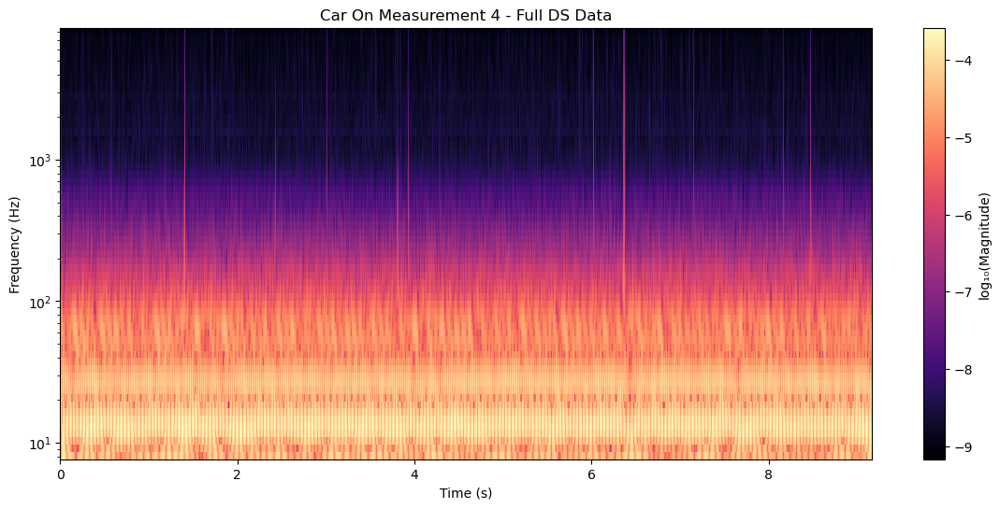

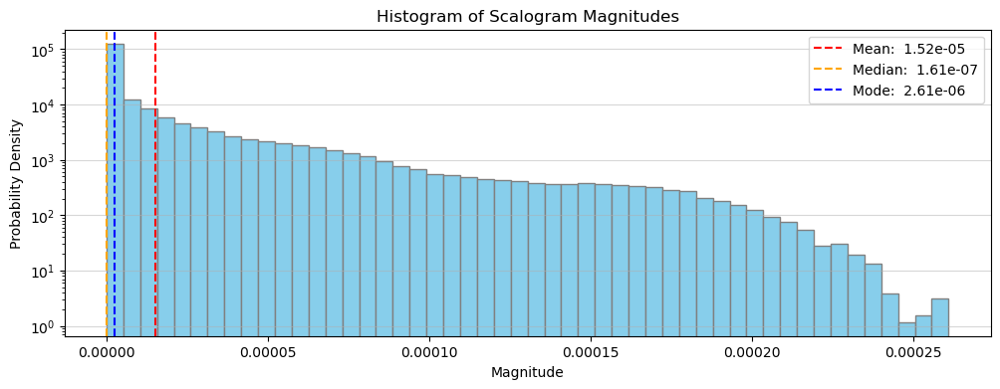

DescribeResult(nobs=13753740, minmax=(6.771803282059279e-10, 0.0002608576449410005), mean=1.5180746751592183e-05, variance=1.0737184362283351e-09, skewness=3.1183915009446648, kurtosis=10.756525297272825)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 250000)
Frequencies shape: (60,)
Time_sec shape: (250000,)


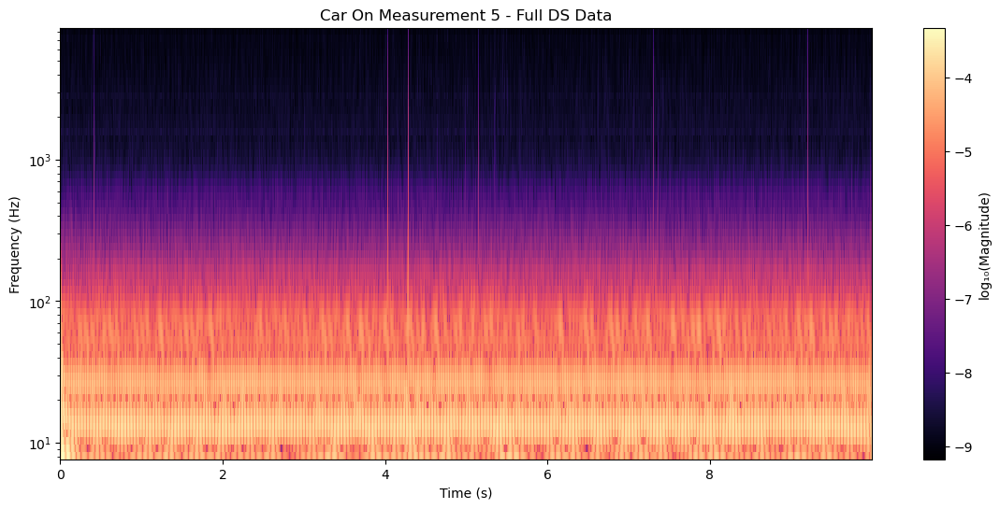

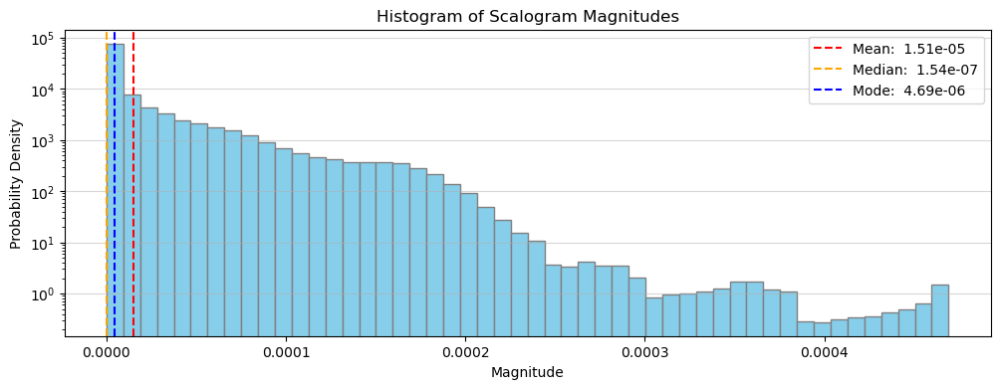

DescribeResult(nobs=15000000, minmax=(6.760489927563129e-10, 0.00046928281036587755), mean=1.509411461952228e-05, variance=1.0759253288485568e-09, skewness=3.2107399471114295, kurtosis=12.533201338128377)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 212479)
Frequencies shape: (60,)
Time_sec shape: (212479,)


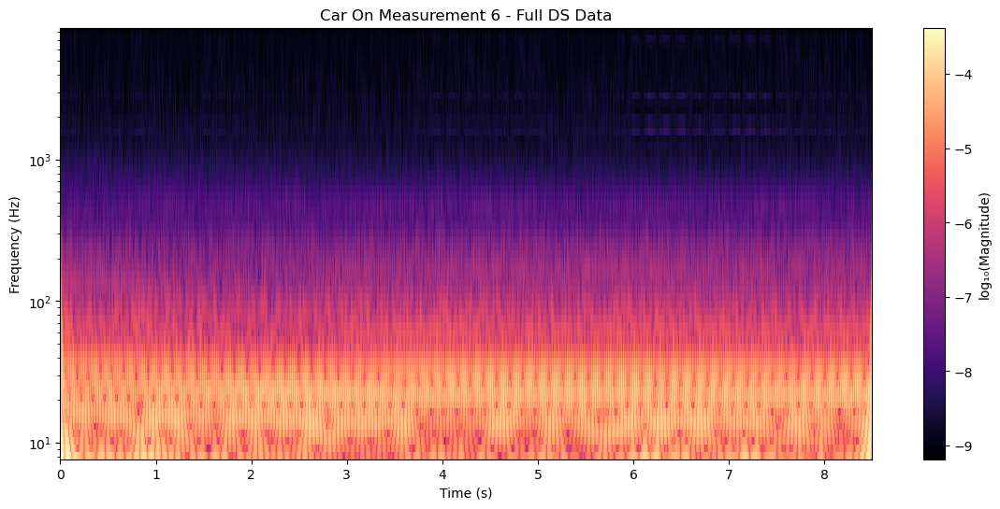

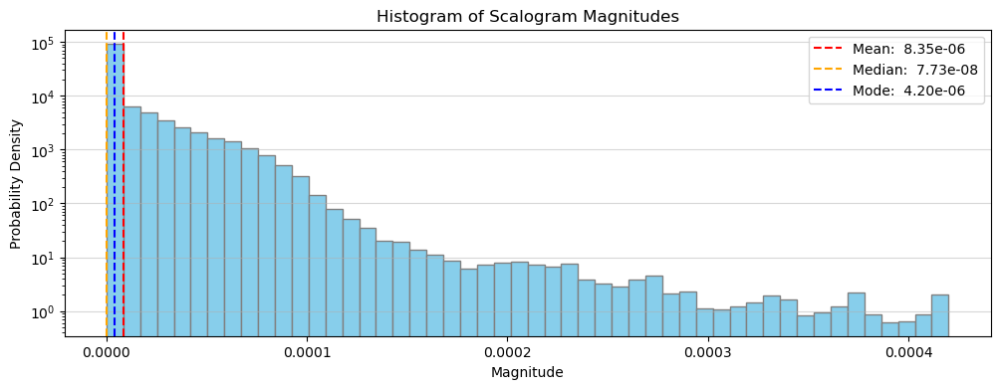

DescribeResult(nobs=12748740, minmax=(6.537372579098747e-10, 0.00042003597961180495), mean=8.347060666905095e-06, variance=3.8567521341831227e-10, skewness=4.193866353343914, kurtosis=33.59870111554201)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 217229)
Frequencies shape: (60,)
Time_sec shape: (217229,)


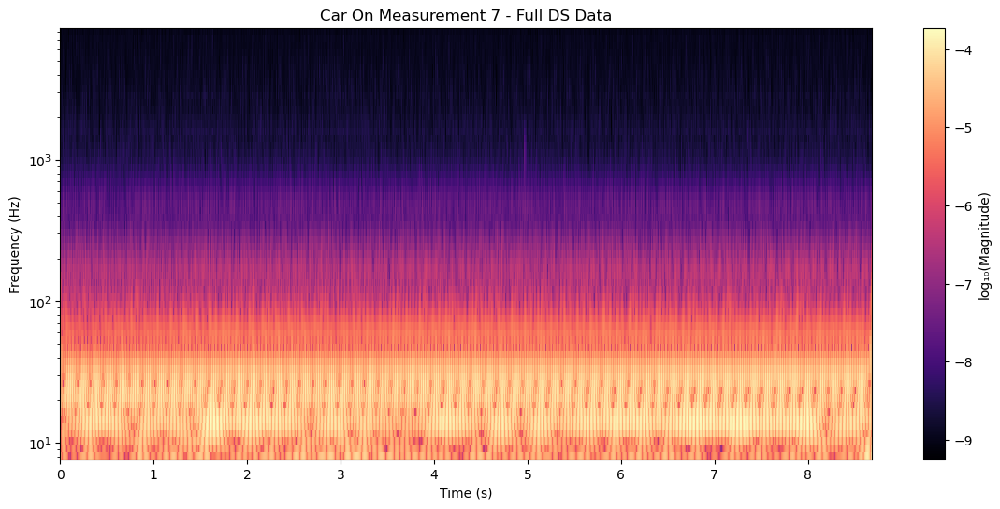

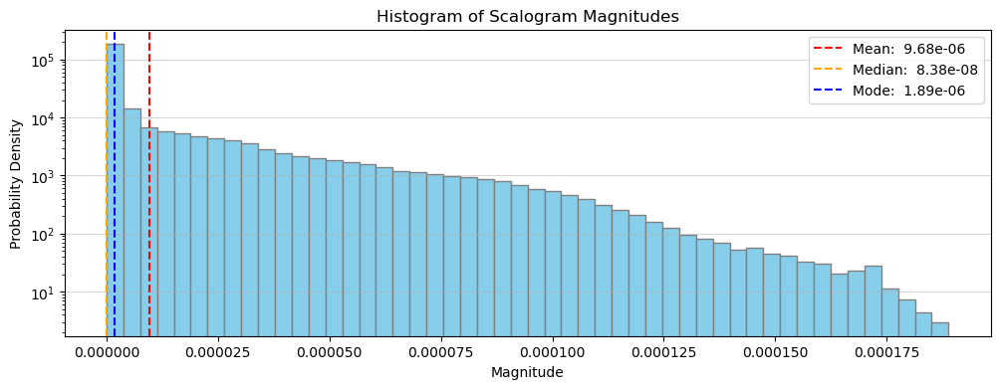

DescribeResult(nobs=13033740, minmax=(5.595280319205297e-10, 0.00018889150057952258), mean=9.677987747059834e-06, variance=4.6239299536410934e-10, skewness=3.0073588663513307, kurtosis=10.048510291431608)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 223479)
Frequencies shape: (60,)
Time_sec shape: (223479,)


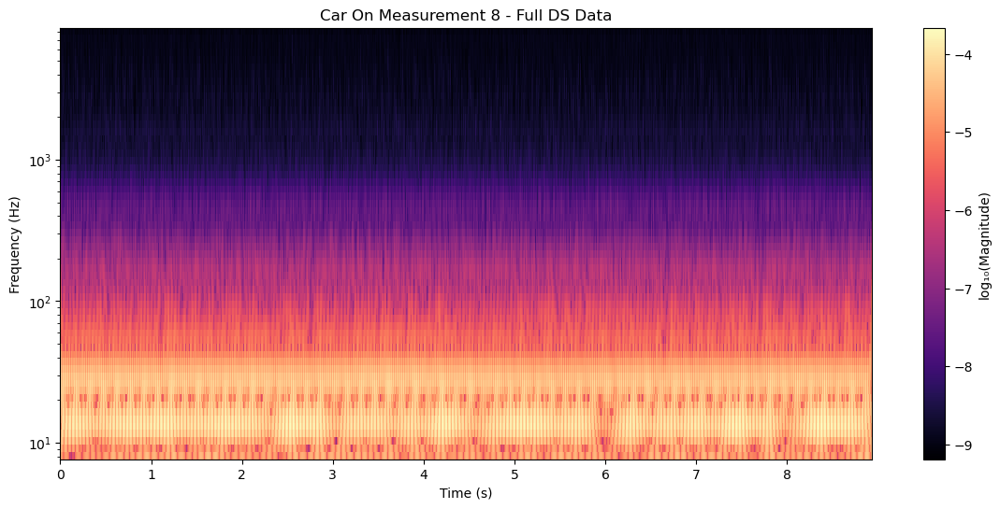

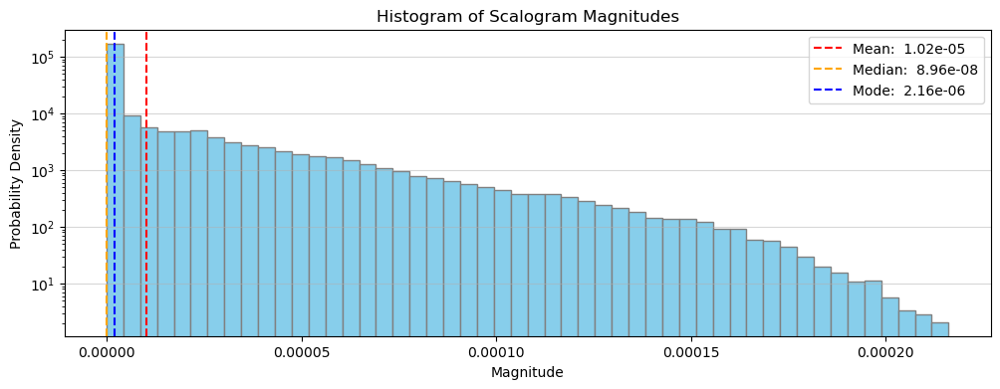

DescribeResult(nobs=13408740, minmax=(6.468046786981609e-10, 0.0002161267776427342), mean=1.0177537813244323e-05, variance=5.510726348361444e-10, skewness=3.2622711239668947, kurtosis=12.315722287579918)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 224229)
Frequencies shape: (60,)
Time_sec shape: (224229,)


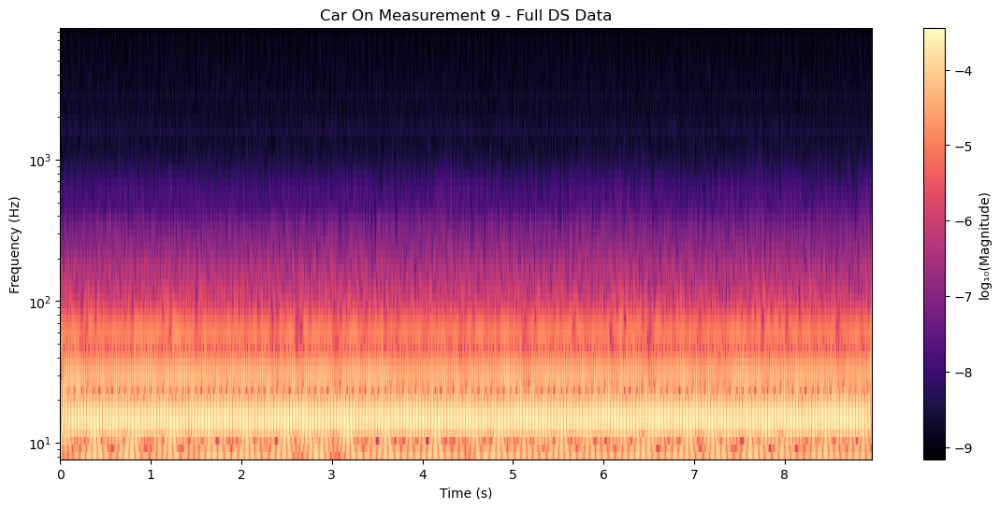

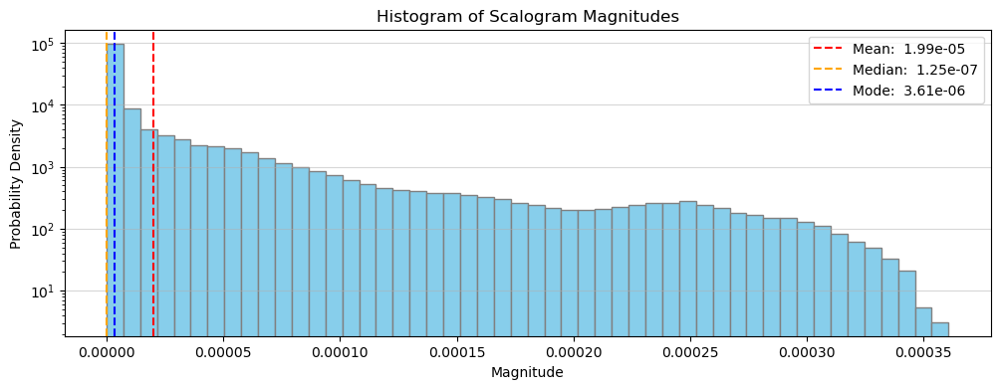

DescribeResult(nobs=13453740, minmax=(6.8707879148928e-10, 0.0003606945667880743), mean=1.9924657071698e-05, variance=2.397004920902887e-09, skewness=3.5385612853211885, kurtosis=13.55197355953749)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 218479)
Frequencies shape: (60,)
Time_sec shape: (218479,)


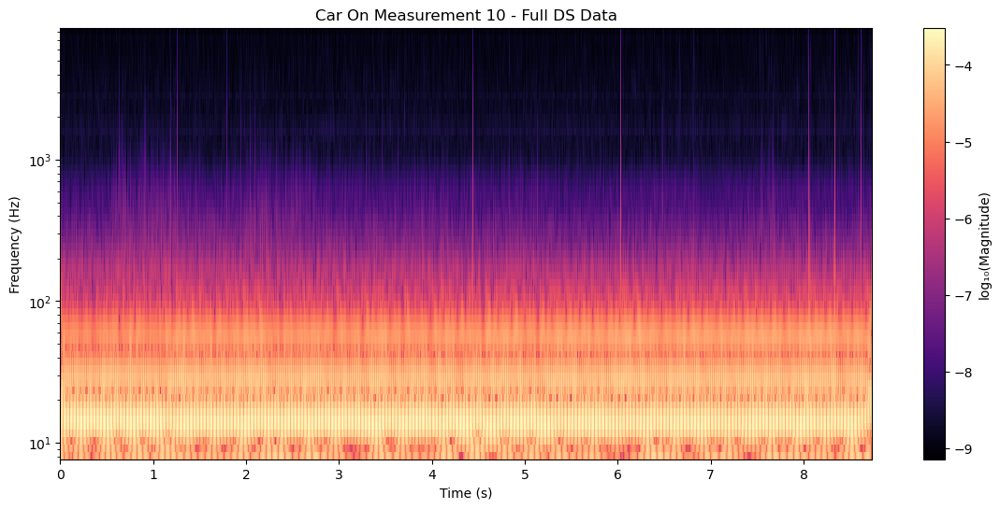

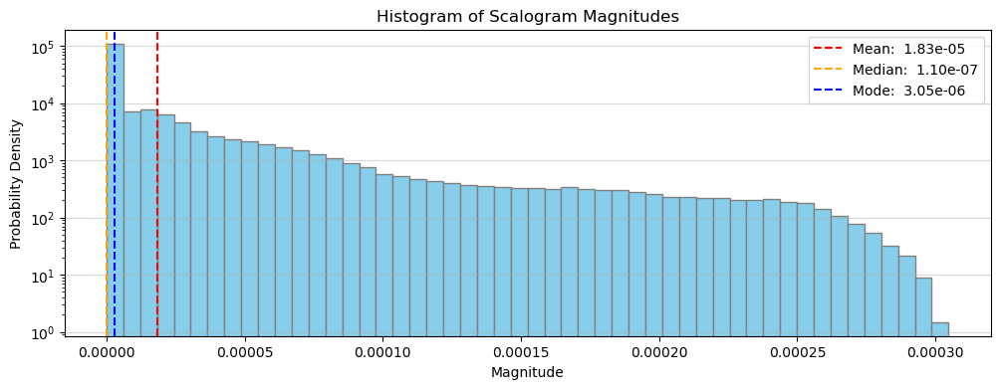

DescribeResult(nobs=13108740, minmax=(7.251454618390246e-10, 0.00030476892343723935), mean=1.8348513494705816e-05, variance=1.7359562078281525e-09, skewness=3.372858348431835, kurtosis=12.552645339582346)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 228479)
Frequencies shape: (60,)
Time_sec shape: (228479,)


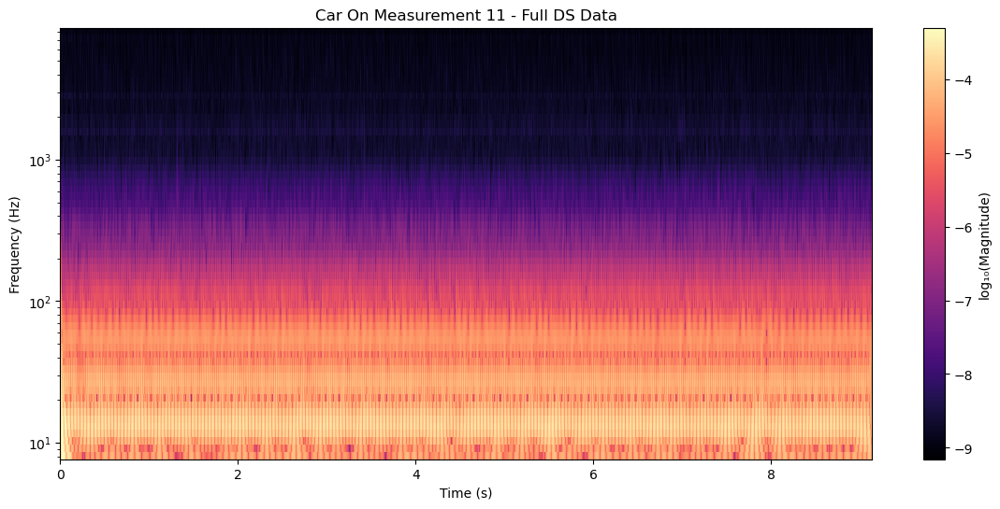

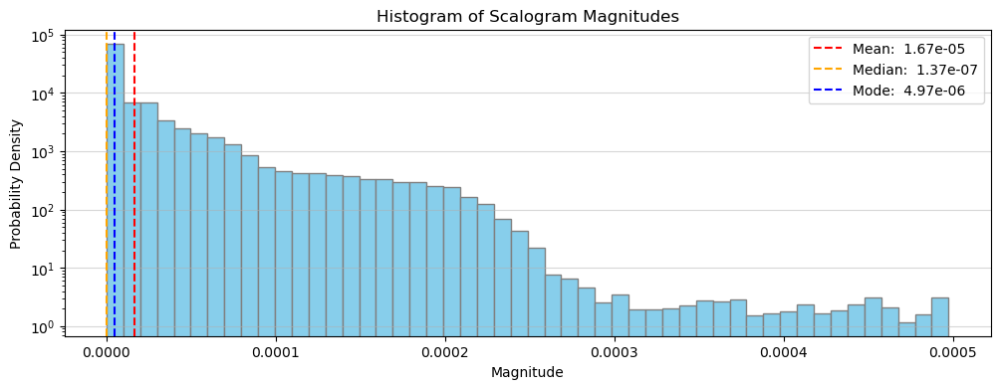

DescribeResult(nobs=13708740, minmax=(6.990018176050198e-10, 0.0004973002768664151), mean=1.665953996631716e-05, variance=1.3537408121617178e-09, skewness=3.5593591465444163, kurtosis=16.342309554174335)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [22]:
for i, dframe in enumerate(car_on_dataframes):
    mean_shifted_column=f"Signal{i+1} Zero Mean (m)"
    time_column = f"Time{i+1} (s)"
    data = dframe[mean_shifted_column].values
    #print(f"Data shape: {data.shape}")
    time_sec = dframe[time_column].values
    delta_t = time_sec[1] - time_sec[0] # time step in seconds
    #print(delta_t)

    scale_min = 1.0 / (10000 * delta_t)  # Small scale for high freq, use freq_max=10000
    scale_max = 1.0 / (10 * delta_t)  # Large scale for low freq, use freq_min=10
    scales = np.logspace(np.log10(scale_min), np.log10(scale_max), 60) 
    # Wavelet transform:
    coefficients, frequencies = pywt.cwt(data, scales, 'morl', sampling_period=delta_t)
    print(f"Frequency range: {frequencies.min():.2f} to {frequencies.max():.2f} Hz")
    print(f"Coefficients shape: {coefficients.shape}")
    print(f"Frequencies shape: {frequencies.shape}")
    print(f"Time_sec shape: {time_sec.shape}")
    # Smooth in time direction (axis=1), not frequency (axis=0)
    smoothed_coefficients = uniform_filter(np.abs(coefficients), size=(1, 200)) # changed size from (1,50) to (1,200)
    # Add small epsilon (if needed) to avoid log(0)
    #epsilon = 1e-10  # Small value to prevent log(0)
    #coeffs = (coefficients + epsilon)
    
    # Plot:
    plt.figure(figsize=(14, 6))
    plt.pcolormesh(time_sec, frequencies, np.log10(smoothed_coefficients), cmap='magma', shading='auto')#, vmin=-5)
    plt.colorbar(label='log\u2081\u2080(Magnitude)')
    plt.ylabel('Frequency (Hz)')
    plt.yscale('log')
    plt.xlabel('Time (s)')
    plt.title(f'Car On Measurement {i+1} - Full DS Data')
    plt.show()

    # Try to make histograms ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    magnitudes = np.abs(smoothed_coefficients)
    magnitude_values = magnitudes.flatten()
    
    fig, ax = plt.subplots(figsize=(12, 4))
    plt.hist(magnitude_values, bins=50, density = True, facecolor='skyblue', edgecolor='grey')
    plt.title("Histogram of Scalogram Magnitudes")
    plt.xlabel("Magnitude")
    plt.ylabel("Probability Density")
    plt.yscale('log')
    plt.grid(axis='y', alpha=0.5)
    plt.axvline(x=np.mean(magnitude_values), color='r', linestyle='--', label=f'Mean: {np.mean(magnitude_values): .2e}')
    plt.axvline(x=np.median(magnitude_values), color='orange', linestyle='--', label=f'Median: {np.median(magnitude_values): .2e}')
    # get mode:
    hist_counts, bin_edges = np.histogram(magnitude_values, bins=50)
    mode_bin_index = np.argmax(hist_counts)
    # Mode is the center of the bin with the highest count:
    mode_value = (bin_edges[mode_bin_index] + bin_edges[mode_bin_index + 1]) / 2
    plt.axvline(x=mode_value, color='b', linestyle='--', label=f'Mode: {mode_value: .2e}')
    plt.legend()
    plt.show()
    # some other stats:
    print(ss.describe(magnitude_values))
    std_dev = np.std(magnitude_values)
    print(f"Standard Deviation: {std_dev:.4f}")
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")

##### Continuous Wavelet Transform
##### Tapered/Subsampled DS Data:

Data shape: (5000,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 5000)
Frequencies shape: (60,)
Time_sec shape: (5000,)


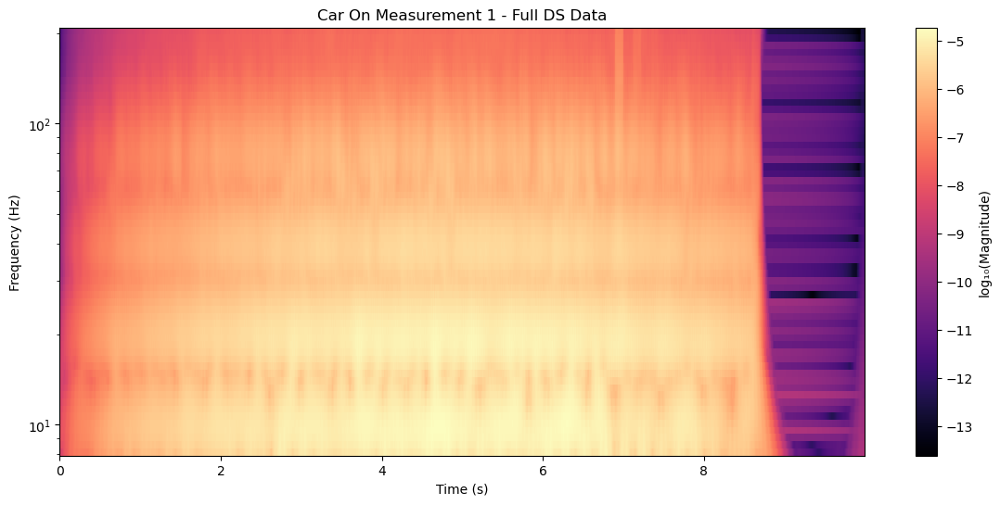

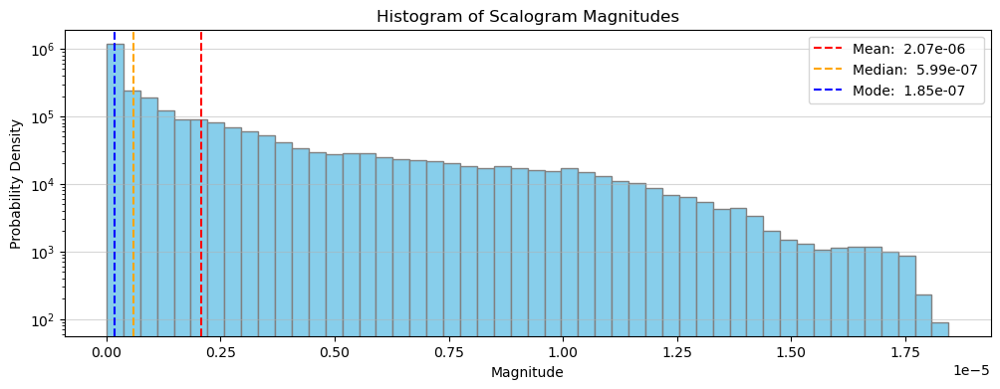

DescribeResult(nobs=300000, minmax=(2.4960988315449958e-14, 1.8450091642004516e-05), mean=2.0663062944482424e-06, variance=9.765738383316881e-12, skewness=1.989718873337427, kurtosis=3.5891787064403466)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4460,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4460)
Frequencies shape: (60,)
Time_sec shape: (4460,)


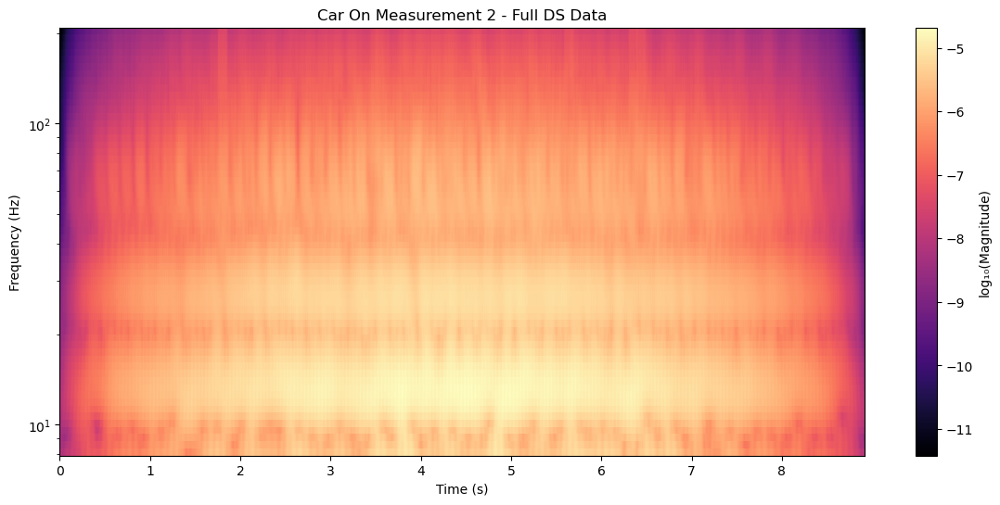

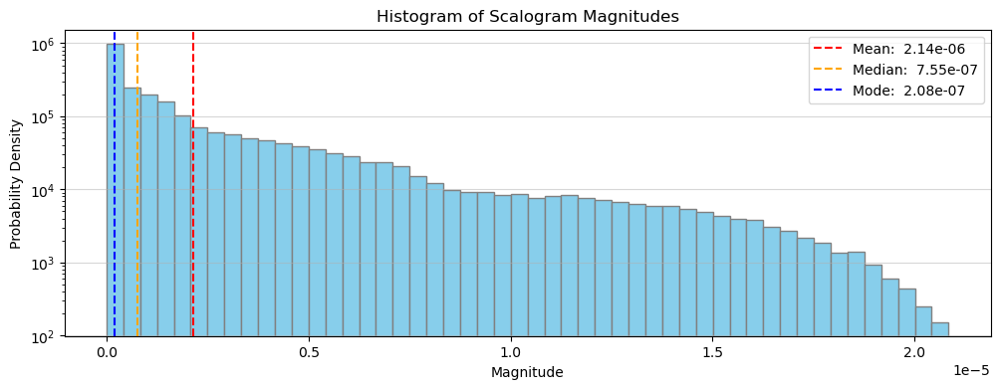

DescribeResult(nobs=267600, minmax=(3.815459244449813e-12, 2.083931129387263e-05), mean=2.1406685331729207e-06, variance=1.0663746350465563e-11, skewness=2.369757425810535, kurtosis=5.970798955404895)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4575,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4575)
Frequencies shape: (60,)
Time_sec shape: (4575,)


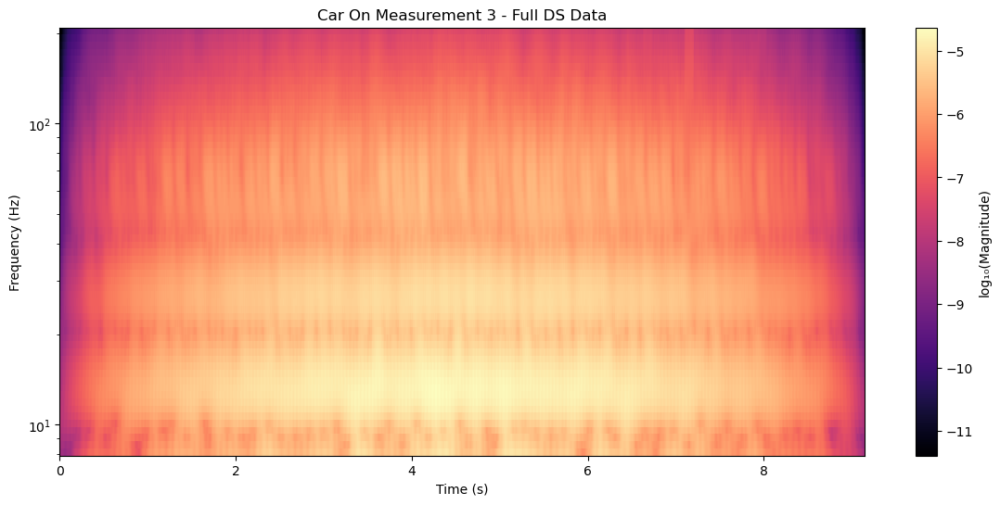

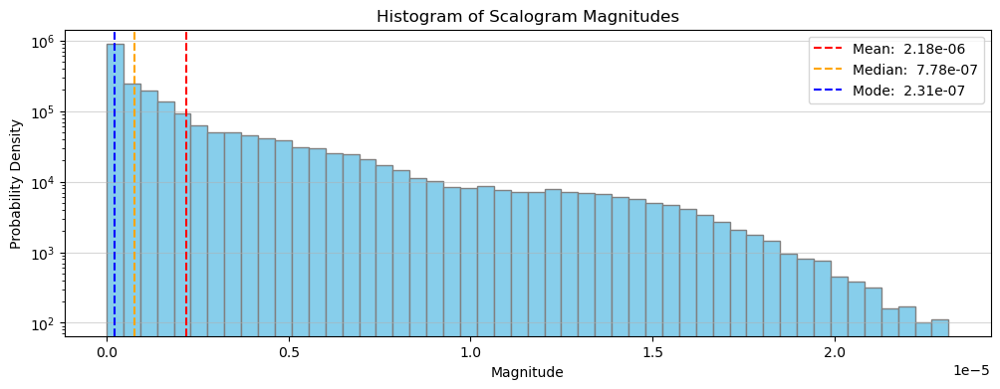

DescribeResult(nobs=274500, minmax=(4.056778338337477e-12, 2.3128560372840893e-05), mean=2.1789997568078477e-06, variance=1.1187794454772419e-11, skewness=2.3908003499222072, kurtosis=6.088322438315126)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4585,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4585)
Frequencies shape: (60,)
Time_sec shape: (4585,)


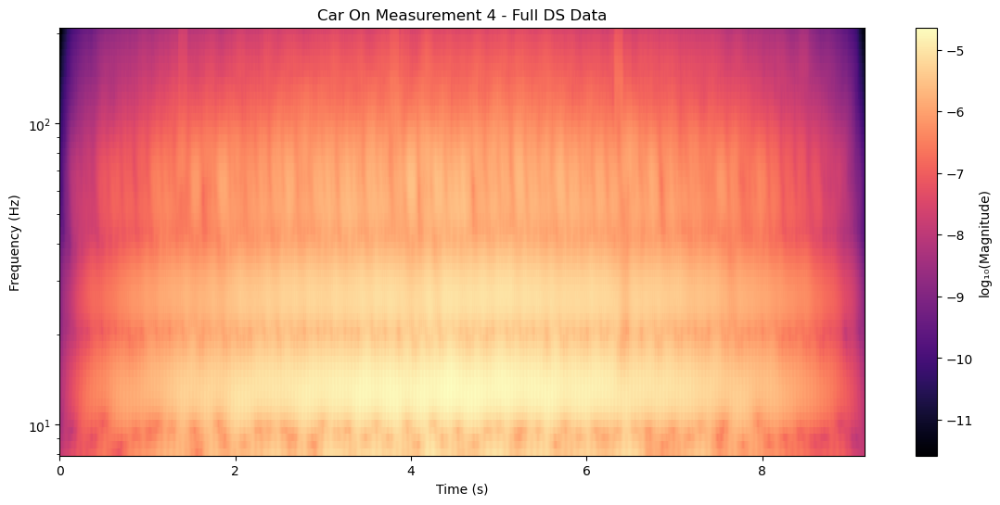

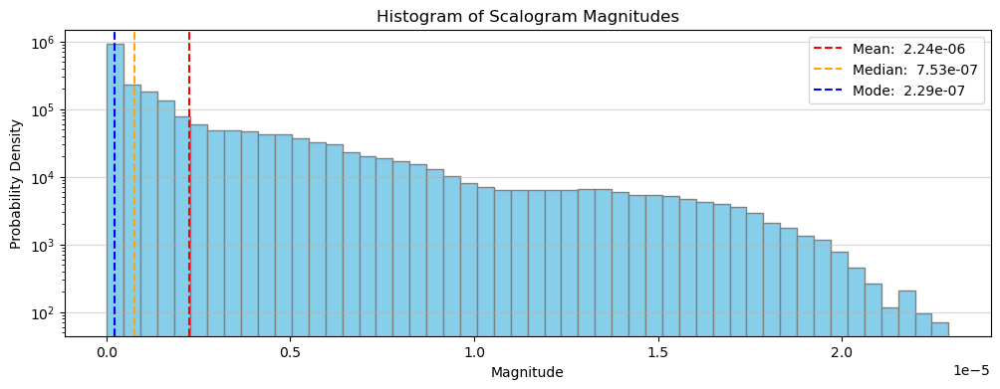

DescribeResult(nobs=275100, minmax=(2.621667162036764e-12, 2.2905964039618234e-05), mean=2.243860995436991e-06, variance=1.187105205728682e-11, skewness=2.356449922101376, kurtosis=5.911707610863285)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (5000,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 5000)
Frequencies shape: (60,)
Time_sec shape: (5000,)


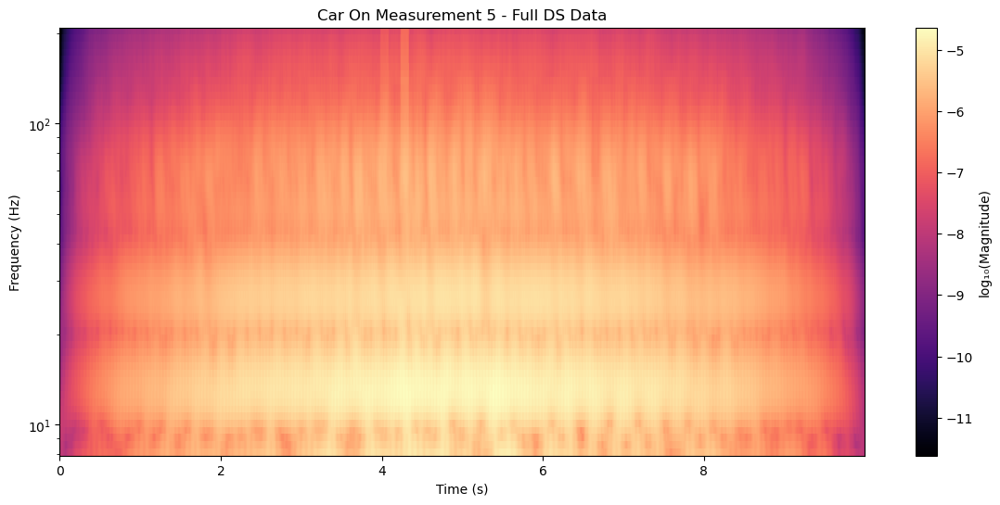

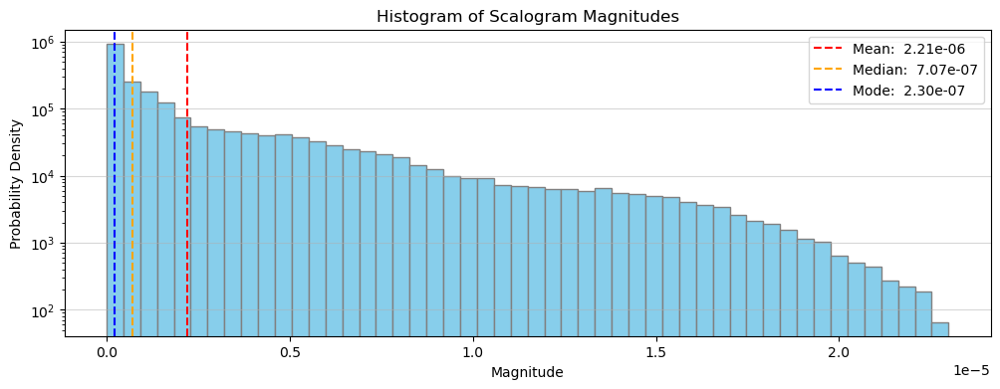

DescribeResult(nobs=300000, minmax=(2.4031274545888873e-12, 2.2988161735715916e-05), mean=2.2128126903299484e-06, variance=1.1673986094427807e-11, skewness=2.333508866668849, kurtosis=5.825779520787377)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4250,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4250)
Frequencies shape: (60,)
Time_sec shape: (4250,)


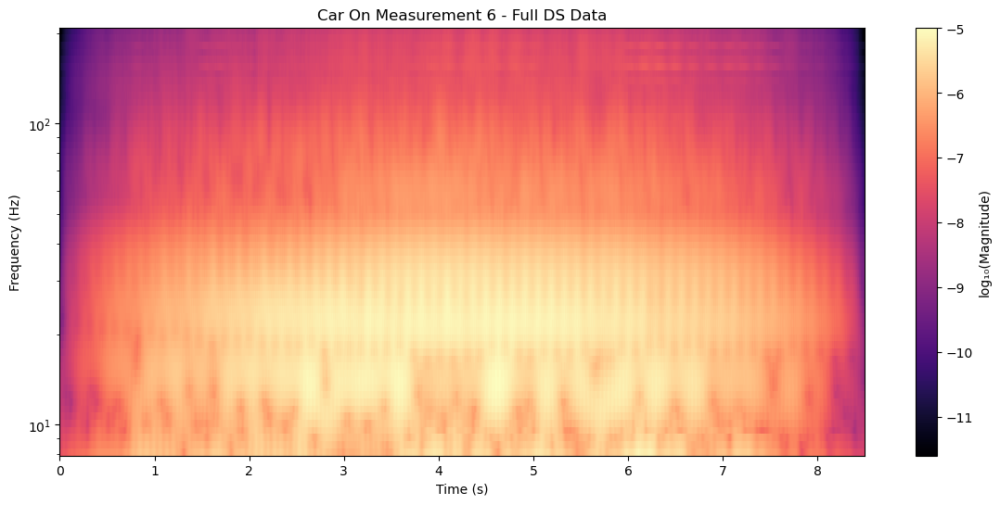

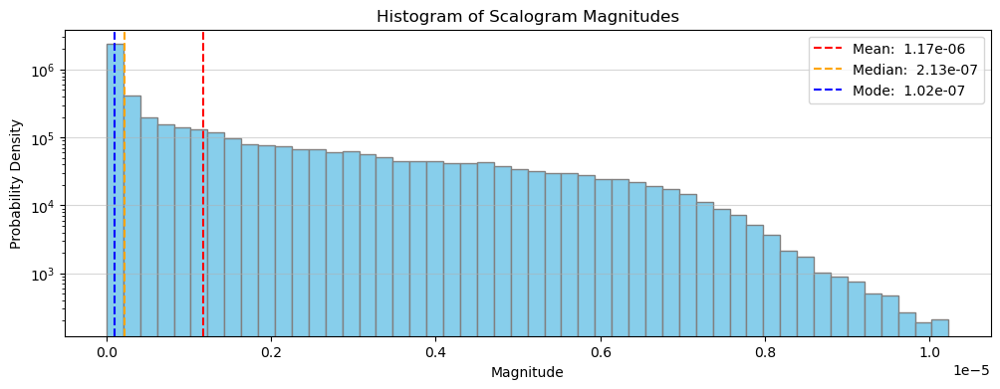

DescribeResult(nobs=255000, minmax=(2.554266892211023e-12, 1.0231723785162688e-05), mean=1.1710854227267646e-06, variance=3.2005669392976842e-12, skewness=1.7978566448877156, kurtosis=2.4922828861121262)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4345,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4345)
Frequencies shape: (60,)
Time_sec shape: (4345,)


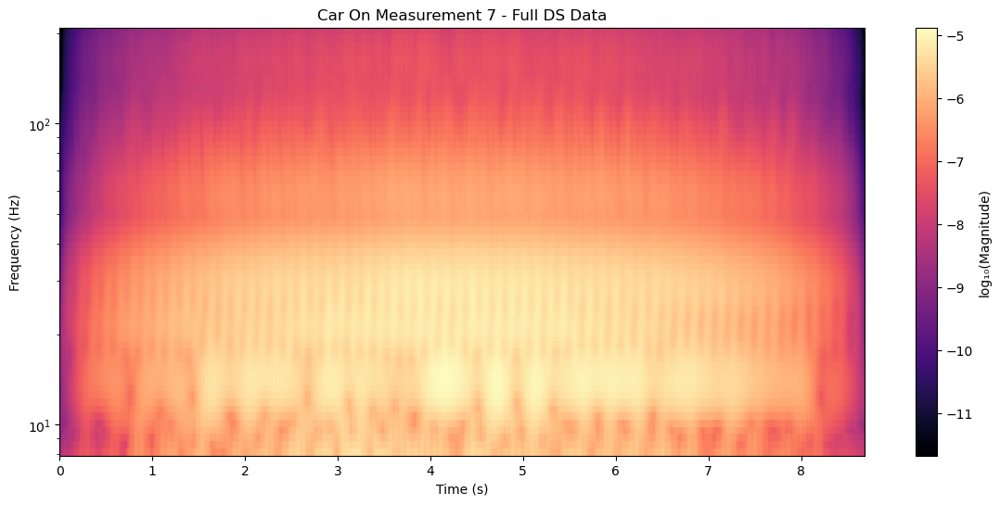

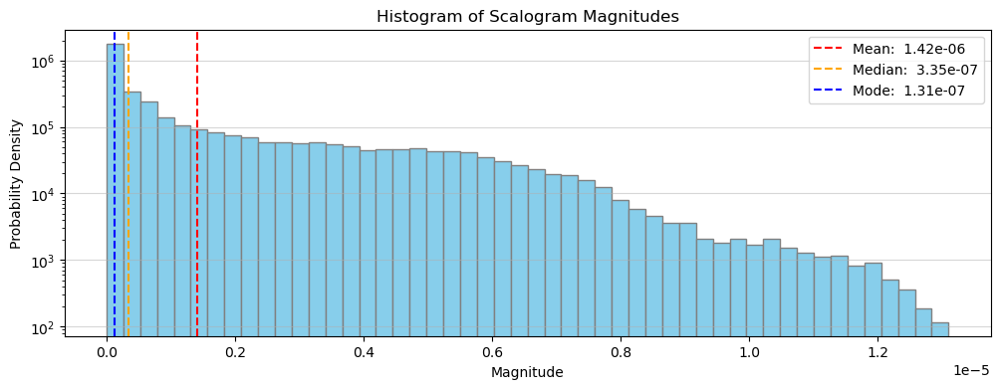

DescribeResult(nobs=260700, minmax=(2.1204479322303534e-12, 1.3102041606856596e-05), mean=1.4161724643457194e-06, variance=4.326563512027391e-12, skewness=1.7436439935511108, kurtosis=2.5496753241322727)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4470,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4470)
Frequencies shape: (60,)
Time_sec shape: (4470,)


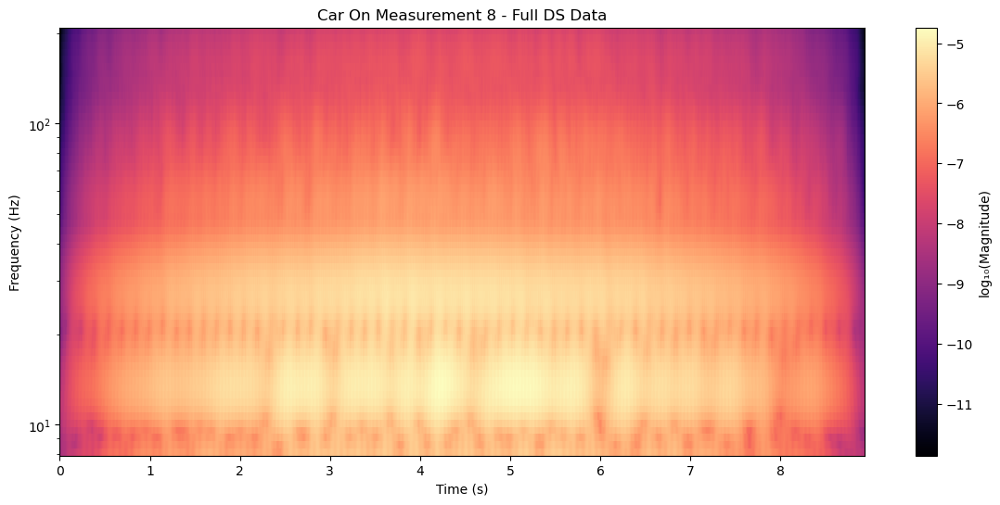

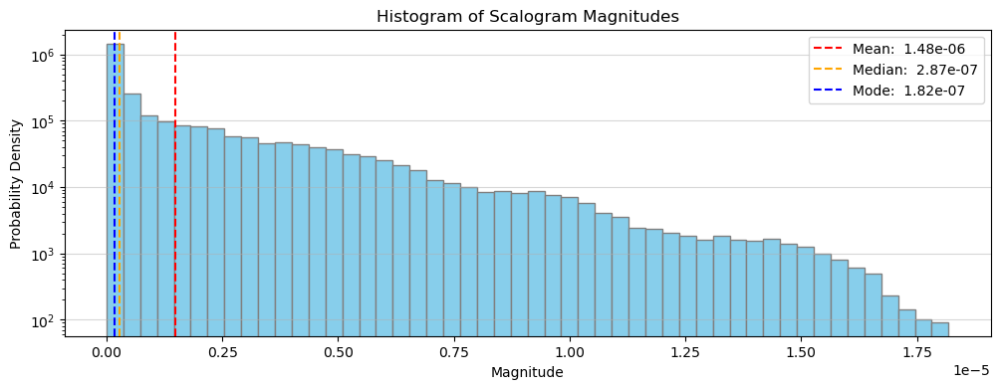

DescribeResult(nobs=268200, minmax=(1.360001793036542e-12, 1.8184590031716235e-05), mean=1.4830144157014146e-06, variance=5.840815041858097e-12, skewness=2.4016272963807737, kurtosis=6.726625864741958)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4485,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4485)
Frequencies shape: (60,)
Time_sec shape: (4485,)


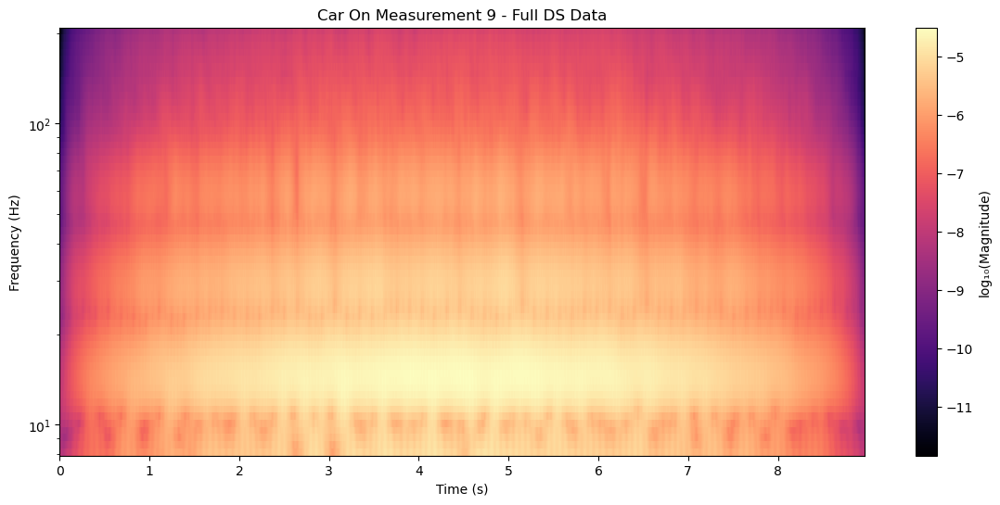

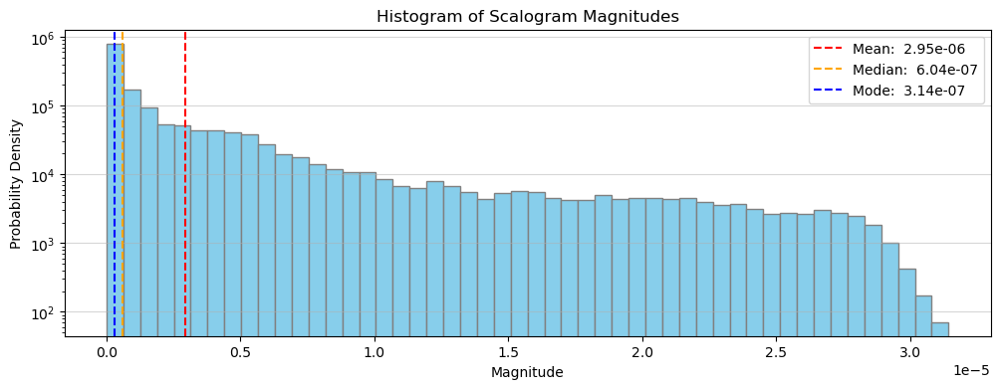

DescribeResult(nobs=269100, minmax=(1.45673425594444e-12, 3.142650447357098e-05), mean=2.949682441813511e-06, variance=2.801285495906386e-11, skewness=2.681807480990313, kurtosis=7.30713946090801)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4370,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4370)
Frequencies shape: (60,)
Time_sec shape: (4370,)


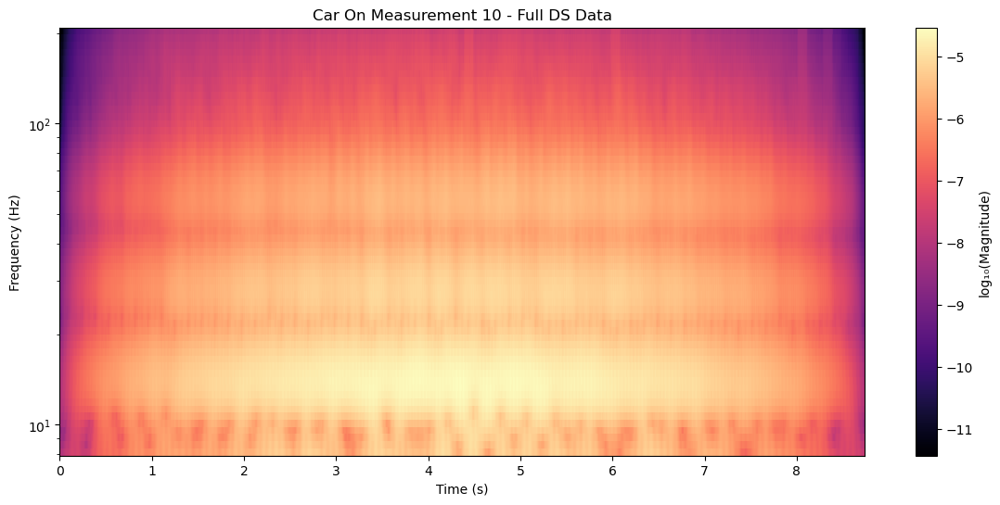

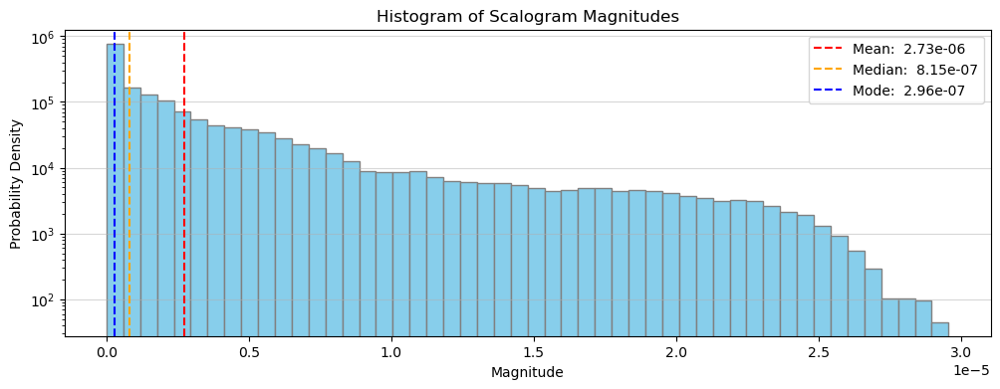

DescribeResult(nobs=262200, minmax=(3.7222059984272605e-12, 2.9574928321490644e-05), mean=2.7296967939827857e-06, variance=2.0262035918256793e-11, skewness=2.612938390831573, kurtosis=7.244491183677832)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4570,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4570)
Frequencies shape: (60,)
Time_sec shape: (4570,)


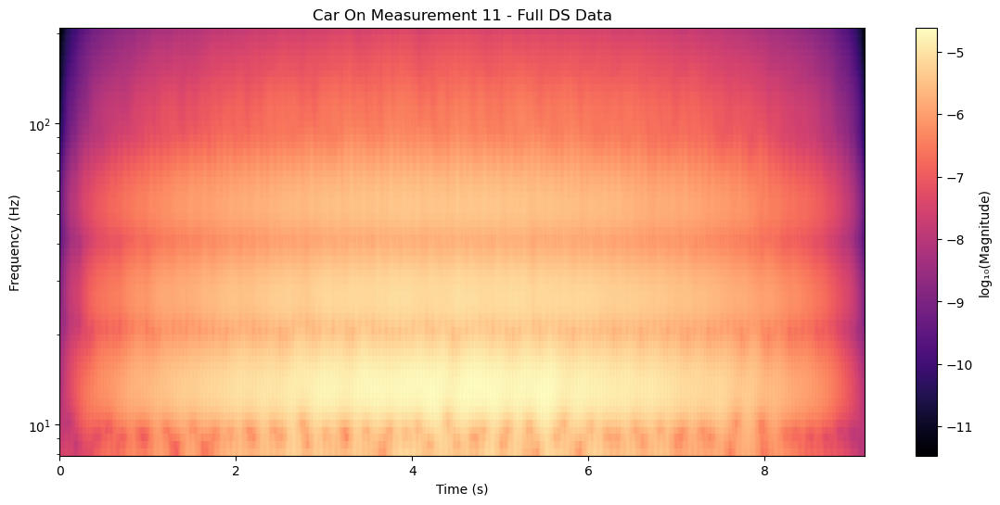

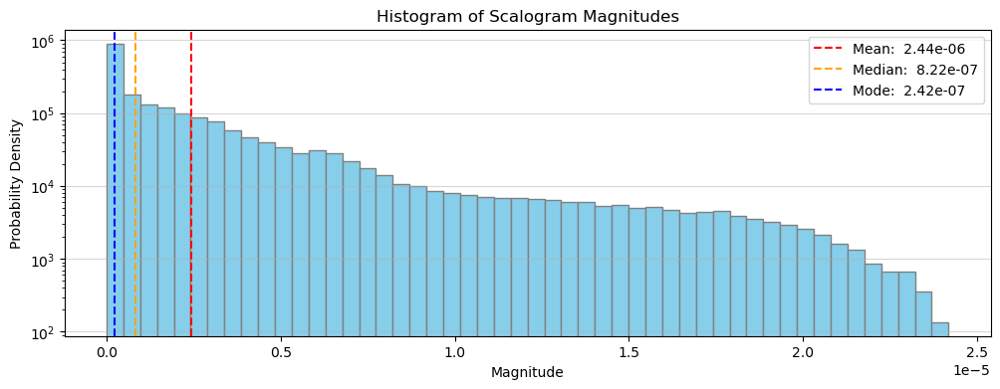

DescribeResult(nobs=274200, minmax=(3.4253408489787584e-12, 2.4176098515240464e-05), mean=2.4360272194996192e-06, variance=1.4376528414064249e-11, skewness=2.5204926697642964, kurtosis=6.908907473346485)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [24]:
for i, dframe in enumerate(car_on_dataframes):
    mean_shifted_column=f"Signal{i+1} Zero Mean (m)"
    time_column = f"Time{i+1} (s)"
    sub_tap_data = sub_tapered(apply_hann_window(dframe, mean_shifted_column), decimation_factor=50)
    print(f"Data shape: {sub_tap_data.shape}")
    time_sec = dframe[time_column][::50].values # use step == decimation_factor 
    delta_t = time_sec[1] - time_sec[0] # time step in seconds
    #print(delta_t)

    scale_min = 1.0 / (250 * delta_t)  # Small scale for high freq, use freq_max=250
    scale_max = 1.0 / (10 * delta_t)  # Large scale for low freq, use freq_min=10
    scales = np.logspace(np.log10(scale_min), np.log10(scale_max), 60) 
    # Wavelet transform:
    coefficients, frequencies = pywt.cwt(sub_tap_data, scales, 'morl', sampling_period=delta_t)
    print(f"Frequency range: {frequencies.min():.2f} to {frequencies.max():.2f} Hz")
    print(f"Coefficients shape: {coefficients.shape}")
    print(f"Frequencies shape: {frequencies.shape}")
    print(f"Time_sec shape: {time_sec.shape}")
    # Smooth in time direction (axis=1), not frequency (axis=0)
    smoothed_coefficients = uniform_filter(np.abs(coefficients), size=(1, 50))
    # Add small epsilon (if needed) to avoid log(0)
    #epsilon = 1e-10  # Small value to prevent log(0)
    #coeffs = (coefficients + epsilon)
    
    # Plot:
    plt.figure(figsize=(14, 6))
    plt.pcolormesh(time_sec, frequencies, np.log10(smoothed_coefficients), cmap='magma', shading='auto')#, vmin=-5)
    plt.colorbar(label='log\u2081\u2080(Magnitude)')
    plt.ylabel('Frequency (Hz)')
    plt.yscale('log')
    plt.xlabel('Time (s)')
    plt.title(f'Car On Measurement {i+1} - Full DS Data')
    plt.show()

    # Try to make histograms ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    magnitudes = np.abs(smoothed_coefficients)
    magnitude_values = magnitudes.flatten()
    
    fig, ax = plt.subplots(figsize=(12, 4))
    plt.hist(magnitude_values, bins=50, density = True, facecolor='skyblue', edgecolor='grey')
    plt.title("Histogram of Scalogram Magnitudes")
    plt.xlabel("Magnitude")
    plt.ylabel("Probability Density")
    plt.yscale('log')
    plt.grid(axis='y', alpha=0.5)
    plt.axvline(x=np.mean(magnitude_values), color='r', linestyle='--', label=f'Mean: {np.mean(magnitude_values): .2e}')
    plt.axvline(x=np.median(magnitude_values), color='orange', linestyle='--', label=f'Median: {np.median(magnitude_values): .2e}')
    # get mode:
    hist_counts, bin_edges = np.histogram(magnitude_values, bins=50)
    mode_bin_index = np.argmax(hist_counts)
    # Mode is the center of the bin with the highest count:
    mode_value = (bin_edges[mode_bin_index] + bin_edges[mode_bin_index + 1]) / 2
    plt.axvline(x=mode_value, color='b', linestyle='--', label=f'Mode: {mode_value: .2e}')
    plt.legend()
    plt.show()
    # some other stats:
    print(ss.describe(magnitude_values))
    std_dev = np.std(magnitude_values)
    print(f"Standard Deviation: {std_dev:.4f}")
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")

***
### Car on, music playing
##### Load data:

In [27]:
# Load data:
columns_music1 = ['Time1 (s)', 'Signal1 (m)']
dfm1 = pd.read_table("musiccar1.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=columns_music1)
#print(dfm1.head())

columns_music2 = ['Time2 (s)', 'Signal2 (m)']
dfm2 = pd.read_table("musiccar2.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=columns_music2)
#print(dfm2.head())

columns_music3 = ['Time3 (s)', 'Signal3 (m)']
dfm3 = pd.read_table("musiccar3.txt", delimiter=r'\s+', encoding='latin-1', skiprows=5, names=columns_music3)
#print(dfm3.head())

##### Plot Time Series:

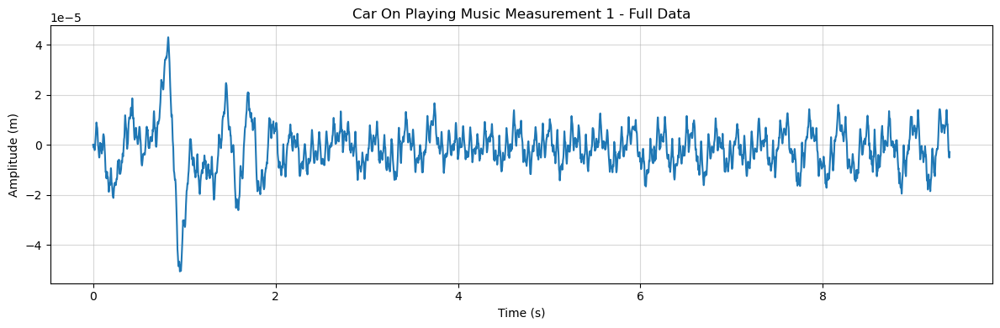

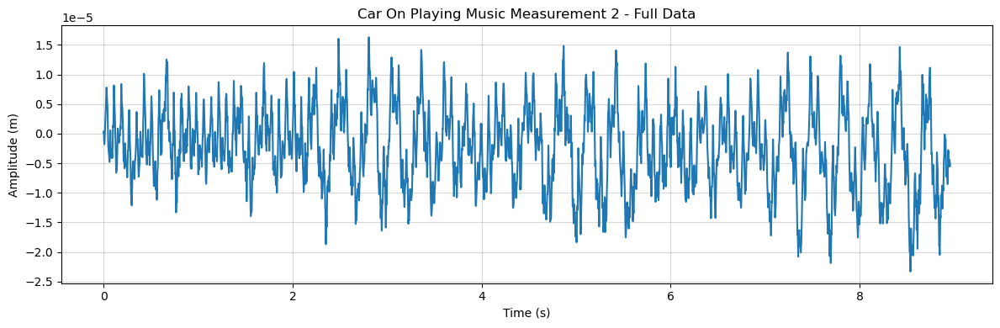

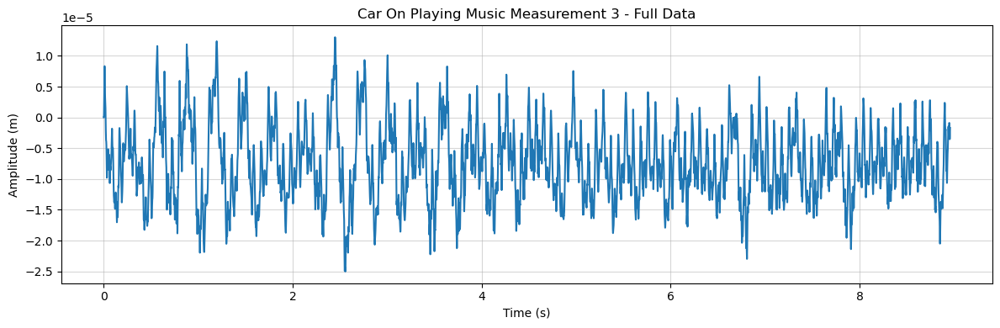

In [29]:
car_on_music_dataframes = [dfm1, dfm2, dfm3] # add more after loading more dataframes
for i, dframe in enumerate(car_on_music_dataframes):
    time_column = f"Time{i+1} (s)"
    signal_column = f"Signal{i+1} (m)"
    # Plot:
    plt.figure(figsize=(12,4))
    plt.plot(dframe[time_column], dframe[signal_column], label=f"Car On Playing Music Measurement {i+1} - Full Data")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (m)")
    plt.grid(True,alpha=0.5)
    plt.title(f"Car On Playing Music Measurement {i+1} - Full Data")
    plt.tight_layout()
    plt.show()

##### Detrending and Shifting Data to Zero Mean:

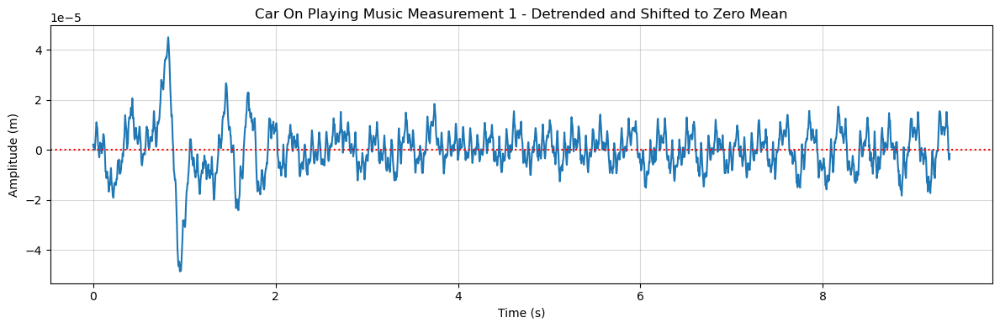

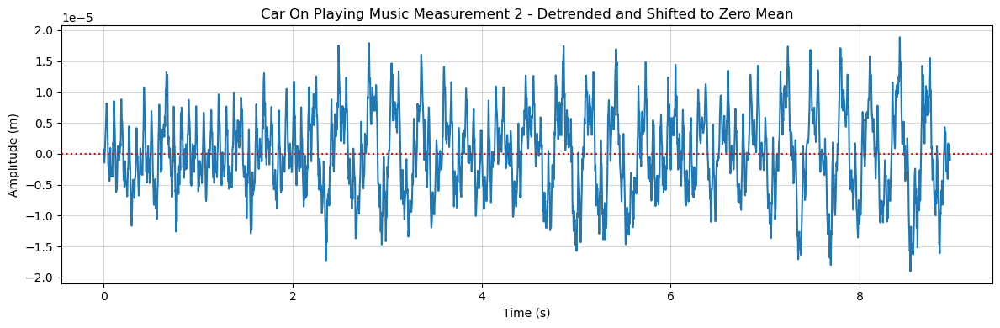

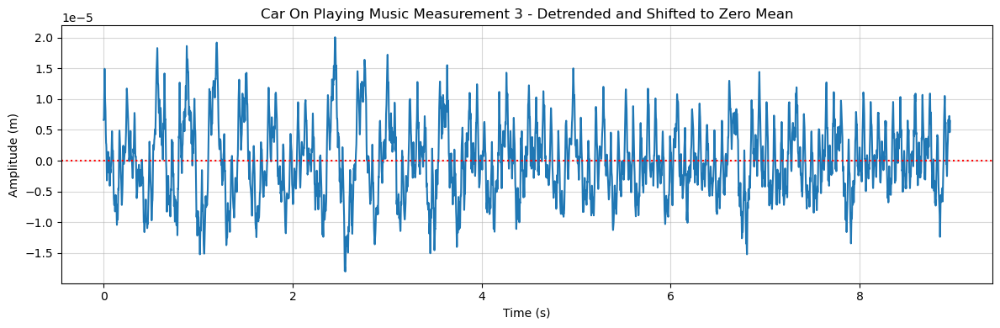

In [31]:
for i, dframe in enumerate(car_on_music_dataframes):
    time_column = f"Time{i+1} (s)"
    signal_column = f"Signal{i+1} (m)"
    detrended_signal_column = f"Signal{i+1} Detrended (m)"
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    
    # Detrend
    dframe[detrended_signal_column] = signal.detrend(dframe[signal_column], type='linear') 
    # Shift Mean to ~Zero (without normalizing)
    dframe[mean_shifted_column] = dframe[detrended_signal_column] - dframe[detrended_signal_column].mean()

    # Plot:
    plt.figure(figsize=(12,4))
    plt.plot(dframe[time_column], dframe[mean_shifted_column], label=f"Car On Playing Music Measurement {i+1} - Full Data")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (m)")
    plt.grid(True,alpha=0.5)
    plt.axhline(y=0.0, label="0.0", color='red', linestyle=":")
    plt.title(f"Car On Playing Music Measurement {i+1} - Detrended and Shifted to Zero Mean")
    plt.tight_layout()
    plt.show()

##### Tapering Detrended and Shifted (DS) Time Series
- A Hann window is used for tapering

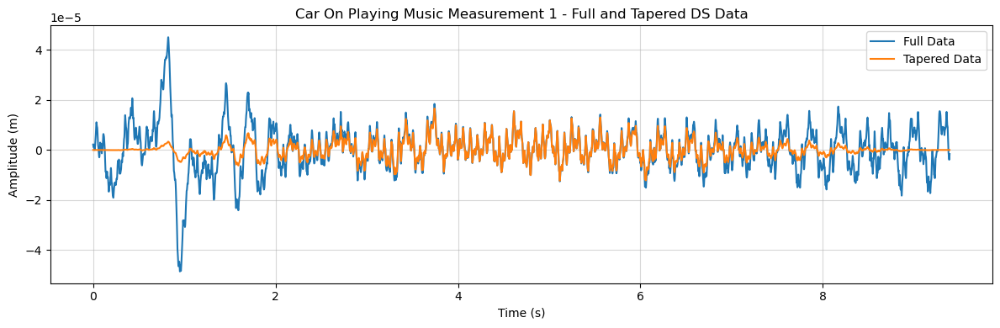

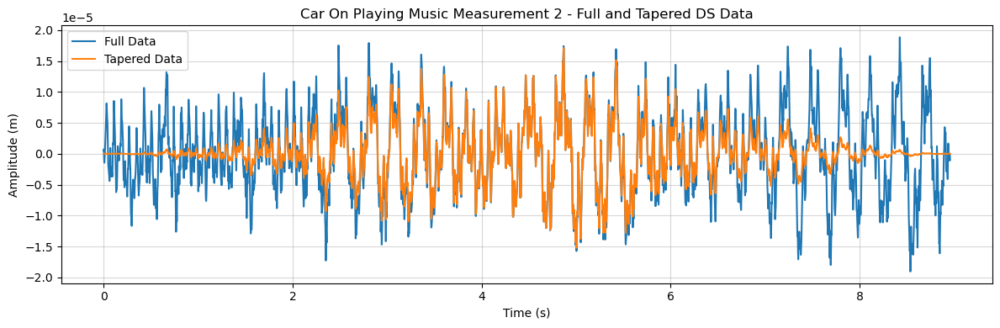

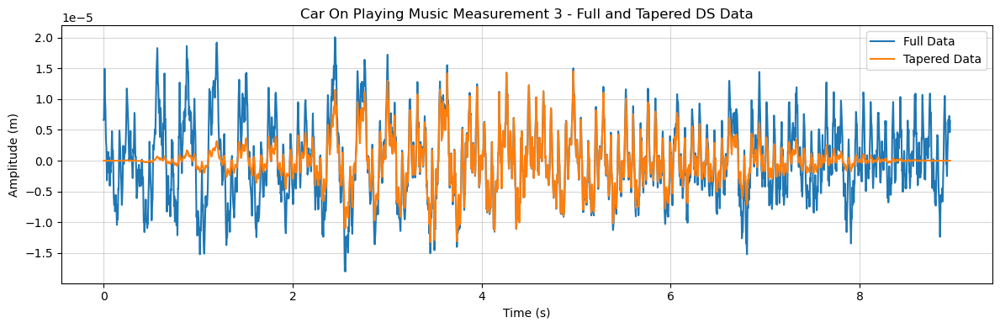

In [33]:
for i, dframe in enumerate(car_on_music_dataframes):
    tapered_data = []
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    hann_result = apply_hann_window(dframe, mean_shifted_column) # taper all dataframes
    tapered_data.append(hann_result)
    time_column = f"Time{i+1} (s)" # need time column for plotting
    # Plot:
    plt.figure(figsize=(12,4))
    plt.plot(dframe[time_column], dframe[mean_shifted_column], label=f"Full Data")
    plt.plot(dframe[time_column], tapered_data[-1], label=f"Tapered Data")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (m)")
    plt.grid(True,alpha=0.5)
    plt.title(f"Car On Playing Music Measurement {i+1} - Full and Tapered DS Data")
    plt.legend()
    plt.tight_layout()
    plt.show()

##### 'percent_check' function for tapering

In [35]:
def percent_check_tapered(original_data, tapered_data_full, padding, tolerance=0.05):
    """original_data : Original unpadded time series (array)
    tapered_data_full : Tapered time series, includes padding (array)
    padding : Amount of padding added to each end (int)
    tolerance : Acceptable error as fraction of data range (float)"""
    # Extract original from tapered data (remove padding)
    if padding > 0:
        tapered_original_region = tapered_data_full[padding:-padding]
    else:
        tapered_original_region = tapered_data_full
    
    # Direct comparison: tapered vs original
    abs_errors = np.abs(original_data - tapered_original_region)
    # normalization
    data_range = np.max(original_data) - np.min(original_data)
    normalized_errors = abs_errors / data_range
    
    # Calculate metrics
    within_tolerance = normalized_errors <= tolerance
    pct_within = (np.sum(within_tolerance) / len(within_tolerance))*100
    
    # Mean Absolute Error (MAE) metrics
    mae = np.mean(abs_errors)
    std_original = np.std(original_data)
    mae_pct_std = (mae / std_original)*100
    
    passes = pct_within >= 95
    
    results = {'padding': padding,
        'tolerance': f'{tolerance*100}%',
        'passes': passes,
        'points_within_tolerance': f'{pct_within: .4f}%',
        'max_normalized_error': f'{(np.max(normalized_errors)*100): .4f}%',
        'mean_abs_error': f'{mae: .4f}',
        'mae_as_%_of_std': f'{mae_pct_std: .4f}%',
        'num_points': len(original_data),
        'data_range': f'{data_range: .4f}'}
    
    return results
    
for i, dframe in enumerate(car_on_music_dataframes):
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    tapered_data = []
    hann_result = apply_hann_window(dframe, mean_shifted_column) # taper all dataframes
    tapered_data.append(hann_result)
    percent_check_tapered_results = percent_check_tapered(dframe[mean_shifted_column], tapered_data[-1], padding=0, tolerance=0.05)
    print(f"dataframe: dfm{i+1}")
    print(percent_check_tapered_results)
    print("")

dataframe: dfm1
{'padding': 0, 'tolerance': '5.0%', 'passes': False, 'points_within_tolerance': ' 72.0043%', 'max_normalized_error': ' 46.7948%', 'mean_abs_error': ' 0.0000', 'mae_as_%_of_std': ' 44.0602%', 'num_points': 234729, 'data_range': ' 0.0001'}

dataframe: dfm2
{'padding': 0, 'tolerance': '5.0%', 'passes': False, 'points_within_tolerance': ' 56.5071%', 'max_normalized_error': ' 49.1707%', 'mean_abs_error': ' 0.0000', 'mae_as_%_of_std': ' 39.9041%', 'num_points': 223979, 'data_range': ' 0.0000'}

dataframe: dfm3
{'padding': 0, 'tolerance': '5.0%', 'passes': False, 'points_within_tolerance': ' 56.5379%', 'max_normalized_error': ' 46.1976%', 'mean_abs_error': ' 0.0000', 'mae_as_%_of_std': ' 40.7564%', 'num_points': 223979, 'data_range': ' 0.0000'}



##### Subsampling DS Time Series

Original sampling rate for Signal1 Zero Mean (m): 25000 Hz
New sampling rate for Signal1 Zero Mean (m): 500 Hz


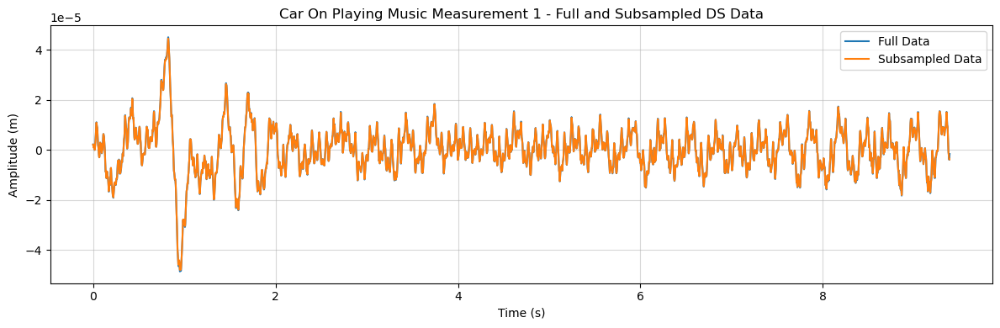

Original sampling rate for Signal2 Zero Mean (m): 25000 Hz
New sampling rate for Signal2 Zero Mean (m): 500 Hz


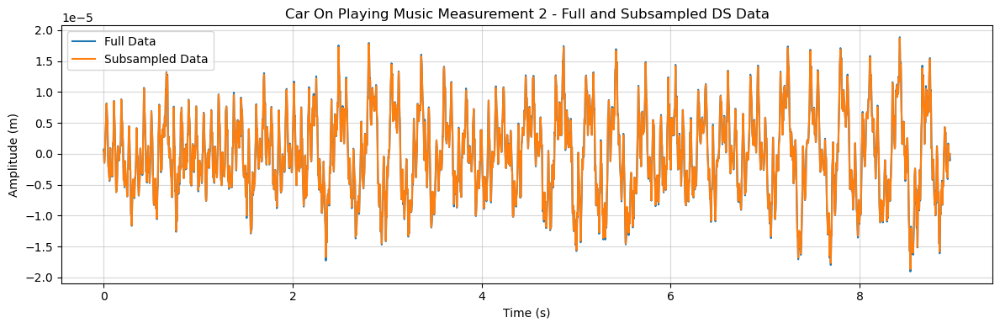

Original sampling rate for Signal3 Zero Mean (m): 25000 Hz
New sampling rate for Signal3 Zero Mean (m): 500 Hz


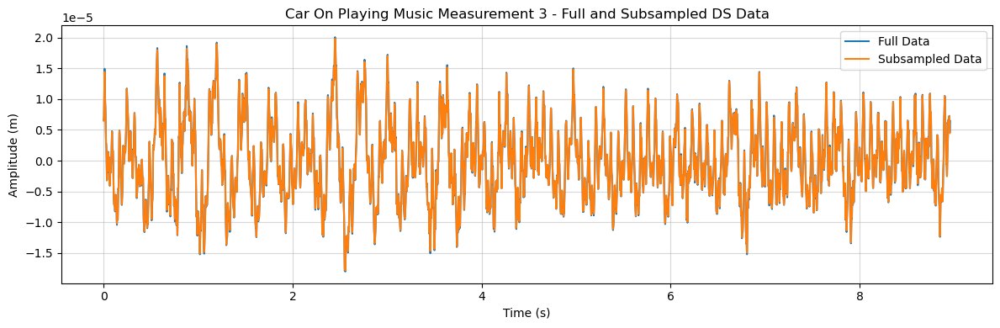

In [37]:
# Subsampling the tapered time series
#Sampling Rate = Total Number of Samples / Total Time (in seconds)
def subsample(data, column, decimation_factor):
    """Subsample data using scipy.signal.decimate with anti-aliasing filter.
    data: input data e.g. df1
    column: column to subsample (e.g. "Signal1 Zero Mean (m)"), string
    decimation_factor: factor by which to reduce sampling rate"""
    num_samples=len(data[column])
    sampling_time=data.iloc[-1, 0] #get last value in first column (time (s))
    original_sampling_rate = int(num_samples/sampling_time)
    print(f"Original sampling rate for {column}: {original_sampling_rate} Hz")
    # scipy.signal.decimate applies an anti-aliasing filter automatically
    # Use a higher order filter for better anti-aliasing (default is 8)
    decimated_data = scipy.signal.decimate(data[column], decimation_factor, ftype='iir', zero_phase=True) # 
    # get new sampling rate:
    new_sr = int(original_sampling_rate / decimation_factor)
    print(f"New sampling rate for {column}: {new_sr} Hz")
    return decimated_data, new_sr, original_sampling_rate

for i, dframe in enumerate(car_on_music_dataframes):
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    time_column = f"Time{i+1} (s)"
    subsample_result = subsample(dframe, mean_shifted_column, decimation_factor=50)
    subsampled_data = subsample_result[0]
    # sub_list = []
    # sub_list.append(subsampled_data)
    
    # Plot:
    plt.figure(figsize=(12,4))
    plt.plot(dframe[time_column], dframe[mean_shifted_column], label=f"Full Data")
    plt.plot(dframe[time_column][::50], subsampled_data, label=f"Subsampled Data") # Make sure time step is same as decimation_factor
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (m)")
    plt.grid(True, alpha=0.5)
    plt.title(f"Car On Playing Music Measurement {i+1} - Full and Subsampled DS Data")
    plt.legend()
    #plt.xlim(4,5)
    plt.tight_layout()
    plt.show()

##### 'percent_check' function for subsampling

In [39]:
def percent_check_scipy_decimate(data, column, step, tolerance=0.05):
    x_original = np.arange(len(data))
    y_original = data[column].values
    
    # Get subsampled series
    x_subsampled = np.arange(0, len(data), step)
    y_subsampled=scipy.signal.decimate(data[column].values, step, ftype='iir', zero_phase=True)
    
    # Interpolate subsampled data back to original timestamps
    f_interp = interpolate.interp1d(x_subsampled, y_subsampled, kind='linear', fill_value='extrapolate')
    y_reconstructed = f_interp(x_original)
    
    # Calculate absolute errors
    abs_errors = np.abs(y_original - y_reconstructed)
    
    # Calculate data range (the scale of the data)
    data_range = np.max(y_original) - np.min(y_original)
    #print("data_range:", data_range)
    # Normalize errors by data range instead of individual values
    normalized_errors = abs_errors / data_range
    
    # Test if within tolerance
    within_tolerance = normalized_errors <= tolerance
    pct_within = (np.sum(within_tolerance) / len(within_tolerance)) * 100
    
    # Overall pass/fail
    passes = pct_within >= 95  # At least 95% of points within tolerance
    
    results = {'step': step,
        'tolerance': f'{tolerance*100}%',
        'passes': passes,
        'points_within_tolerance': f'{pct_within: .4f}%',
        'num_original_points': len(y_original),
        'num_subsampled_points': len(y_subsampled),
        'data_range': f'{data_range: .4f}',  
        'max_normalized_error': f'{(np.max(normalized_errors)*100): .4f}%' }
    return results

for i, dframe in enumerate(car_on_music_dataframes):
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    print(f"dataframe: dfm{i+1}")
    scipy_decimate_pct_check_results = percent_check_scipy_decimate(dframe, mean_shifted_column, step=50, tolerance=0.05)
    print(scipy_decimate_pct_check_results)
    print("")

dataframe: dfm1
{'step': 50, 'tolerance': '5.0%', 'passes': True, 'points_within_tolerance': ' 100.0000%', 'num_original_points': 234729, 'num_subsampled_points': 4695, 'data_range': ' 0.0001', 'max_normalized_error': ' 2.3163%'}

dataframe: dfm2
{'step': 50, 'tolerance': '5.0%', 'passes': True, 'points_within_tolerance': ' 100.0000%', 'num_original_points': 223979, 'num_subsampled_points': 4480, 'data_range': ' 0.0000', 'max_normalized_error': ' 2.6374%'}

dataframe: dfm3
{'step': 50, 'tolerance': '5.0%', 'passes': True, 'points_within_tolerance': ' 99.9987%', 'num_original_points': 223979, 'num_subsampled_points': 4480, 'data_range': ' 0.0000', 'max_normalized_error': ' 5.1645%'}



##### Subsampling the Tapered DS Time Series

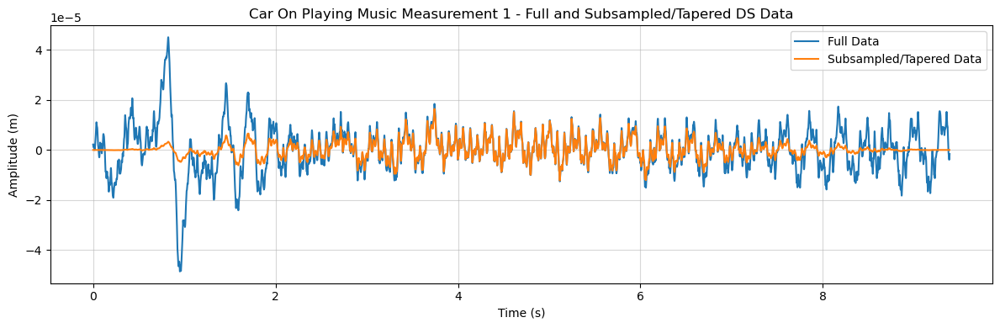

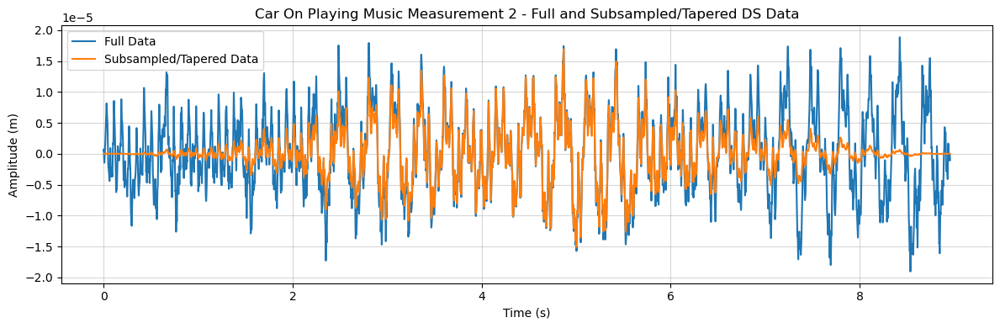

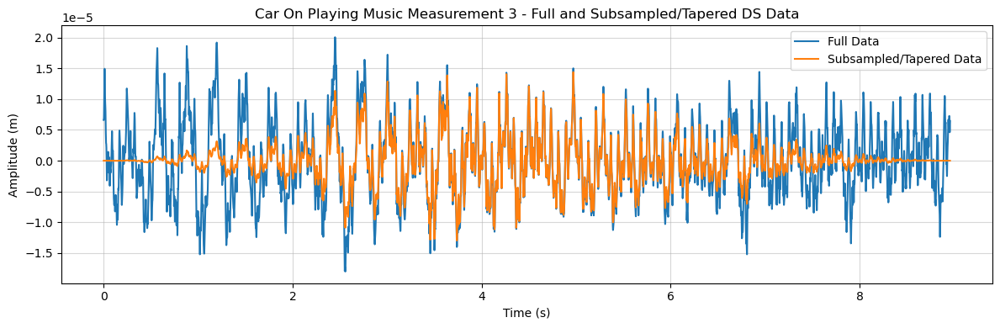

In [41]:
def sub_tapered(tapered_data, decimation_factor):
    sub_tap_data = scipy.signal.decimate(tapered_data, decimation_factor, ftype='iir', zero_phase=True)
    return sub_tap_data

for i, dframe in enumerate(car_on_music_dataframes):
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    time_column = f"Time{i+1} (s)"
    sub_tap_result = sub_tapered(apply_hann_window(dframe, mean_shifted_column), decimation_factor=50)
    
    # PLot:
    plt.figure(figsize=(12,4))
    plt.plot(dframe[time_column], dframe[mean_shifted_column], label=f"Full Data")
    plt.plot(dframe[time_column][::50], sub_tap_result, label=f"Subsampled/Tapered Data") # Make sure time step is same as decimation_factor
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (m)")
    plt.grid(True, alpha=0.5)
    plt.title(f"Car On Playing Music Measurement {i+1} - Full and Subsampled/Tapered DS Data")
    plt.legend()
    plt.tight_layout()
    plt.show()

##### Fast Fourier Transform
- Plotting FFT spectra showing tapered/subsampled data overlayed onto full DS data for a given dataframe

dataframe: dfm1


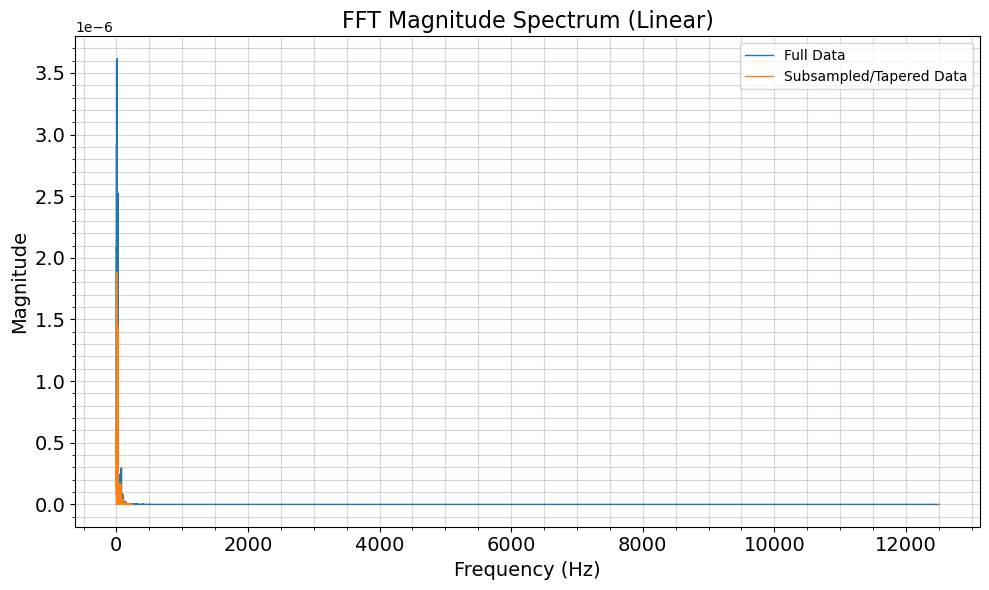

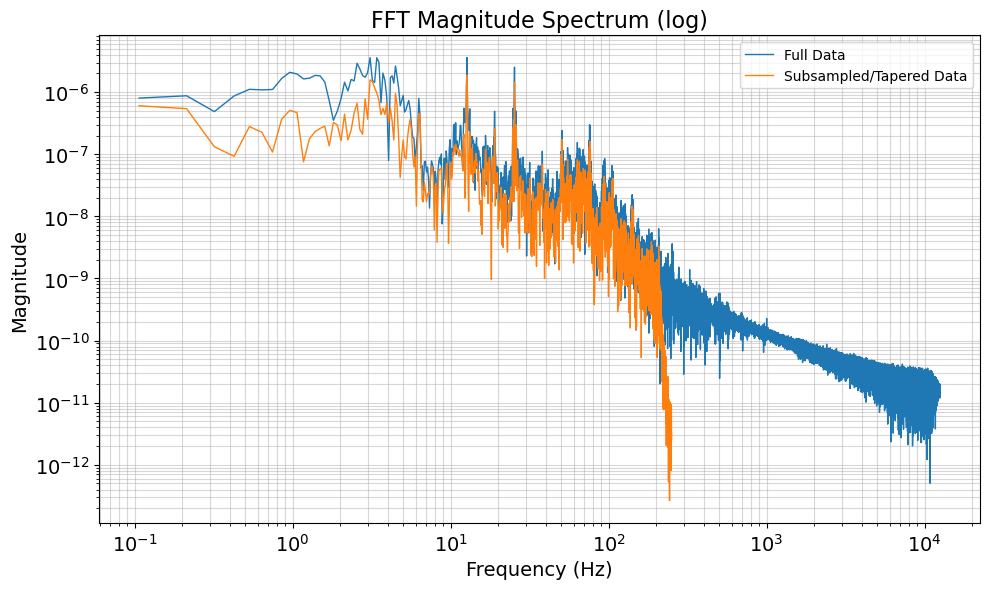

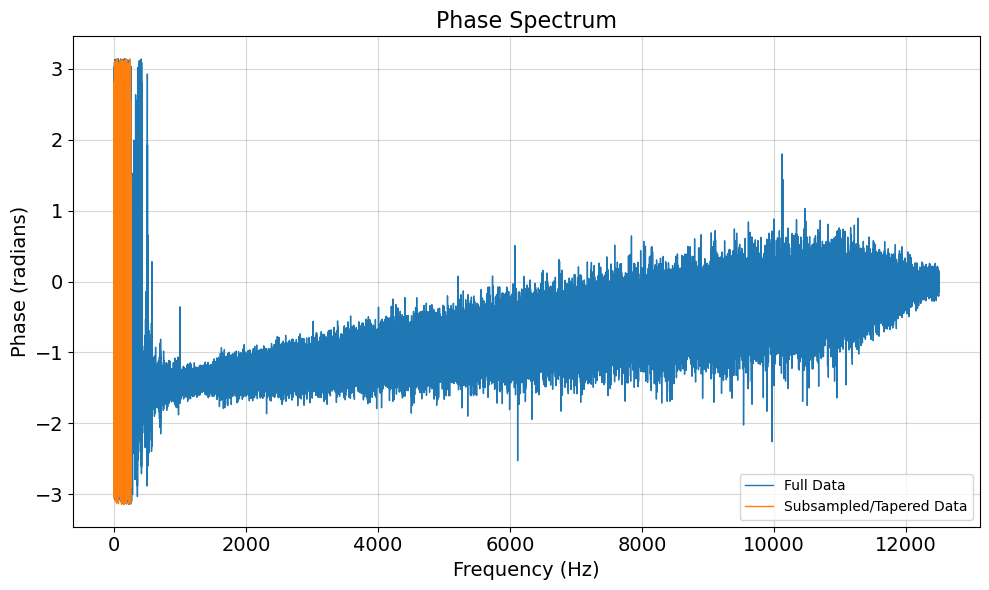

dataframe: dfm2


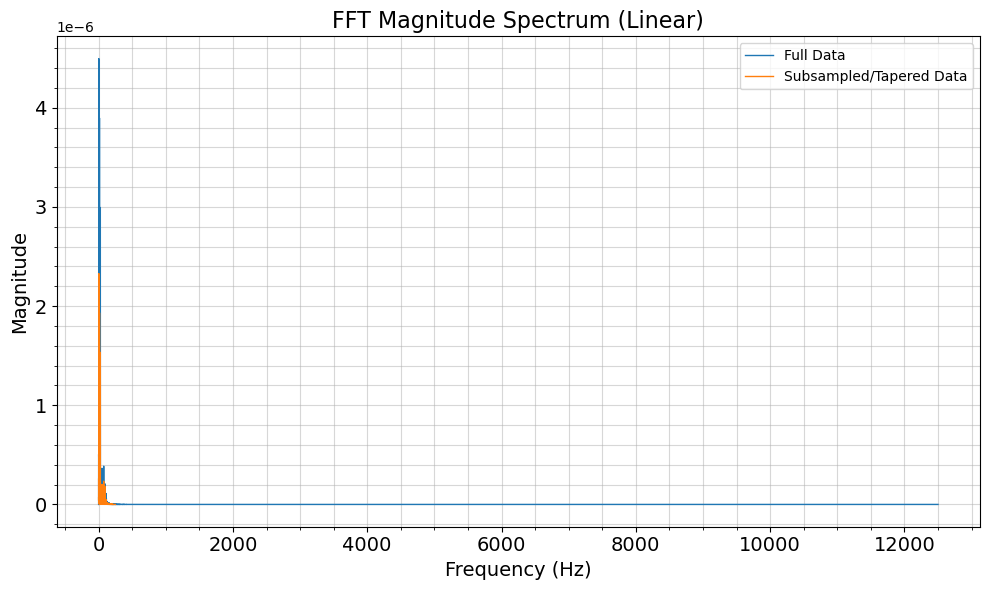

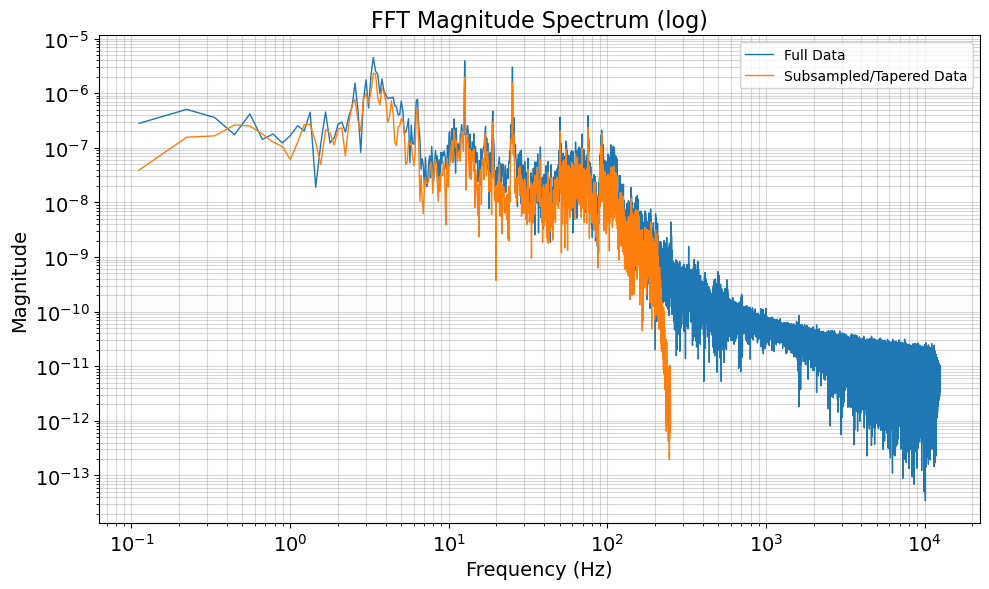

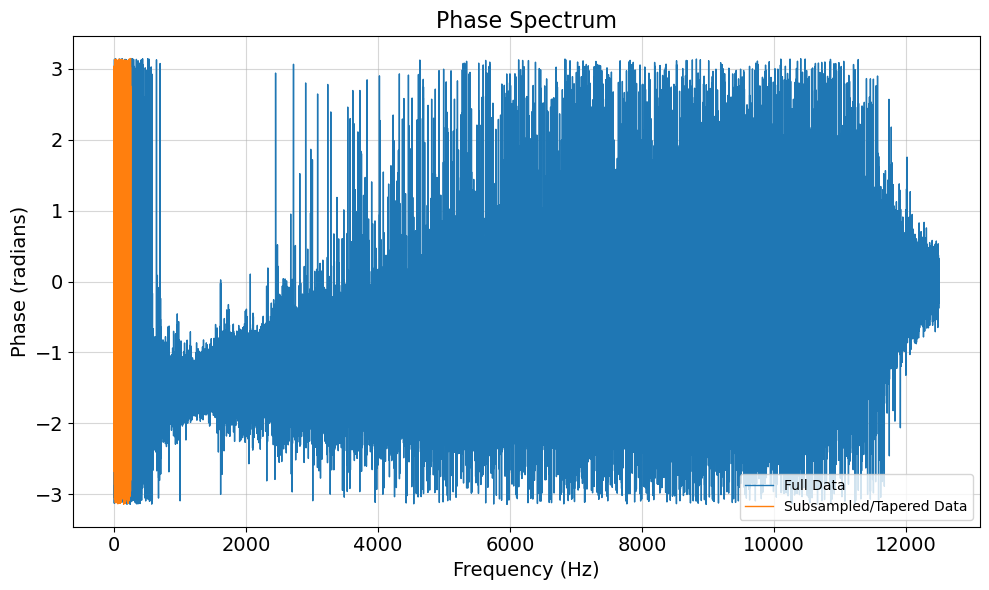

dataframe: dfm3


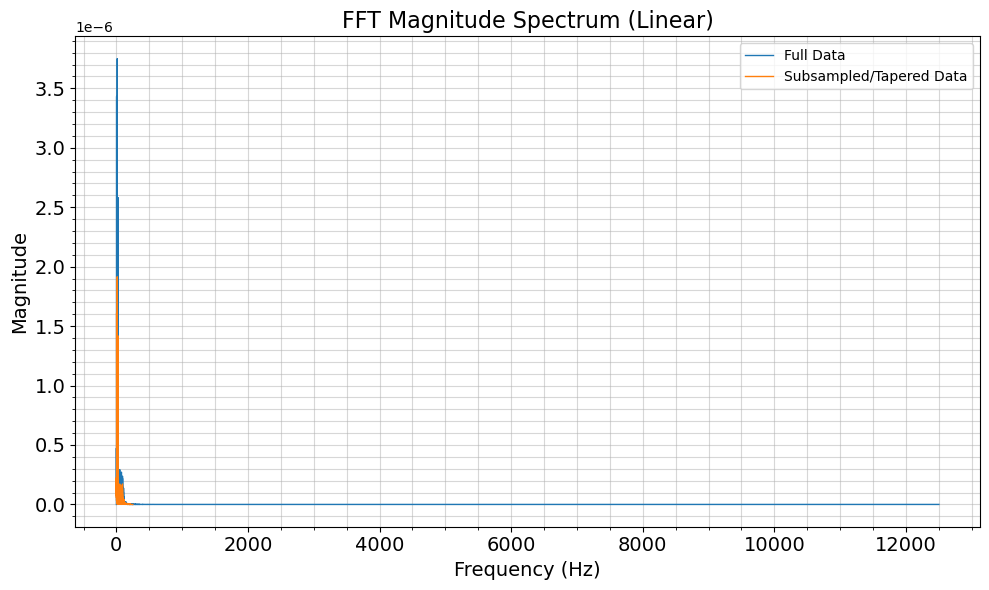

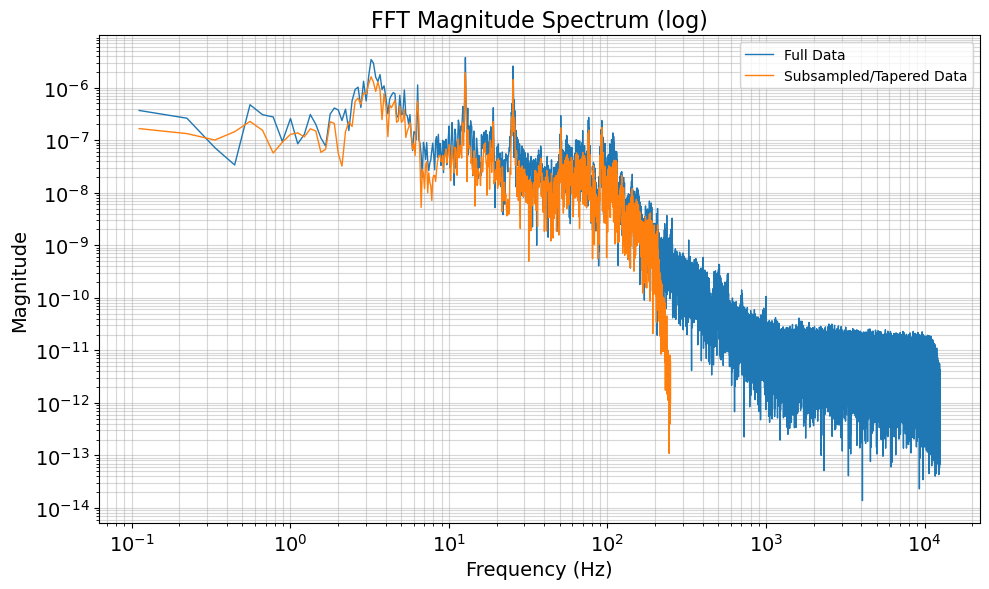

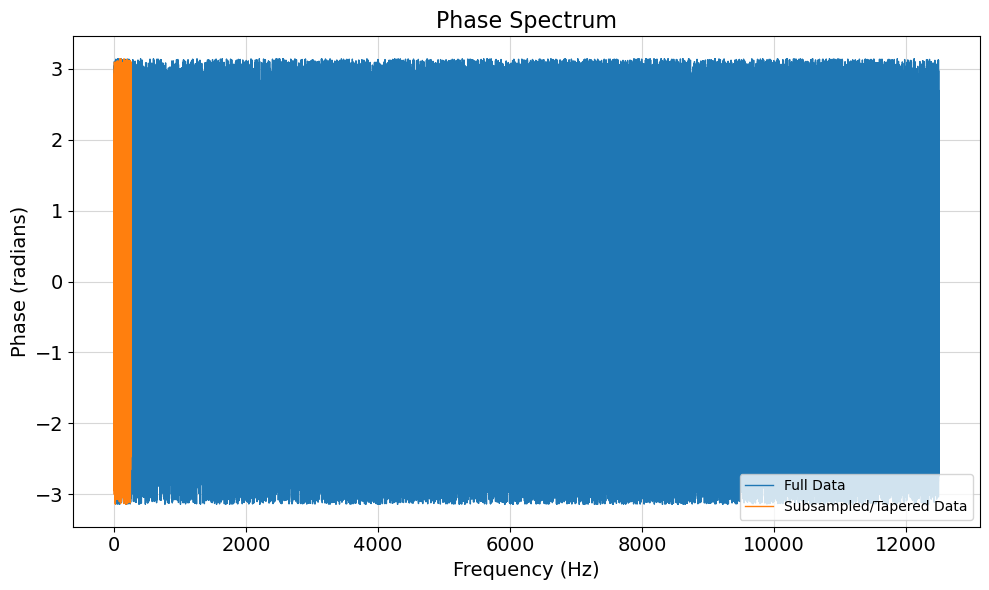

In [74]:
# Plotting FFT spectra showing tapered/subsampled data overlayed onto full DNS data for a given dataframe
def plot_fft(data, sr, fig1=None, fig2=None, fig3=None, name='', apply_window=True):
    """Plot FFT with windowing correction.
    data: array
    sr: Sampling rate
    apply_window : bool, says whether to apply Hann window (default True)"""
    n = len(data)
    
    # Apply window if requested
    if apply_window:
        window = np.hanning(n)
        windowed_data = data * window
    else:
        windowed_data = data
        coherent_gain=1.0
    
    # Compute FFT
    fft_values = scipy.fft.rfft(windowed_data)
    freqs = scipy.fft.rfftfreq(n, d=1/sr)
    
    # magnitudes WITHOUT coherent gain correction
    magnitudes = np.abs(fft_values) / n

    # Double the AC components (not DC and Nyquist)
    magnitudes[1:] *= 2.0

    # Undo doubling for Nyquist if even length
    if n % 2 == 0:
        magnitudes[-1] /= 2.0
    
    phases = np.angle(fft_values)
    
    # Create figures:
    if fig1 is None:
        fig1 = plt.figure(figsize=(10,6))
        plt.plot(freqs, magnitudes, linewidth=1, label=name)
        plt.title('FFT Magnitude Spectrum (Linear)', fontsize=16)
        plt.xlabel('Frequency (Hz)', fontsize=14)
        plt.ylabel('Magnitude', fontsize=14)
        plt.grid(True, which='major', alpha=0.5)
        plt.grid(True, which='minor', alpha=0.5)
        plt.minorticks_on()
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.tight_layout()
        if name:
            plt.legend(loc='upper right')
    else:
        plt.figure(fig1.number)
        plt.plot(freqs, magnitudes, linewidth=1, label=name)
        if name:
            plt.legend(loc='upper right')
    
    if fig2 is None:
        fig2 = plt.figure(figsize=(10, 6))
        plt.loglog(freqs[1:], magnitudes[1:], linewidth=1, label=name)
        plt.title('FFT Magnitude Spectrum (log)', fontsize=16)
        plt.xlabel('Frequency (Hz)', fontsize=14)
        plt.ylabel('Magnitude', fontsize=14)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.grid(True, which='major', alpha=0.5)
        plt.grid(True, which='minor', alpha=0.5)
        plt.tight_layout()
        if name:
            plt.legend(loc='upper right')
    else:
        plt.figure(fig2.number)
        plt.loglog(freqs[1:], magnitudes[1:], linewidth=1, label=name)
        plt.legend()
        if name:
            plt.legend(loc='upper right')
    
    if fig3 is None:
        fig3 = plt.figure(figsize=(10, 6))
        plt.plot(freqs[1:], phases[1:], linewidth=1, label=name)
        plt.title('Phase Spectrum', fontsize=16)
        plt.xlabel('Frequency (Hz)', fontsize=14)
        plt.ylabel('Phase (radians)', fontsize=14)
        plt.grid(True, alpha=0.5)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        #plt.xlim(-1, 50)
        plt.tight_layout()
        if name:
            plt.legend(loc='lower right', framealpha=0.5)
    else:
        plt.figure(fig3.number)
        plt.plot(freqs[1:], phases[1:], linewidth=1, label=name)
        if name:
            plt.legend(loc='lower right', framealpha=0.8)
    
    return fig1, fig2, fig3
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
for i, dframe in enumerate(car_on_music_dataframes):
    mean_shifted_column = f"Signal{i+1} Zero Mean (m)"
    time_column = f"Time{i+1} (s)"
    decimation_factor=50 # step used for subsampling
    print(f"dataframe: dfm{i+1}")
    # For full data
    fig1, fig2, fig3 = plot_fft(dframe[mean_shifted_column].values, sr=25000, name='Full Data', apply_window=False)
    # For tapered/subsampled data
    sub_tap_results=[]
    sub_tap_result = sub_tapered(apply_hann_window(dframe, mean_shifted_column), decimation_factor=50)
    sub_tap_results.append(sub_tap_result)
    plot_fft(sub_tap_results[-1], sr=25000//decimation_factor, fig1=fig1, fig2=fig2, fig3=fig3, name='Subsampled/Tapered Data', apply_window=False)
    plt.show()

##### Continuous Wavelet Transform
- The Morlet wavelet, given by $\psi(t)=\exp(\frac{-t^2}{2})\cos(5t)$, is used for the wavelet transform
##### Full DS Data:

Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 234729)
Frequencies shape: (60,)
Time_sec shape: (234729,)


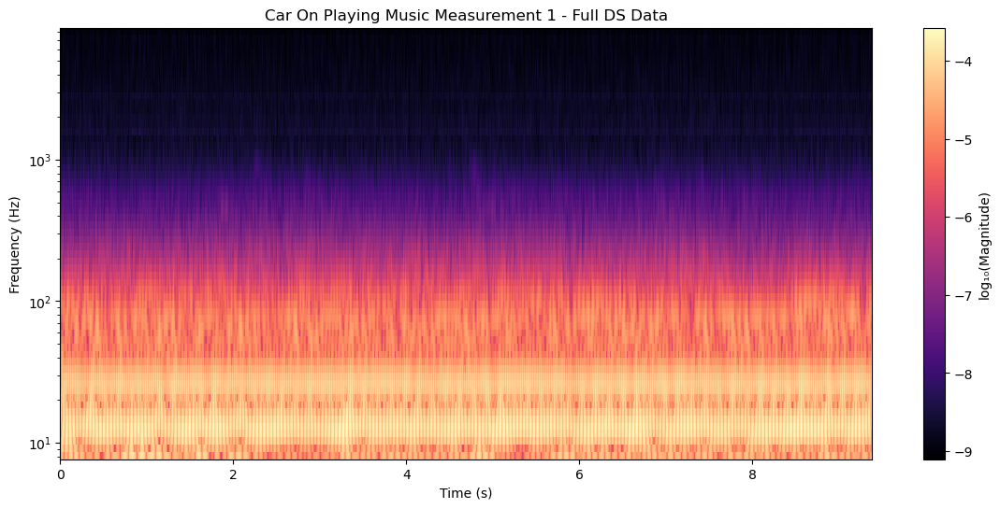

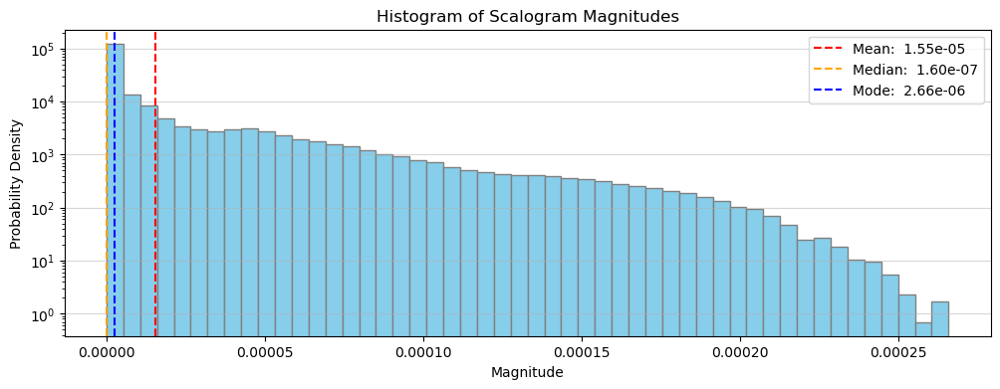

DescribeResult(nobs=14083740, minmax=(7.871584534932533e-10, 0.0002657732449986875), mean=1.5522710531627345e-05, variance=1.0548733172139058e-09, skewness=2.9487810635674836, kurtosis=9.691903418012329)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 223979)
Frequencies shape: (60,)
Time_sec shape: (223979,)


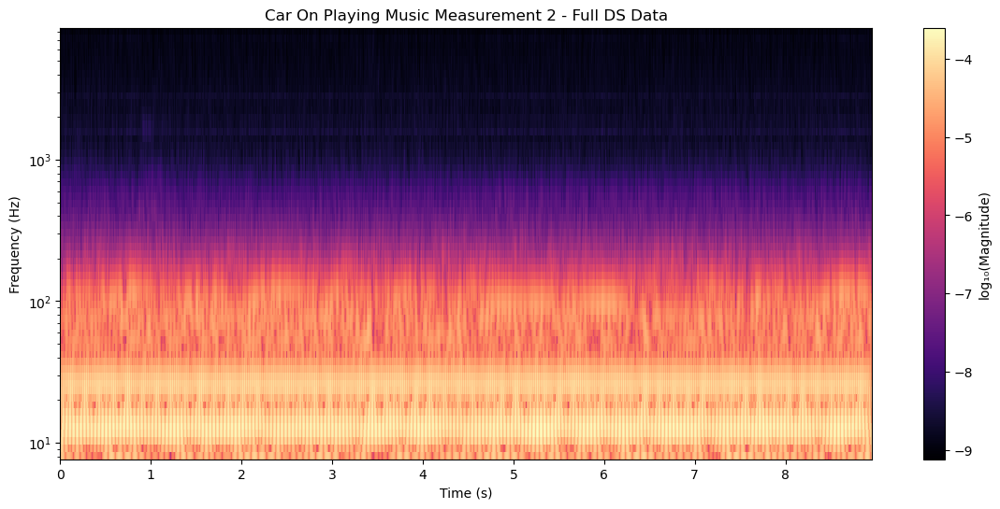

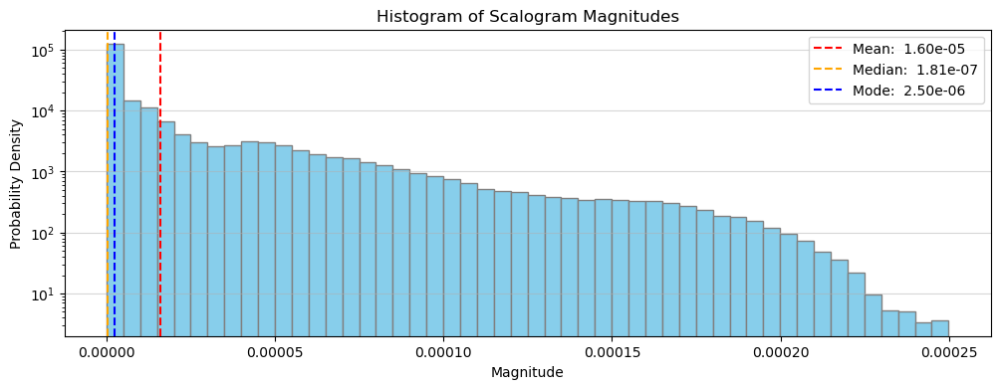

DescribeResult(nobs=13438740, minmax=(7.586977452554805e-10, 0.00024986711704253866), mean=1.5994440185453527e-05, variance=1.0595539704837113e-09, skewness=2.8934579789842414, kurtosis=9.253715989686748)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Frequency range: 8.12 to 8125.00 Hz
Coefficients shape: (60, 223979)
Frequencies shape: (60,)
Time_sec shape: (223979,)


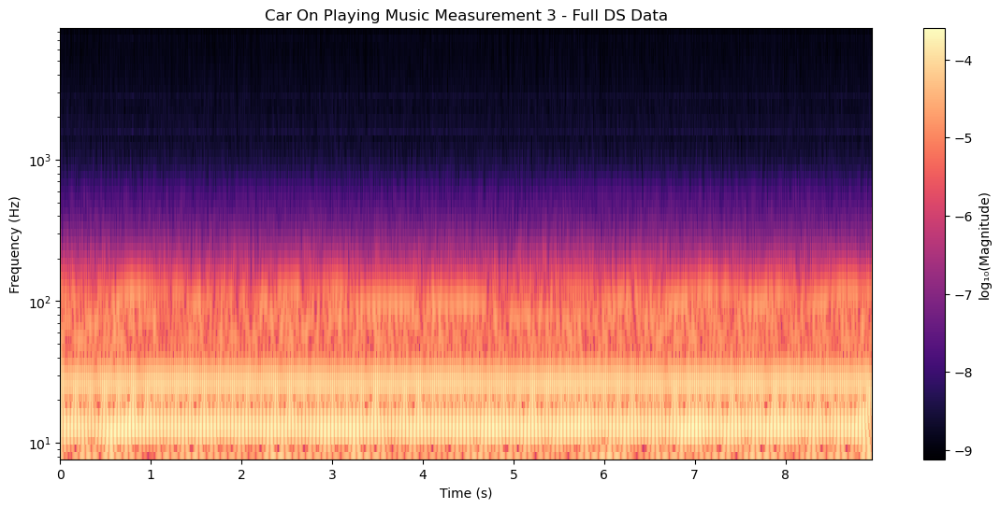

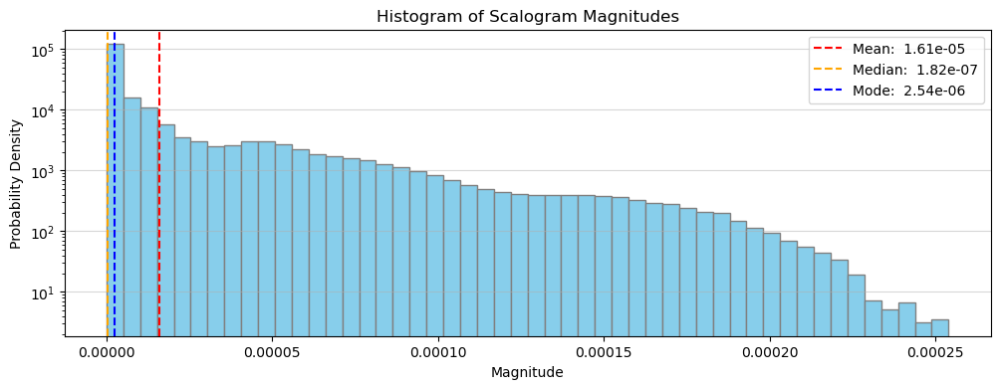

DescribeResult(nobs=13438740, minmax=(7.652243700623263e-10, 0.0002540470486941259), mean=1.6063880170227672e-05, variance=1.0727902316713552e-09, skewness=2.874483149025698, kurtosis=9.104438754291289)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [77]:
for i, dframe in enumerate(car_on_music_dataframes):
    mean_shifted_column=f"Signal{i+1} Zero Mean (m)"
    time_column = f"Time{i+1} (s)"
    data = dframe[mean_shifted_column].values
    #print(f"Data shape: {data.shape}")
    time_sec = dframe[time_column].values
    delta_t = time_sec[1] - time_sec[0] # time step in seconds
    #print(delta_t)

    scale_min = 1.0 / (10000 * delta_t)  # Small scale for high freq, use freq_max=10000
    scale_max = 1.0 / (10 * delta_t)  # Large scale for low freq, use freq_min=10
    scales = np.logspace(np.log10(scale_min), np.log10(scale_max), 60) 
    # Wavelet transform:
    coefficients, frequencies = pywt.cwt(data, scales, 'morl', sampling_period=delta_t)
    print(f"Frequency range: {frequencies.min():.2f} to {frequencies.max():.2f} Hz")
    print(f"Coefficients shape: {coefficients.shape}")
    print(f"Frequencies shape: {frequencies.shape}")
    print(f"Time_sec shape: {time_sec.shape}")
    # Smooth in time direction (axis=1), not frequency (axis=0)
    smoothed_coefficients = uniform_filter(np.abs(coefficients), size=(1, 300)) # changed size from (1,50) to (1,300)
    # Add small epsilon (if needed) to avoid log(0)
    #epsilon = 1e-10  # Small value to prevent log(0)
    #coeffs = (coefficients + epsilon)
    
    # Plot:
    plt.figure(figsize=(14, 6))
    plt.pcolormesh(time_sec, frequencies, np.log10(smoothed_coefficients), cmap='magma', shading='auto')
    plt.colorbar(label='log\u2081\u2080(Magnitude)')
    plt.ylabel('Frequency (Hz)')
    plt.yscale('log')
    plt.xlabel('Time (s)')
    plt.title(f'Car On Playing Music Measurement {i+1} - Full DS Data')
    plt.show()
    
    # Try to make histograms ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    magnitudes = np.abs(smoothed_coefficients)
    magnitude_values = magnitudes.flatten()
    
    fig, ax = plt.subplots(figsize=(12, 4))
    plt.hist(magnitude_values, bins=50, density = True, facecolor='skyblue', edgecolor='grey')
    plt.title("Histogram of Scalogram Magnitudes")
    plt.xlabel("Magnitude")
    plt.ylabel("Probability Density")
    plt.yscale('log')
    plt.grid(axis='y', alpha=0.5)
    plt.axvline(x=np.mean(magnitude_values), color='r', linestyle='--', label=f'Mean: {np.mean(magnitude_values): .2e}')
    plt.axvline(x=np.median(magnitude_values), color='orange', linestyle='--', label=f'Median: {np.median(magnitude_values): .2e}')
    # get mode:
    hist_counts, bin_edges = np.histogram(magnitude_values, bins=50)
    mode_bin_index = np.argmax(hist_counts)
    # Mode is the center of the bin with the highest count:
    mode_value = (bin_edges[mode_bin_index] + bin_edges[mode_bin_index + 1]) / 2
    plt.axvline(x=mode_value, color='b', linestyle='--', label=f'Mode: {mode_value: .2e}')
    plt.legend()
    plt.show()
    # some other stats:
    print(ss.describe(magnitude_values))
    std_dev = np.std(magnitude_values)
    print(f"Standard Deviation: {std_dev:.4f}")
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")

##### Continuous Wavelet Transform
##### Tapered/Subsampled DS Data:

Data shape: (4695,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4695)
Frequencies shape: (60,)
Time_sec shape: (4695,)


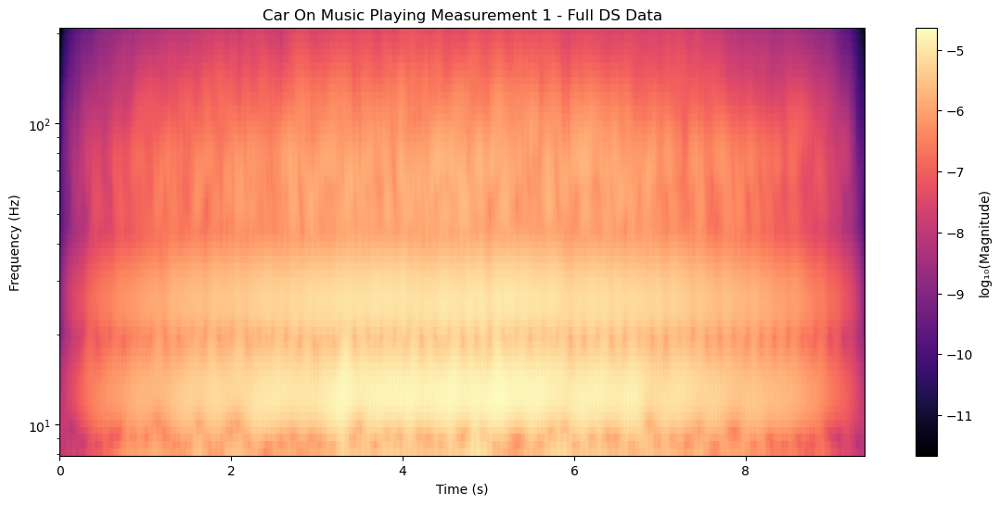

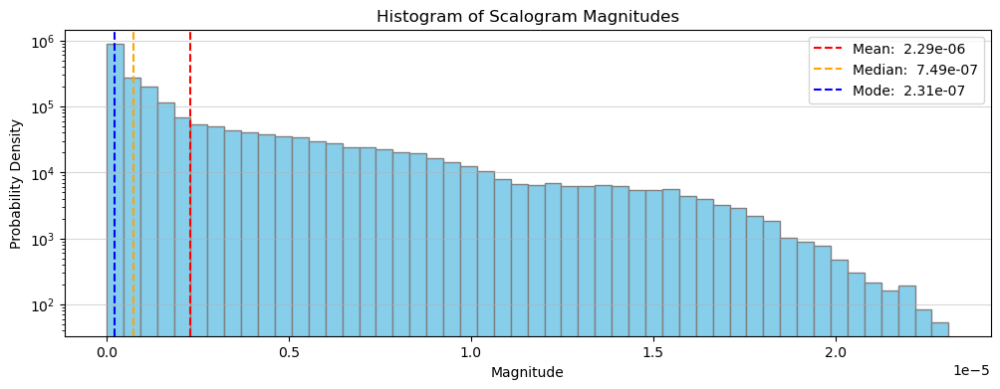

DescribeResult(nobs=281700, minmax=(2.1566754664563405e-12, 2.3105534499246214e-05), mean=2.2887281629120653e-06, variance=1.215717268137724e-11, skewness=2.2203071091731075, kurtosis=5.016017043436509)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4480,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4480)
Frequencies shape: (60,)
Time_sec shape: (4480,)


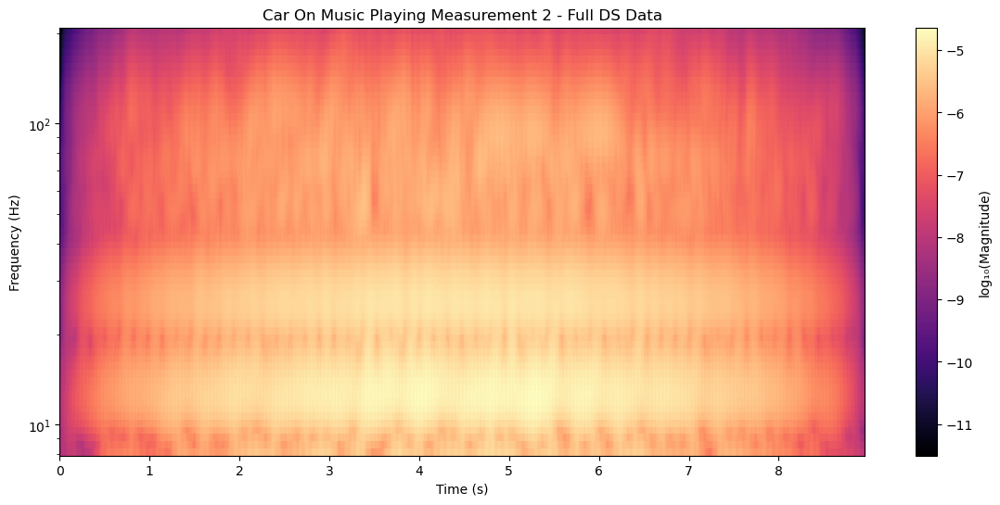

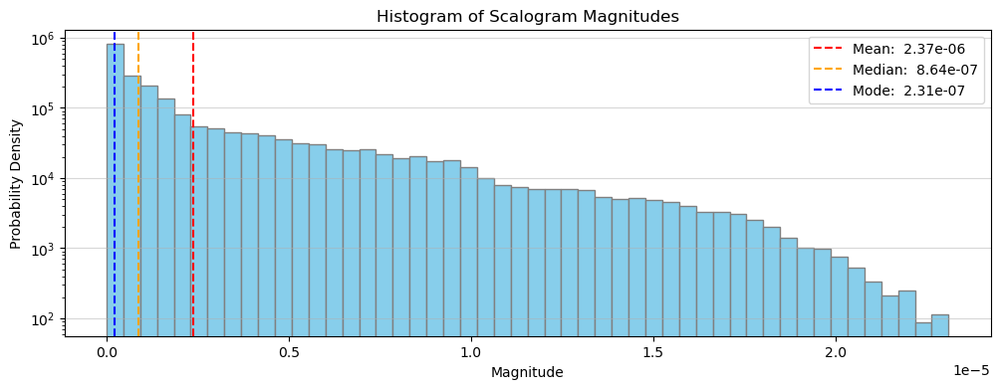

DescribeResult(nobs=268800, minmax=(3.1254373862483022e-12, 2.3103603751163168e-05), mean=2.3748684696670094e-06, variance=1.2264223430475823e-11, skewness=2.201923736707956, kurtosis=5.020486105004402)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Data shape: (4480,)
Frequency range: 8.13 to 203.12 Hz
Coefficients shape: (60, 4480)
Frequencies shape: (60,)
Time_sec shape: (4480,)


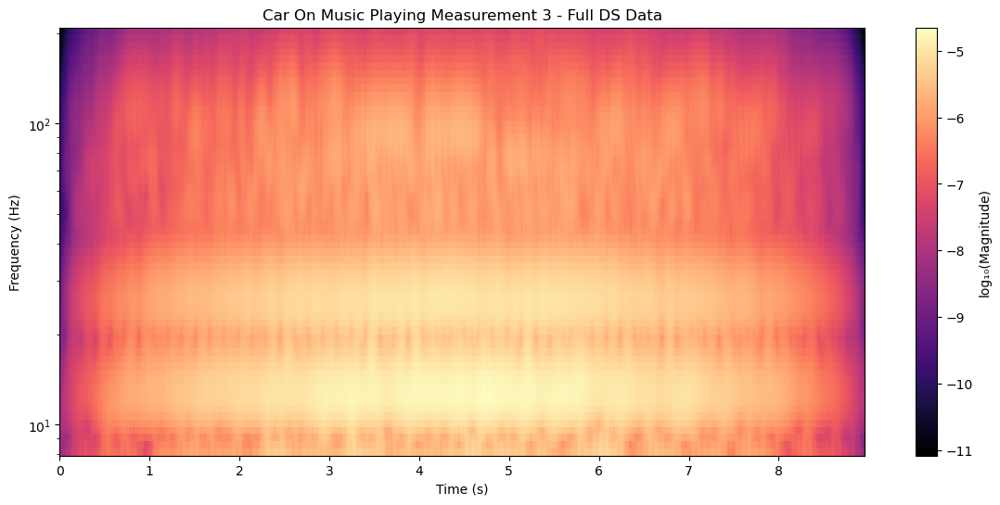

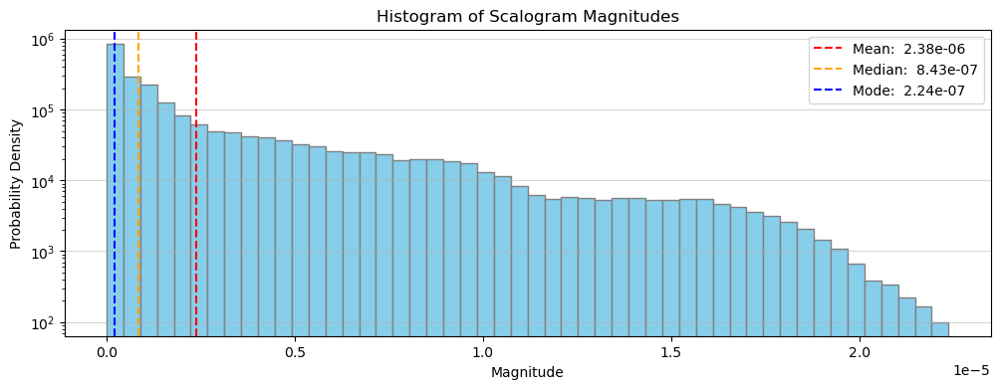

DescribeResult(nobs=268800, minmax=(8.272406330633101e-12, 2.2367609127301805e-05), mean=2.3792270682656392e-06, variance=1.2611245840529096e-11, skewness=2.2186708217342743, kurtosis=5.01345970927364)
Standard Deviation: 0.0000
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [47]:
for i, dframe in enumerate(car_on_music_dataframes):
    mean_shifted_column=f"Signal{i+1} Zero Mean (m)"
    time_column = f"Time{i+1} (s)"
    sub_tap_data = sub_tapered(apply_hann_window(dframe, mean_shifted_column), decimation_factor=50)
    print(f"Data shape: {sub_tap_data.shape}")
    time_sec = dframe[time_column][::50].values # use step == decimation_factor 
    delta_t = time_sec[1] - time_sec[0] # time step in seconds
    #print(delta_t)

    scale_min = 1.0 / (250 * delta_t)  # Small scale for high freq, use freq_max=250
    scale_max = 1.0 / (10 * delta_t)  # Large scale for low freq, use freq_min=10
    scales = np.logspace(np.log10(scale_min), np.log10(scale_max), 60) 
    # Wavelet transform:
    coefficients, frequencies = pywt.cwt(sub_tap_data, scales, 'morl', sampling_period=delta_t)
    print(f"Frequency range: {frequencies.min():.2f} to {frequencies.max():.2f} Hz")
    print(f"Coefficients shape: {coefficients.shape}")
    print(f"Frequencies shape: {frequencies.shape}")
    print(f"Time_sec shape: {time_sec.shape}")
    # Smooth in time direction (axis=1), not frequency (axis=0)
    smoothed_coefficients = uniform_filter(np.abs(coefficients), size=(1, 50))
    # Add small epsilon (if needed) to avoid log(0)
    #epsilon = 1e-10  # Small value to prevent log(0)
    #coeffs = (coefficients + epsilon)
    
    # Plot:
    plt.figure(figsize=(14, 6))
    plt.pcolormesh(time_sec, frequencies, np.log10(smoothed_coefficients), cmap='magma', shading='auto')
    plt.colorbar(label='log\u2081\u2080(Magnitude)')
    plt.ylabel('Frequency (Hz)')
    plt.yscale('log')
    plt.xlabel('Time (s)')
    plt.title(f'Car On Music Playing Measurement {i+1} - Full DS Data')
    plt.show()

    # Try to make histograms ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    magnitudes = np.abs(smoothed_coefficients)
    magnitude_values = magnitudes.flatten()
    
    fig, ax = plt.subplots(figsize=(12, 4))
    plt.hist(magnitude_values, bins=50, density = True, facecolor='skyblue', edgecolor='grey')
    plt.title("Histogram of Scalogram Magnitudes")
    plt.xlabel("Magnitude")
    plt.ylabel("Probability Density")
    plt.yscale('log')
    plt.grid(axis='y', alpha=0.5)
    plt.axvline(x=np.mean(magnitude_values), color='r', linestyle='--', label=f'Mean: {np.mean(magnitude_values): .2e}')
    plt.axvline(x=np.median(magnitude_values), color='orange', linestyle='--', label=f'Median: {np.median(magnitude_values): .2e}')
    # get mode:
    hist_counts, bin_edges = np.histogram(magnitude_values, bins=50)
    mode_bin_index = np.argmax(hist_counts)
    # Mode is the center of the bin with the highest count:
    mode_value = (bin_edges[mode_bin_index] + bin_edges[mode_bin_index + 1]) / 2
    plt.axvline(x=mode_value, color='b', linestyle='--', label=f'Mode: {mode_value: .2e}')
    plt.legend()
    plt.show()
    # some other stats:
    print(ss.describe(magnitude_values))
    std_dev = np.std(magnitude_values)
    print(f"Standard Deviation: {std_dev:.4f}")
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")